# Balance of Evidence simulations. Value-based experiment

In [42]:
import glam
import pandas as pd
import numpy as np
import os.path
from statsmodels.stats.outliers_influence import summary_table
import matplotlib.patches as mpatches


In [43]:
import matplotlib.pyplot as plt

from scipy.stats import invgauss
import seaborn as sns
import matplotlib.pyplot as plt
#plt.switch_backend('agg')
from scipy import stats
from scipy.stats.stats import pearsonr # Pearson's correlation
import statsmodels.api as sm

#import warnings
#warnings.filterwarnings('ignore')

In [44]:
np.random.seed(23) # from random.org

In [45]:
# For rpy2

import rpy2

%load_ext rpy2.ipython
# Set up interface with R
# Make it easy to set and find values in a multi-index DF
idx = pd.IndexSlice

# Set up interface with R
%config InlineBackend.figure_format = 'retina'
import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore", category=RRuntimeWarning)


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [46]:
# For MacMini proper running
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [47]:
def correl_plot(data_all,x_variable, x_varlabel,y_variable,y_varlabel):

    f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_all, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
    #sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
    #exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
    #exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
    #plt.legend(handles=[exp1, exp2], loc=3)
    x=data_all[x_variable]
    y=data_all[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    ax.plot(future, future_fit, color='Green', lw=3)
    sns.despine()
    #ax.set_title(title)    
    results = pearsonr(data_all[x_variable], data_all[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    plt.show()

In [197]:
def z_score1(data_all, part_def,z_score_var):
    z_matrix=[]
    z_matrix_aux=[]

    for i in (data_all[part_def].unique()):
        Choicedata = data_all.loc[data_all[part_def] == i]    
    
        pX_A= pd.to_numeric(Choicedata[z_score_var]) 
        pX_zA= (pX_A - np.mean(pX_A))/np.std(pX_A)

        z_matrix_aux= pX_zA.values
    
        for  j in range(len(z_matrix_aux)):    
            z_matrix.append(z_matrix_aux[j])
    return z_matrix

In [49]:
%%R
library(lme4)
#library(car)
library(optimx)
library(ggplot2)
library(MASS)
library(broom)
library(dplyr)
library(reshape2)
library(arm)  # required for coefplot
library(multcomp)
library(pbkrtest)

## Custom functions

In [50]:
def balance_evidence(value_tests, gaze_tests, parameters,boundary, error_weight, error_range,n_repeats):
    
    mean_rts_trials = np.zeros((value_tests.shape[0])) * np.nan
    choice_trials = np.zeros((value_tests.shape[0])) * np.nan
    DEv_trials = np.zeros((value_tests.shape[0])) * np.nan
    AbsDEv_trials = np.zeros((value_tests.shape[0])) * np.nan
    Ev_drifts_0_trials  = []
    Ev_drifts_1_trials = []

    n_trials, n_items = value_tests.shape

    running_idx_value = 0
    #we iterate for all the combinations of trials + gaze
    for trial in range(n_trials):
        
            # intialize the drifts
            evidence_drifts_0 = []
            evidence_drifts_1 = []

            #define value and gaze values for this particular trial
            value_trial =value_tests[trial]
            gaze_trial =gaze_tests[trial]
            
            Sim_value = value_trial
            Sim_gaze = gaze_trial
            
            Delta_E = np.zeros(n_repeats) * np.nan            
            AbsDelta_E = np.zeros(n_repeats) * np.nan
            rts = np.zeros(n_repeats) * np.nan
            choices = np.zeros(n_repeats) * np.nan
            trial_idx = np.zeros(n_repeats) * np.nan
            repeat_idx = np.zeros(n_repeats) * np.nan
            running_idx = 0
        
            for repeat in range(n_repeats):
                    

                    
                    Evi_0, Evi_1, choice, rt = glam.driftSim.simulate_trial_drift(parameters, value_trial, gaze_trial,
                                                boundary=boundary,
                                                error_weight=error_weight,
                                                error_range=error_range)
                    
                    Delta_E[running_idx] = Evi_1[-1] - Evi_0[-1]
                    AbsDelta_E[running_idx] = abs(Evi_0[-1] - Evi_1[-1])                        
                    rts[running_idx] = rt
                    choices[running_idx] = choice
                    trial_idx[running_idx] = trial
                    repeat_idx[running_idx] = repeat
                    # Add a new sequence of drift for this particular trial
                    evidence_drifts_0.append(Evi_0)
                    evidence_drifts_1.append(Evi_1)
                    
                    running_idx += 1
                    
               
            # Add the mean value for this parameters interation               
            mean_rts_trials [running_idx_value] = rts.mean()
            choice_trials [running_idx_value]= choices.mean() 
            DEv_trials [running_idx_value] = Delta_E.mean()
            AbsDEv_trials [running_idx_value]= AbsDelta_E.mean()
            Ev_drifts_0_trials.append(evidence_drifts_0)
            Ev_drifts_1_trials.append(evidence_drifts_1)
 
            running_idx_value += 1 

    return AbsDEv_trials,mean_rts_trials,Ev_drifts_0_trials,Ev_drifts_1_trials,choice_trials

In [51]:
def z_score1(data_all, part_def,z_score_var):
    z_matrix=[]
    z_matrix_aux=[]

    for i in (data_all[part_def].unique()):
        Choicedata = data_all.loc[data_all[part_def] == i]    
    
        pX_A= pd.to_numeric(Choicedata[z_score_var]) 
        pX_zA= (pX_A - np.mean(pX_A))/np.std(pX_A)

    
        z_matrix_aux= pX_zA.values
    
        for  j in range(len(z_matrix_aux)):    
            z_matrix.append(z_matrix_aux[j])
    return z_matrix

In [52]:
def correl_plot(data_all,x_variable, x_varlabel,y_variable,y_varlabel):

    f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_all, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
    #sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
    #exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
    #exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
    #plt.legend(handles=[exp1, exp2], loc=3)
    x=data_all[x_variable]
    y=data_all[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    ax.plot(future, future_fit, color='Green', lw=3)
    sns.despine()
    #ax.set_title(title)    
    results = pearsonr(data_all[x_variable], data_all[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    plt.show()

In [53]:
def add_difficulty(df):
    """
    Compute trial difficulties and add to DataFrame.

    Maximum value -  other values.
    In the binary case, this reduces to abs(v0 - v1).

    Parameters
    ----------
    df :      <pandas DataFrame>
              Trial wise DataFrame containing columns for item_value_i
    """

    values = df[['LVal','RVal']].values
    values_sorted = np.sort(values, axis=1)
    difficulty = values_sorted[:, -1] - np.mean(values_sorted[:, :-1], axis=1)

    levels =  (np.max(difficulty) - np.min(difficulty))/10

    lev_label = np.arange(np.min(difficulty), np.max(difficulty) + levels,levels) 
    
    difficulty2= []
    for i in range(len(difficulty)):
         difficulty2.append( lev_label[ int(difficulty[i]//levels)] )
     
    difficulty = difficulty2
    
    df['difficulty'] = np.around(difficulty, decimals = 0)
    df['difficulty'] = difficulty
    
    return df.copy()

In [54]:
def plot_DEv_Conf(data, ax=None, xlims=(0, 10), xlabel_skip=2,color1 = '#4F6A9A',label1 = 'Like',label2 = 'GLAM Simulations'):

    if ax is None:
        fig, ax = plt.subplots(figsize=(14, 15))
        # Set seaborn style for the plot
        sns.set(style='white')

    df = data.copy()

    # Compute relevant variables
    df = add_difficulty(df)
    
    
    # select data to use
    
    data_labels = ['zConf_human','zAbsDEv']
    
    for i in range(len(data_labels)):
        # Compute summary statistics
        subject_means = df.groupby(['Part', 'difficulty'])[data_labels[i]].mean()
        means = subject_means.groupby('difficulty').mean()[xlims[0]:xlims[1]]
        sems = subject_means.groupby('difficulty').sem()[xlims[0]:xlims[1]]
    
        x = np.arange(len(means))
        
        # Add labels for scatter plot of mean rt per participant
        scatter_data = subject_means.reset_index()
        x_scatter = []
        group_labels = np.sort(scatter_data.difficulty.unique())
        for ii in range(len(scatter_data.difficulty.values)):
            a = scatter_data.difficulty.values[ii]
            position_item =  x[np.where(group_labels==a)[0][0]]
            x_scatter.append(position_item) 
        ## ********    
        
        predicted = False if i == 0 else True
        
        # Colors for predicted
        c_pred = [color1,'#606060','#607681' ]
        
        if not predicted:  # plot underlying data
            ax.plot(x, means, 'o', markerfacecolor=color1, markersize = 10, fillstyle = 'full',
                    color=color1, linewidth=1)
            ax.vlines(x, means - sems, means + sems,
                      linewidth=1, color= color1)
            jittr = np.random.uniform(low=-max(x)/20,high=max(x)/20,size=len(scatter_data))/2
            ax.plot(x_scatter+jittr, scatter_data[data_labels[i]].values, marker='o', ms=5, color=color1,alpha=0.3,linestyle="None")
    
        else:  # plot predictions
            ax.plot(x, means, '-o', markerfacecolor=c_pred[i],color=c_pred[i], linewidth=2.5, markersize = 10)

    #ax.set_ylim(2000, 3500)
    font_size_this = 40
    ax.set_xlabel('|ΔValue|',fontsize=font_size_this)
    ax.set_ylabel( r'zΔe / zConfidence',fontsize=font_size_this)
    ax.set_xticks(x[::xlabel_skip])
    ax.tick_params(axis = 'y',labelsize=font_size_this)
    ax.tick_params(axis = 'x',labelsize=font_size_this)

    ax.set_xticklabels(np.around(means.index.values[::xlabel_skip],decimals = 1))
    
    patch1 = mpatches.Patch(facecolor=color1,hatch=r'', label = label1)
    patch2 = mpatches.Patch(facecolor='#606060',hatch=r'', label = label2)

    leg = plt.legend(handles=[patch1,patch2],fontsize=25,loc = 'lower right')
    leg.get_frame().set_facecolor('none')
    leg.get_frame().set_linewidth(0.0)
    
    sns.despine()



In [55]:
def add_difficulty_TotVal(df,TotVal_label):
    """
    Compute trial difficulties and add to DataFrame.

    Maximum value -  other values.
    In the binary case, this reduces to abs(v0 - v1).

    Parameters
    ----------
    df :      <pandas DataFrame>
              Trial wise DataFrame containing columns for item_value_i
    """

    difficulty = df[[TotVal_label]].values

    levels =  (np.max(difficulty) - np.min(difficulty))/10

    lev_label = np.arange(np.min(difficulty), np.max(difficulty) + levels,levels) 
    
    difficulty2= []
    for i in range(len(difficulty)):
         difficulty2.append( lev_label[ int(difficulty[i]//levels)] )
     
    difficulty = difficulty2
    
    df['difficulty'] = np.around(difficulty, decimals = 0)
    df['difficulty'] = difficulty
    
    return df.copy()

In [56]:
def plot_DEv_Conf_TotVal(data, TotVal_label, ax=None, xlims=(0, 10), xlabel_skip=2,color1 = '#4F6A9A',label1 = 'Like',label2 = 'GLAM Simulations'):

    if ax is None:
        fig, ax = plt.subplots(figsize=(14, 15))
        # Set seaborn style for the plot
        sns.set(style='white')

    df = data.copy()

    # Compute relevant variables
    df = add_difficulty_TotVal(df,TotVal_label)
    print ('Done with TotVal')
    
    # select data to use
    
    data_labels = ['zConf_human','zAbsDEv']
    
    for i in range(len(data_labels)):
        # Compute summary statistics
        subject_means = df.groupby(['Part','difficulty'])[data_labels[i]].mean()
        means = subject_means.groupby('difficulty').mean()[xlims[0]:xlims[1]]
        sems = subject_means.groupby('difficulty').sem()[xlims[0]:xlims[1]]
    
        x = np.arange(len(means))
        
        # Add labels for scatter plot of mean rt per participant
        scatter_data = subject_means.reset_index()
        x_scatter = []
        group_labels = np.sort(scatter_data.difficulty.unique())
        for ii in range(len(scatter_data.difficulty.values)):
            a = scatter_data.difficulty.values[ii]
            position_item =  x[np.where(group_labels==a)[0][0]]
            x_scatter.append(position_item) 
        ## ********    
        
        predicted = False if i == 0 else True
        
        # Colors for predicted
        c_pred = [color1,'#606060','#607681' ]
        
        if not predicted:  # plot underlying data
            ax.plot(x, means, 'o', markerfacecolor=color1, markersize = 10, fillstyle = 'full',
                    color=color1, linewidth=1)
            ax.vlines(x, means - sems, means + sems,
                      linewidth=1, color= color1)
            jittr = np.random.uniform(low=-max(x)/20,high=max(x)/20,size=len(scatter_data))/2
            ax.plot(x_scatter+jittr, scatter_data[data_labels[i]].values, marker='o', ms=5, color=color1,alpha=0.3,linestyle="None")
    
        else:  # plot predictions
            ax.plot(x, means, '-o', markerfacecolor=c_pred[i],color=c_pred[i], linewidth=2.5, markersize = 10)
    font_size_this = 40
    #ax.set_ylim(2000, 3500)
    ax.set_xlabel('|ΣValue|',fontsize=font_size_this)
    ax.set_ylabel( r'zΔe / zConfidence',fontsize=font_size_this)
    ax.set_xticks(x[::xlabel_skip])
    ax.tick_params(axis = 'y',labelsize=font_size_this)
    ax.tick_params(axis = 'x',labelsize=font_size_this)
    ax.set_xticklabels(np.around(means.index.values[::xlabel_skip],decimals = 1))
    
    patch1 = mpatches.Patch(facecolor=color1,hatch=r'', label = label1)
    patch2 = mpatches.Patch(facecolor='#606060',hatch=r'', label = label2)

    leg = plt.legend(handles=[patch1,patch2],fontsize=25,loc = 'lower right')
    leg.get_frame().set_facecolor('none')
    leg.get_frame().set_linewidth(0.0)
    
    sns.despine()


## Define some parameters for the simulations


In [57]:
# Parameters for the simulations
boundary=1
error_weight=0.05

## Load data and GLAM structure (Like & Dislike)
Used no bins data for simulation. Value for dislike frames is already inverted

In [58]:
data = pd.read_csv(str('data/FF2018_data/GlamDataFF2018_Like_NoBin_31.csv'))
# Subset only necessary columns
data = data[['subject', 'trial', 'choice', 'rt',
         'item_value_0', 'item_value_1',
         'gaze_0', 'gaze_1']]

data2 = pd.read_csv(str('data/FF2018_data/GlamDataFF2018_Dislike_NoBin_Inv_31.csv'))
# Subset only necessary columns
data2 = data2[['subject', 'trial', 'choice', 'rt',
         'item_value_0', 'item_value_1',
         'gaze_0', 'gaze_1']]

In [59]:
# Load data for FF2018 study 

# Like condition 

data_all0 = pd.read_csv('data/FF2018_data/DataFoodFramingNotebook_31.csv')
data_all0 = data_all0.drop(['Unnamed: 0'], axis=1)
data_all = data_all0.loc[data_all0['BlockCond'] == 1] # 1 = Like, 2 = Dislike

data_all=data_all.rename(index=str, columns={"ChosenITM":"Choice", 
                              "ChoiceRT":"RT",
                             "RValue":"RVal",
                             "LValue":"LVal",
                             "zRValue":"zRVal",
                             "zLValue":"zLVal",                    
                             "tDDT":"DDT",
                             "absDDT":"zAbsDDT",
                             "lIA_DT":"LDwellTime",
                             "rIA_DT":"RDwellTime",
                             "tGSF":"GSF",
                             "lastFixat":"LastFixat",
                             "DV":"DVal",
                             "zDV":"zDVal",
                             "absDV":"AbsDVal",
                             "zAbsDV":"zAbsDVal",                    
                             "zChoiceRT":"zRT",
                             "FamCh":"ChosenFam",
                              "FamUnCh":"UnchosenFam",
                              "ValCh":"ChosenVal",
                              "ValUnCh":"UnchosenVal",
                             "zFamCh":"zChosenFam",
                              "zFamUnCh":"zUnchosenFam",
                              "zValCh":"zChosenVal",
                              "zValUnCh":"zUnchosenVal",                   
                              "GSFMedSplit":"GSFSplit",
                            "DDTMedSplit":"DDTSplit"})

# Dislike condition

data_all2 = data_all0.loc[data_all0['BlockCond'] == 2] # 1 = Like, 2 = Dislike

data_all2=data_all2.rename(index=str, columns={"ChosenITM":"Choice", 
                              "ChoiceRT":"RT",
                             "RValue":"RVal",
                             "LValue":"LVal",
                             "zRValue":"zRVal",
                             "zLValue":"zLVal",                    
                             "tDDT":"DDT",
                             "absDDT":"zAbsDDT",
                             "lIA_DT":"LDwellTime",
                             "rIA_DT":"RDwellTime",
                             "tGSF":"GSF",
                             "lastFixat":"LastFixat",
                             "DV":"DVal",
                             "zDV":"zDVal",
                             "absDV":"AbsDVal",
                             "zAbsDV":"zAbsDVal",                    
                             "zChoiceRT":"zRT",
                             "FamCh":"ChosenFam",
                              "FamUnCh":"UnchosenFam",
                              "ValCh":"ChosenVal",
                              "ValUnCh":"UnchosenVal",
                             "zFamCh":"zChosenFam",
                              "zFamUnCh":"zUnchosenFam",
                              "zValCh":"zChosenVal",
                              "zValUnCh":"zUnchosenVal",                   
                              "GSFMedSplit":"GSFSplit",
                            "DDTMedSplit":"DDTSplit"})

---------------------------------------------------------
# Like condition


## Load parameter estimates for participants


Use the parameter estimates from GLAM fit for Like, Binned data

In [60]:
sufix = 'individual_Like_NoBin_Gamma-11_NUTS_31'
glam_full = glam.GLAM(data)
glam_full.estimates = np.load(str('results/estimates/glam_FF2019_full_'+sufix+'.npy'))

# generate dataframe with new params
params_part_like = pd.DataFrame()
for i in range(len(glam_full.estimates)):    
    params_part_like1 = pd.DataFrame.from_dict(glam_full.estimates.item(i))
    params_part_like = pd.concat([params_part_like ,params_part_like1])
    
params_part_like = params_part_like.reset_index(drop=True)

params_part = params_part_like
params_part

,b,p_error,v,gamma,SNR,s,tau,t0
0,1.0,0.05,0.000044,0.01,179.94,0.007742,4.77,0.0
1,1.0,0.05,0.000075,0.80,44.31,0.005750,0.56,0.0
2,1.0,0.05,0.000057,0.14,107.97,0.008394,1.87,0.0
3,1.0,0.05,0.000042,-0.05,174.89,0.007141,4.70,0.0
4,1.0,0.05,0.000091,0.05,73.46,0.006764,2.34,0.0
5,1.0,0.05,0.000064,0.38,107.44,0.007028,1.45,0.0
6,1.0,0.05,0.000077,0.01,116.09,0.009647,2.22,0.0
7,1.0,0.05,0.000043,0.07,152.56,0.007672,1.60,0.0
8,1.0,0.05,0.000055,-0.88,174.54,0.009078,1.04,0.0
9,1.0,0.05,0.000046,0.25,170.19,0.008060,4.81,0.0


# Run drift simulations for selected values and parameters

#  1. Including gaze information in the simulation 

In [61]:
if os.path.exists(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv')):  
        data_simulation = pd.read_csv(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv'))

In [62]:
# repeats only once so we obtain one accumulator race for each difference in value given by participants DV used.
n_repeats = 1 # Repeats within the accumulator function
repeat_extra = 10 # Repeat outside the accumulator function
gaze_out = 0 # We DO want to use the gaze from the particpants

In [63]:
if not os.path.exists(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv')):  
    Part_number = []
    LVal = []
    RVal = []
    LGaze = []
    RGaze = []
    absDVal = []
    TotVal = []
    AbsDEvid = []
    RT_sim = []
    Correct_sim = []
    Choice_sim = []
    Conf_human = []
    zConf_human = []
    
    part_id = data_all['Part'].unique()
    
    for i in (data['subject'].unique()):    
        for k in range(0,repeat_extra) :
            PartData = data.loc[data['subject'] == i] # dataframe including participant GLAM data
            PartDataAll = data_all.loc[data_all['Part'] == part_id[i]] # dataframe including participant all data

            value_tests =np.column_stack((PartData['item_value_0'].values,PartData['item_value_1'].values))
            
            # get confidence from participants and add to the simulations datasets
            conf_tests =PartDataAll['Conf'].values
            zconf_tests =PartDataAll['zConf'].values
            
            if gaze_out == 1:
                gaze_tests = np.matlib.repmat([0.5, 0.5], len(value_tests),1)
            else:
                gaze_tests =np.column_stack((PartData['gaze_0'].values,PartData['gaze_1'].values))

            # We keep the same parameters for this case. 
            gamma = params_part['gamma'] [i]
            tau = params_part['tau'][i]
            v = params_part['v'][i]
            s = params_part['s'][i]
            t0 = 0
            
            parameters = [v , gamma, s, tau, t0]
            ## error_range given by the reaction time values for an individual participant
            rt_min = glam_full.data['rt'].values.min()
            rt_max = glam_full.data['rt'].values.max()
            error_range = (rt_min, rt_max)
        
            Dev_a, rts,evi_seq_0,evi_seq_1,choices = balance_evidence(value_tests, gaze_tests, parameters,boundary, error_weight, error_range,n_repeats)

            LVal_tmp = [item[0] for item in value_tests]
            RVal_tmp = [item[1] for item in value_tests]
            
            LGaze_tmp = [item[0] for item in gaze_tests]
            RGaze_tmp = [item[1] for item in gaze_tests]
            
            
            for  j in range(len(Dev_a)):
                
                Part_number.append(i)
                Conf_human.append(conf_tests[j])
                zConf_human.append(zconf_tests[j])
                
                LVal.append(LVal_tmp[j])
                RVal.append(RVal_tmp[j])
                
                LGaze.append(LGaze_tmp[j])
                RGaze.append(RGaze_tmp[j])
                
                absDVal.append(abs(RVal_tmp[j] -  LVal_tmp[j]))
                TotVal.append(RVal_tmp[j] +  LVal_tmp[j])
                
                if (choices[j] == 1 and value_tests[j][1]>value_tests[j][0]) or (choices[j] == 0 and value_tests[j][1]<value_tests[j][0]):
                    Correct_sim.append(1)
                else:
                    Correct_sim.append(0)
                    
                AbsDEvid.append(Dev_a[j])
                RT_sim.append(rts[j])
                Choice_sim.append(choices[j])

        print ("subj " + str(i))
        
    data_simulation =  pd.DataFrame()
    data_simulation["Part"] = Part_number
    data_simulation["LVal"] = LVal
    data_simulation["RVal"] = RVal
    data_simulation["LGaze"] = LGaze
    data_simulation["RGaze"] = RGaze
    data_simulation["AbsDVal"] = absDVal
    data_simulation["TotVal"] = TotVal
    data_simulation["AbsDEv"] = AbsDEvid
    data_simulation["RTsim"] = RT_sim
    data_simulation["Correct_sim"] = Correct_sim
    data_simulation["Choice_sim"] = Choice_sim
    data_simulation["Conf_human"] = Conf_human
    data_simulation["zConf_human"] = zConf_human
    
    data_simulation["zLVal"] = z_score1(data_simulation,'Part',"LVal")
    data_simulation["zRVal"] = z_score1(data_simulation,'Part',"RVal")
    data_simulation["zAbsDVal"] = z_score1(data_simulation,'Part',"AbsDVal")
    data_simulation["zTotVal"] = z_score1(data_simulation,'Part',"TotVal")
    data_simulation["zAbsDEv"] = z_score1(data_simulation,'Part',"AbsDEv")
    data_simulation["zRTsim"] = z_score1(data_simulation,'Part',"RTsim")

In [64]:
if not  os.path.exists(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv')):   
        data_simulation.to_csv(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv'))

In [65]:
data_simulation

,Unnamed: 0,Part,LVal,RVal,LGaze,RGaze,AbsDVal,TotVal,AbsDEv,RTsim,Correct_sim,Choice_sim,Conf_human,zConf_human,zLVal,zRVal,zAbsDVal,zTotVal,zAbsDEv,zRTsim
0,0,0,1.10,0.95,0.568396,0.431604,0.15,2.05,0.325125,7290.0,0,1.0,80,0.582155,-0.898735,-1.237881,-0.988498,-1.497033,-1.334244,4.369550
1,1,0,2.00,1.70,0.762332,0.237668,0.30,3.70,1.241681,2797.0,1,0.0,78,0.432565,1.136137,0.457846,-0.570823,1.116834,1.086036,0.132824
2,2,0,1.10,2.30,0.446809,0.553191,1.20,3.40,1.135265,3257.0,1,1.0,82,0.731746,-0.898735,1.814428,1.935228,0.641585,0.805032,0.566586
3,3,0,1.25,1.40,0.532352,0.467648,0.15,2.65,0.624405,2362.0,0,0.0,42,-2.260059,-0.559590,-0.220445,-0.988498,-0.546536,-0.543959,-0.277364
4,4,0,2.00,2.30,0.529736,0.470264,0.30,4.30,0.822202,4187.0,1,1.0,70,-0.165796,1.136137,1.814428,-0.570823,2.067331,-0.021650,1.443541
5,5,0,1.70,1.85,0.370529,0.629471,0.15,3.55,0.970917,1963.0,1,1.0,74,0.133385,0.457846,0.796992,-0.988498,0.879210,0.371049,-0.653606
6,6,0,1.85,0.65,0.482254,0.517746,1.20,2.50,1.310332,2091.0,1,0.0,70,-0.165796,0.796992,-1.916172,1.935228,-0.784160,1.267319,-0.532907
7,7,0,1.55,0.80,0.670739,0.329261,0.75,2.35,1.543186,2441.0,1,0.0,76,0.282975,0.118701,-1.577026,0.682203,-1.021784,1.882198,-0.202870
8,8,0,1.55,1.10,0.528497,0.471503,0.45,2.65,0.746699,2235.0,1,0.0,90,1.330107,0.118701,-0.898735,-0.153148,-0.546536,-0.221027,-0.397120
9,9,0,1.10,2.00,0.581579,0.418421,0.90,3.10,0.622275,3935.0,1,1.0,54,-1.362518,-0.898735,1.136137,1.099878,0.166337,-0.549584,1.205914


Pearson's r = 0.046 p =  0.0


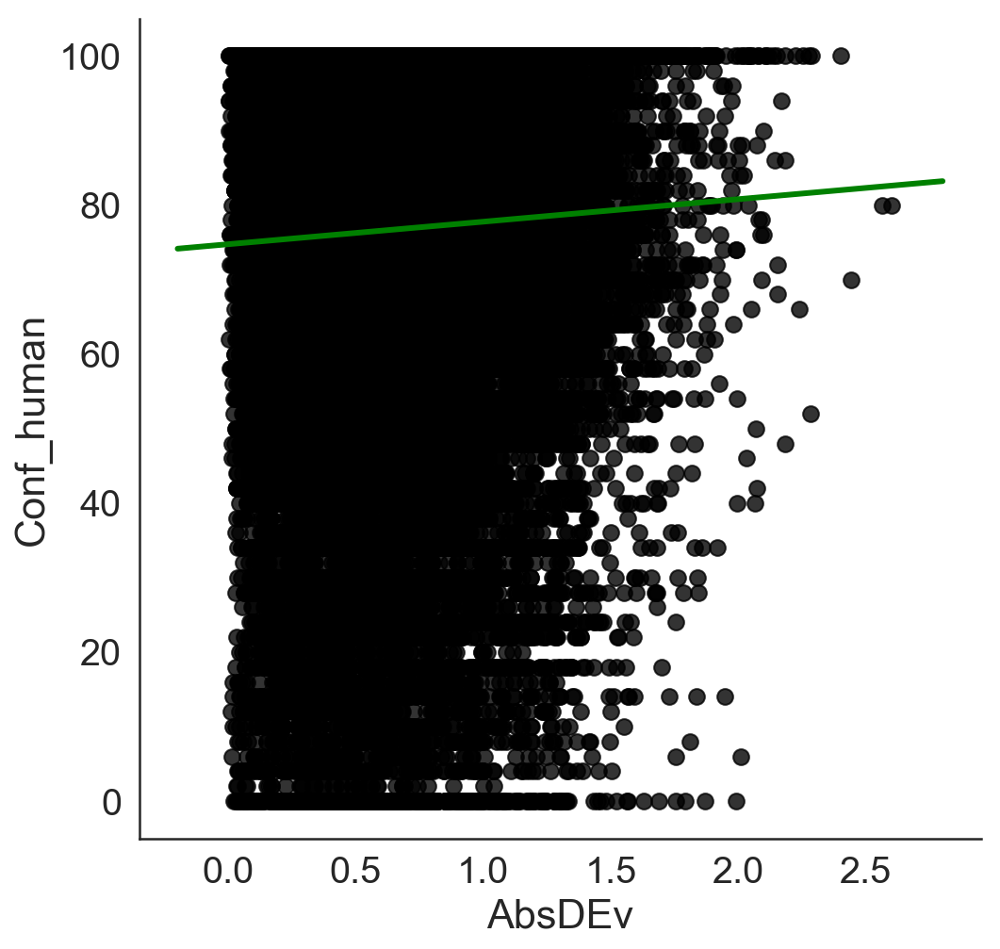

Pearson's r = 0.078 p =  0.0


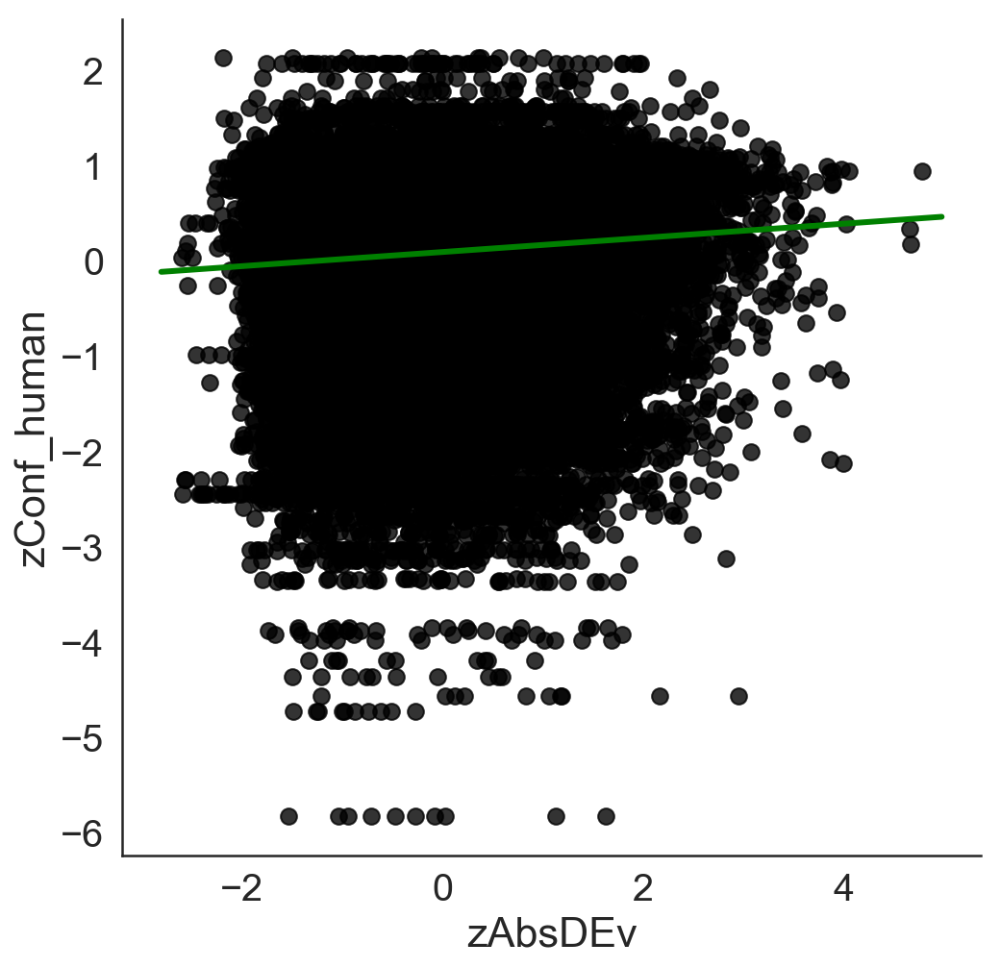

In [66]:
correl_plot(data_simulation,'AbsDEv', "AbsDEv",'Conf_human','Conf_human')
correl_plot(data_simulation,'zAbsDEv', "zAbsDEv",'zConf_human','zConf_human')

In [67]:
%%R -i data_simulation
d <- data_simulation

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  res = PandasDataFrame.from_items(items)


BIC: 101510.1
Call:  glm(formula = zAbsDEv ~ zAbsDVal + zTotVal + zRTsim, data = d)

Coefficients:
(Intercept)     zAbsDVal      zTotVal       zRTsim  
 -6.197e-16    1.738e-01    7.110e-02   -2.233e-01  

Degrees of Freedom: 37199 Total (i.e. Null);  37196 Residual
Null Deviance:	    37200 
Residual Deviance: 33310 	AIC: 101500


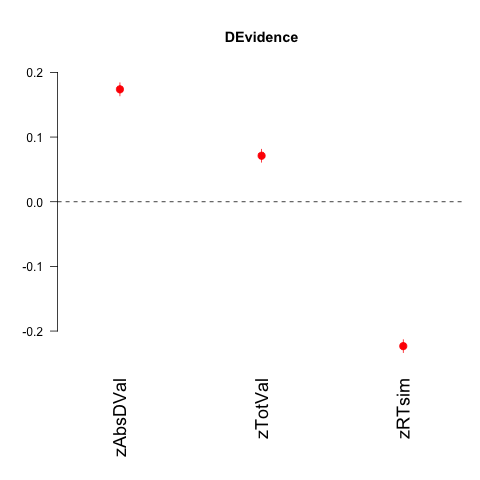

In [68]:
%%R    
title_plot = "DEvidence"
ModelChoice_1 <- glm(zAbsDEv ~ zAbsDVal + zTotVal + zRTsim  , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

# We calculate the original regression with human data

In [69]:
%%R -i data_all
d <- data_all

BIC: 9752.417
Call:  glm(formula = zConf ~ zAbsDVal + zTotVal + zRT, data = d)

Coefficients:
(Intercept)     zAbsDVal      zTotVal          zRT  
    0.07449      0.14002      0.08652     -0.26744  

Degrees of Freedom: 3719 Total (i.e. Null);  3716 Residual
Null Deviance:	    3353 
Residual Deviance: 2964 	AIC: 9721


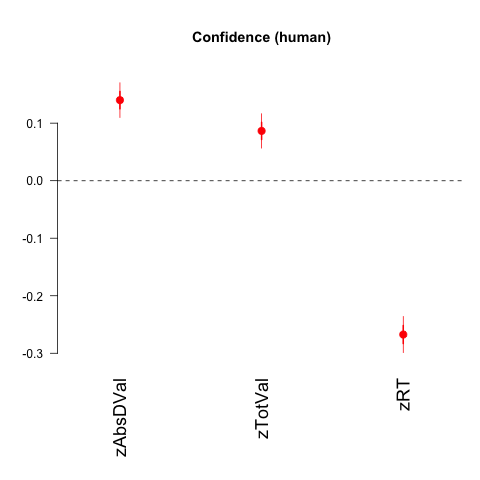

In [70]:
%%R    
title_plot = "Confidence (human)"
ModelChoice_1 <- glm(zConf ~ zAbsDVal + zTotVal + zRT  , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

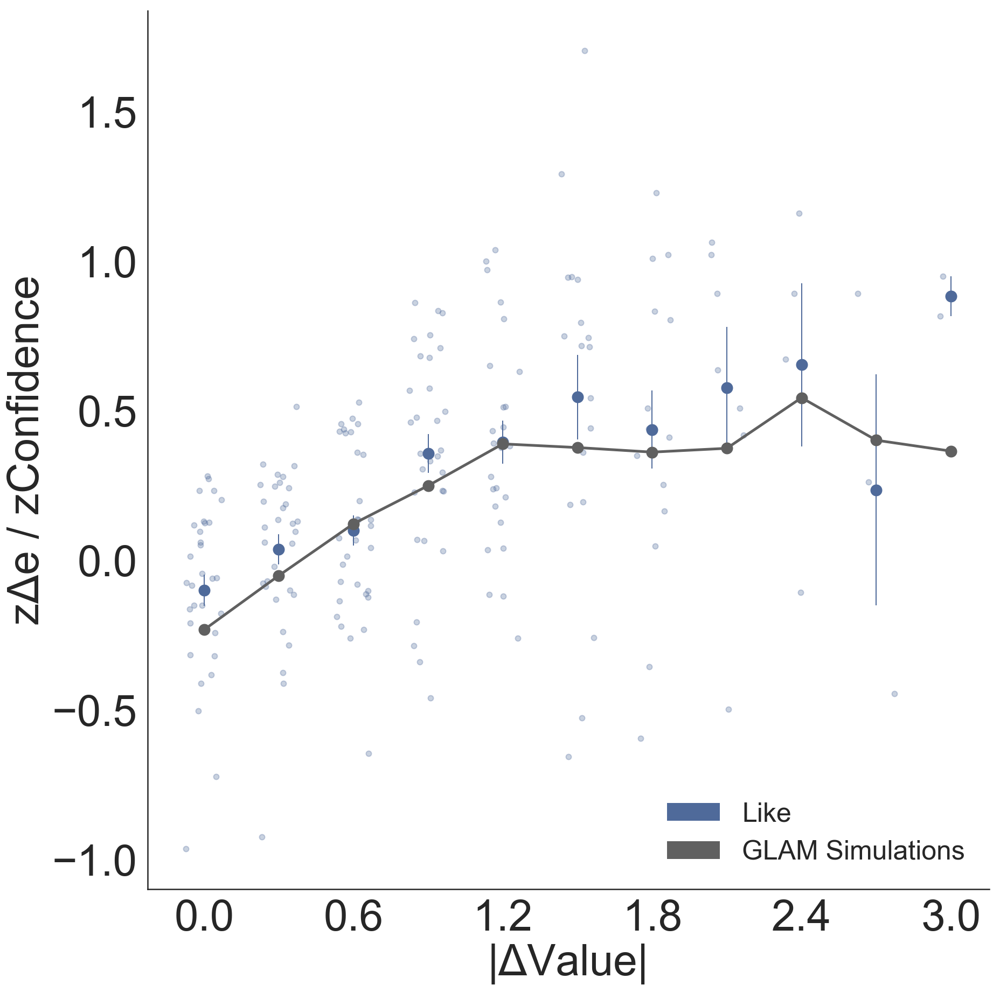

In [71]:
plot_DEv_Conf(data_simulation, xlabel_skip=2,color1 = '#4F6A9A')

Done with TotVal


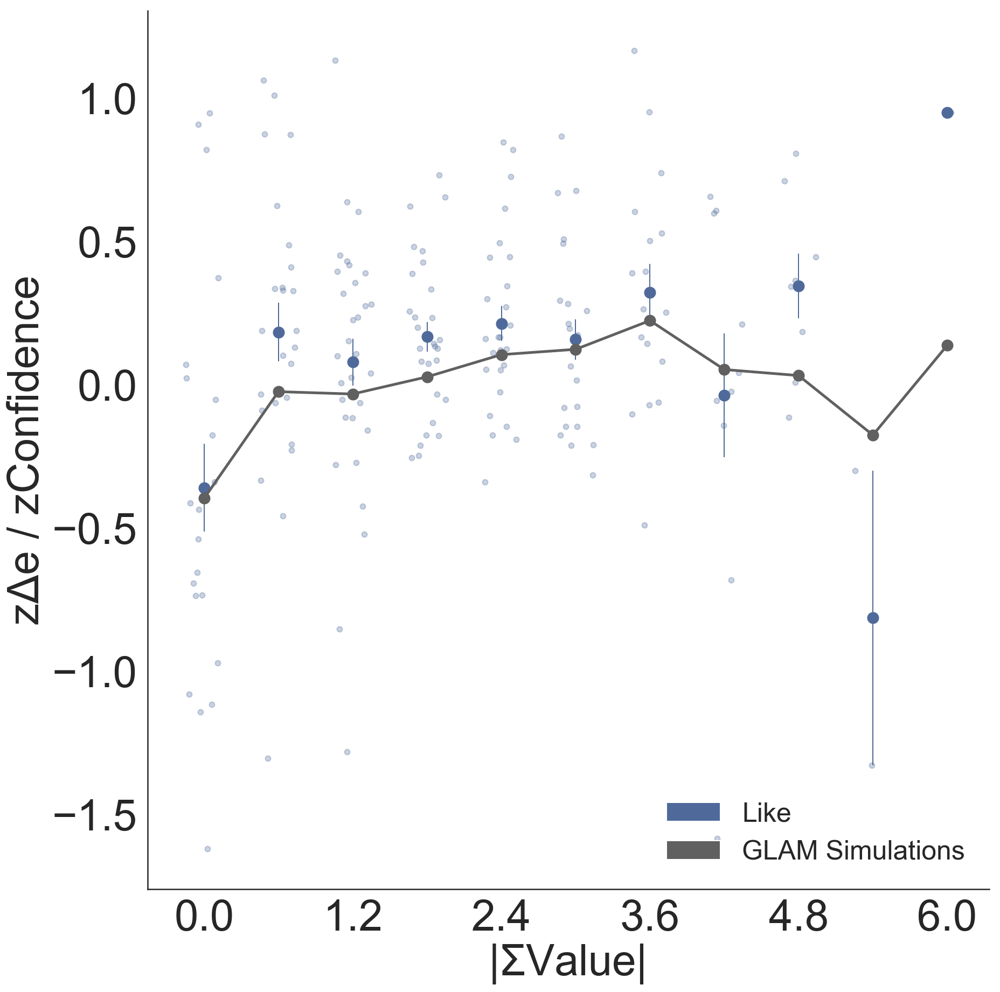

In [72]:
plot_DEv_Conf_TotVal(data_simulation,'TotVal', xlabel_skip=2,color1 = '#4F6A9A')

#  2. Excluding gaze information in the simulation 

In [73]:
if os.path.exists(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv')):  
        data_simulation2 = pd.read_csv(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv'))

In [74]:
# repeats only once so we obtain one accumulator race for each difference in value given by participants DV used.
n_repeats = 1 # Repeats within the accumulator function
repeat_extra = 10 # Repeat outside the accumulator function
gaze_out = 1 # We DON'T want to use the gaze from the particpants

In [75]:
if not os.path.exists(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv')):  
    Part_number = []
    LVal = []
    RVal = []
    LGaze = []
    RGaze = []
    absDVal = []
    TotVal = []
    AbsDEvid = []
    RT_sim = []
    Correct_sim = []
    Choice_sim = []
    Conf_human = []
    zConf_human = []
    
    part_id = data_all['Part'].unique()
    
    for i in (data['subject'].unique()):    
        for k in range(0,repeat_extra) :
            PartData = data.loc[data['subject'] == i] # dataframe including participant GLAM data
            PartDataAll = data_all.loc[data_all['Part'] == part_id[i]] # dataframe including participant all data

            value_tests =np.column_stack((PartData['item_value_0'].values,PartData['item_value_1'].values))
            
            # get confidence from participants and add to the simulations datasets
            conf_tests =PartDataAll['Conf'].values
            zconf_tests =PartDataAll['zConf'].values
            
            if gaze_out == 1:
                gaze_tests = np.matlib.repmat([0.5, 0.5], len(value_tests),1)
            else:
                gaze_tests =np.column_stack((PartData['gaze_0'].values,PartData['gaze_1'].values))

            # We keep the same parameters for this case. 
            gamma = params_part['gamma'] [i]
            tau = params_part['tau'][i]
            v = params_part['v'][i]
            s = params_part['s'][i]
            t0 = 0
            
            parameters = [v , gamma, s, tau, t0]
            ## error_range given by the reaction time values for an individual participant
            rt_min = glam_full.data['rt'].values.min()
            rt_max = glam_full.data['rt'].values.max()
            error_range = (rt_min, rt_max)
        
            Dev_a, rts,evi_seq_0,evi_seq_1,choices = balance_evidence(value_tests, gaze_tests, parameters,boundary, error_weight, error_range,n_repeats)

            LVal_tmp = [item[0] for item in value_tests]
            RVal_tmp = [item[1] for item in value_tests]
            
            LGaze_tmp = [item[0] for item in gaze_tests]
            RGaze_tmp = [item[1] for item in gaze_tests]
            
            for  j in range(len(Dev_a)):
                
                Part_number.append(i)
                Conf_human.append(conf_tests[j])
                zConf_human.append(zconf_tests[j])
                
                LVal.append(LVal_tmp[j])
                RVal.append(RVal_tmp[j])
                
                LGaze.append(LGaze_tmp[j])
                RGaze.append(RGaze_tmp[j])
                
                absDVal.append(abs(RVal_tmp[j] -  LVal_tmp[j]))
                TotVal.append(RVal_tmp[j] +  LVal_tmp[j])
                
                if (choices[j] == 1 and value_tests[j][1]>value_tests[j][0]) or (choices[j] == 0 and value_tests[j][1]<value_tests[j][0]):
                    Correct_sim.append(1)
                else:
                    Correct_sim.append(0)
                    
                AbsDEvid.append(Dev_a[j])
                RT_sim.append(rts[j])
                Choice_sim.append(choices[j])

        print ("subj " + str(i))

    data_simulation2 =  pd.DataFrame()
    
    data_simulation2["Part"] = Part_number
    data_simulation2["LVal"] = LVal
    data_simulation2["RVal"] = RVal
    data_simulation2["LGaze"] = LGaze
    data_simulation2["RGaze"] = RGaze
    data_simulation2["AbsDVal"] = absDVal
    data_simulation2["TotVal"] = TotVal
    data_simulation2["AbsDEv"] = AbsDEvid
    data_simulation2["RTsim"] = RT_sim
    data_simulation2["Correct_sim"] = Correct_sim
    data_simulation2["Choice_sim"] = Choice_sim
    data_simulation2["Conf_human"] = Conf_human
    data_simulation2["zConf_human"] = zConf_human
    
    data_simulation2["zLVal"] = z_score1(data_simulation2,'Part',"LVal")
    data_simulation2["zRVal"] = z_score1(data_simulation2,'Part',"RVal")
    data_simulation2["zAbsDVal"] = z_score1(data_simulation2,'Part',"AbsDVal")
    data_simulation2["zTotVal"] = z_score1(data_simulation2,'Part',"TotVal")
    data_simulation2["zAbsDEv"] = z_score1(data_simulation2,'Part',"AbsDEv")
    data_simulation2["zRTsim"] = z_score1(data_simulation2,'Part',"RTsim")

In [76]:
if not  os.path.exists(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv')):   
        data_simulation2.to_csv(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv'))

In [77]:
data_simulation2

,Unnamed: 0,Part,LVal,RVal,LGaze,RGaze,AbsDVal,TotVal,AbsDEv,RTsim,Correct_sim,Choice_sim,Conf_human,zConf_human,zLVal,zRVal,zAbsDVal,zTotVal,zAbsDEv,zRTsim
0,0,0,1.10,0.95,0.5,0.5,0.15,2.05,1.519714,3826.0,0,1.0,80,0.582155,-0.898735,-1.237881,-0.988498,-1.497033,2.134170,0.787661
1,1,0,2.00,1.70,0.5,0.5,0.30,3.70,0.621927,3727.0,1,0.0,78,0.432565,1.136137,0.457846,-0.570823,1.116834,-0.284400,0.703666
2,2,0,1.10,2.30,0.5,0.5,1.20,3.40,1.343064,2923.0,1,1.0,82,0.731746,-0.898735,1.814428,1.935228,0.641585,1.658287,0.021524
3,3,0,1.25,1.40,0.5,0.5,0.15,2.65,0.558063,4331.0,0,0.0,42,-2.260059,-0.559590,-0.220445,-0.988498,-0.546536,-0.456444,1.216121
4,4,0,2.00,2.30,0.5,0.5,0.30,4.30,0.604166,3243.0,1,1.0,70,-0.165796,1.136137,1.814428,-0.570823,2.067331,-0.332247,0.293023
5,5,0,1.70,1.85,0.5,0.5,0.15,3.55,0.984522,3365.0,1,1.0,74,0.133385,0.457846,0.796992,-0.988498,0.879210,0.692402,0.396532
6,6,0,1.85,0.65,0.5,0.5,1.20,2.50,1.233709,1839.0,1,0.0,70,-0.165796,0.796992,-1.916172,1.935228,-0.784160,1.363692,-0.898179
7,7,0,1.55,0.80,0.5,0.5,0.75,2.35,1.282036,2991.0,1,0.0,76,0.282975,0.118701,-1.577026,0.682203,-1.021784,1.493882,0.079218
8,8,0,1.55,1.10,0.5,0.5,0.45,2.65,0.709792,2349.0,1,0.0,90,1.330107,0.118701,-0.898735,-0.153148,-0.546536,-0.047699,-0.465478
9,9,0,1.10,2.00,0.5,0.5,0.90,3.10,0.838071,3562.0,1,1.0,54,-1.362518,-0.898735,1.136137,1.099878,0.166337,0.297875,0.563674


Pearson's r = 0.063 p =  0.0


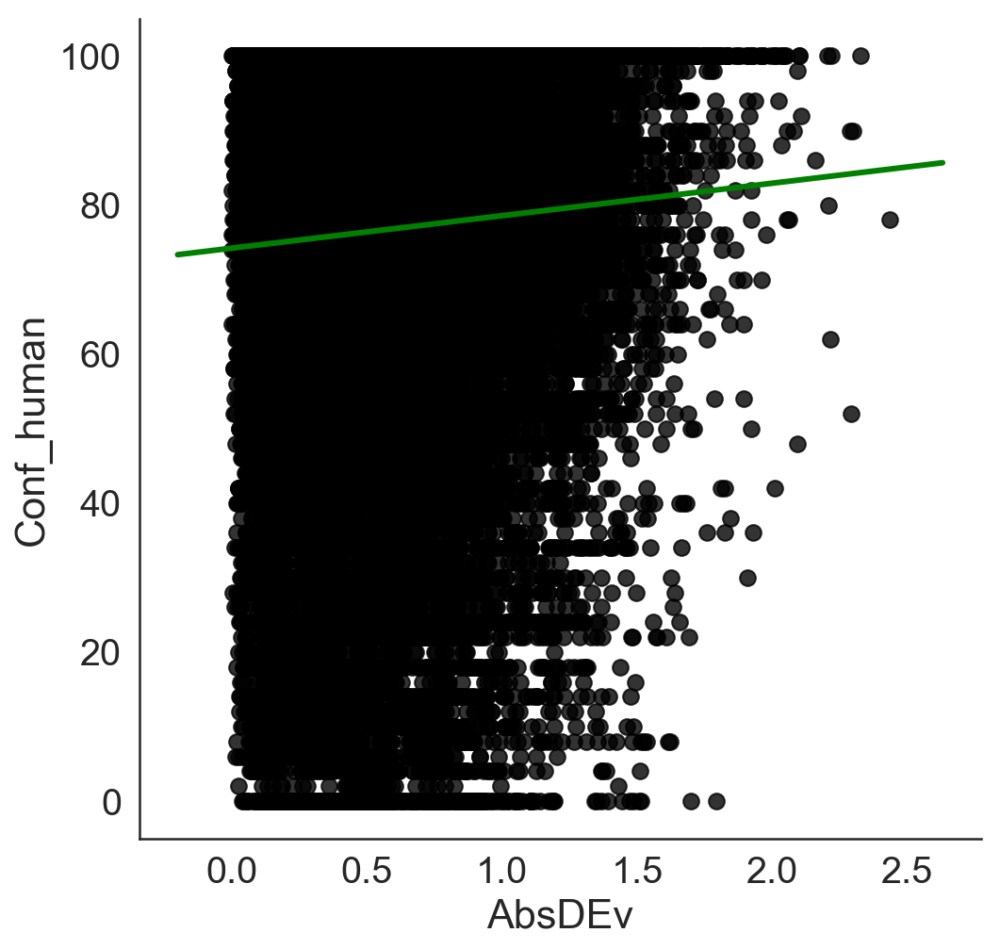

Pearson's r = 0.072 p =  0.0


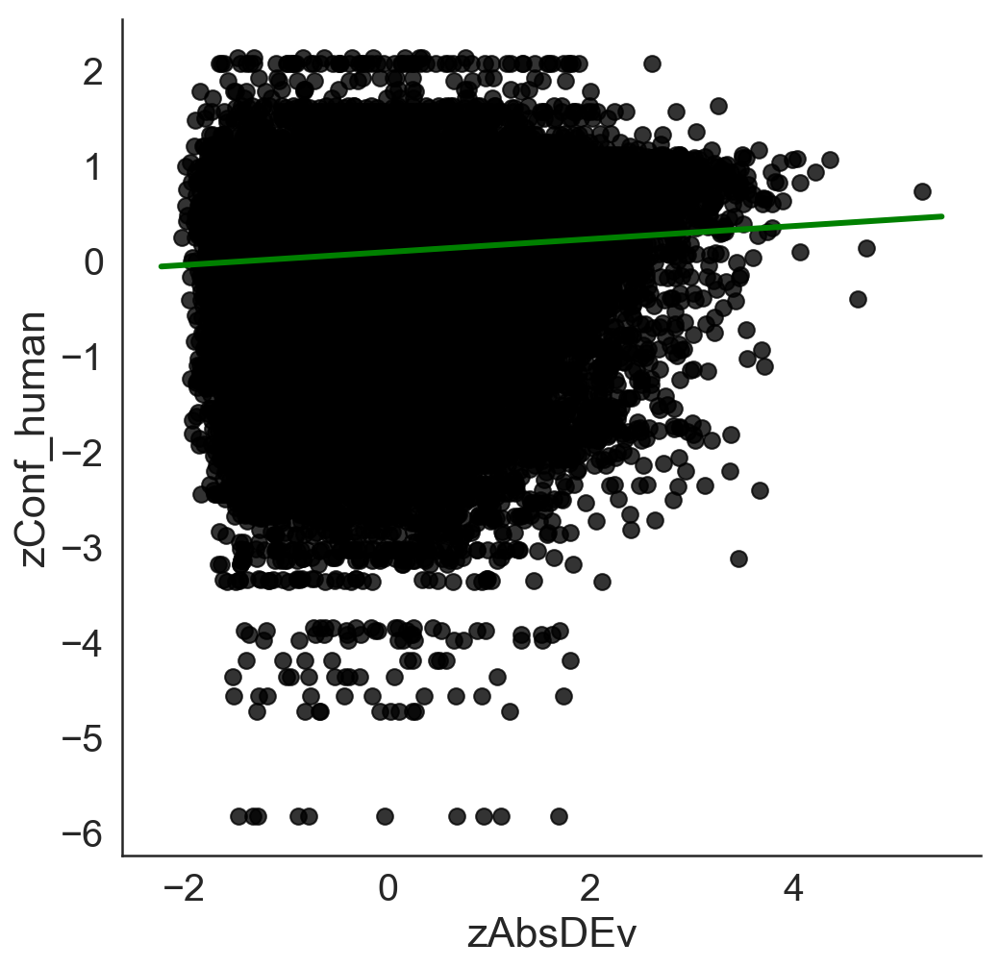

In [78]:
correl_plot(data_simulation2,'AbsDEv', "AbsDEv",'Conf_human','Conf_human')
correl_plot(data_simulation2,'zAbsDEv', "zAbsDEv",'zConf_human','zConf_human')

In [79]:
%%R -i data_simulation2
d <- data_simulation2

BIC: 101554.4
Call:  glm(formula = zAbsDEv ~ zAbsDVal + zTotVal + zRTsim, data = d)

Coefficients:
(Intercept)     zAbsDVal      zTotVal       zRTsim  
 -7.012e-16    2.138e-01   -7.468e-03   -2.102e-01  

Degrees of Freedom: 37199 Total (i.e. Null);  37196 Residual
Null Deviance:	    37200 
Residual Deviance: 33350 	AIC: 101500


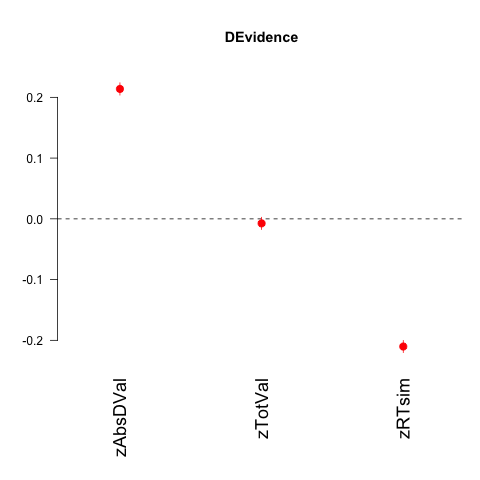

In [80]:
%%R    
title_plot = "DEvidence"
ModelChoice_1 <- glm(zAbsDEv ~ zAbsDVal + zTotVal + zRTsim  , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

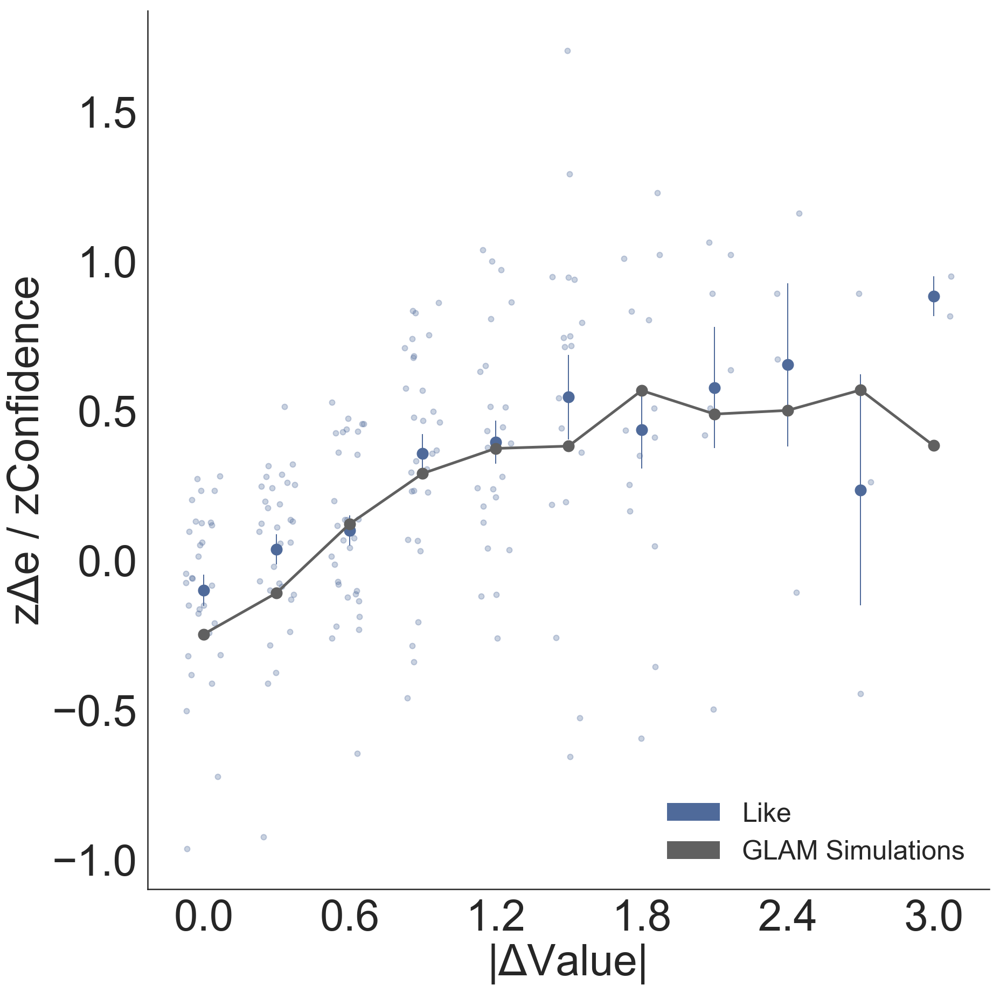

In [81]:
plot_DEv_Conf(data_simulation2, xlabel_skip=2,color1 = '#4F6A9A')

Done with TotVal


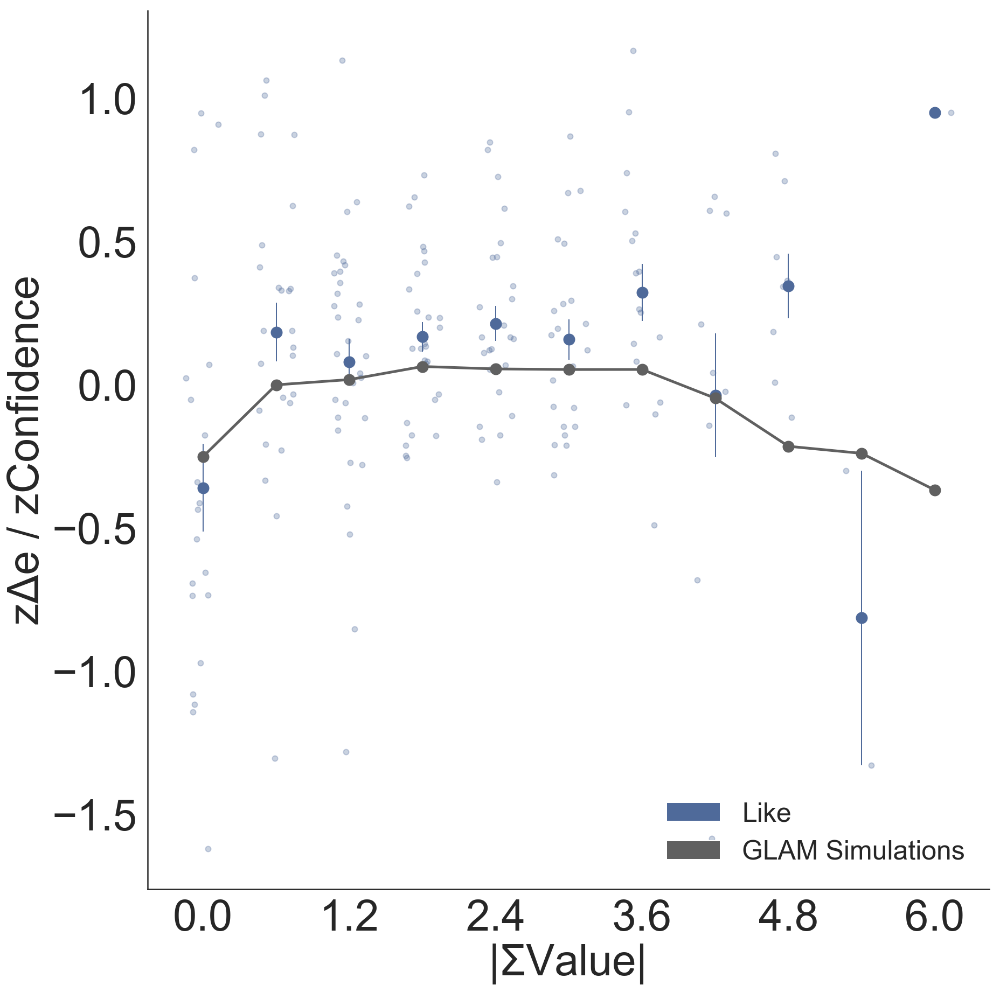

In [82]:
plot_DEv_Conf_TotVal(data_simulation2,'TotVal', xlabel_skip=2,color1 = '#4F6A9A')

- ---- -----------------------------------------------------------------------------------

# Dislike condition


## Load parameter estimates for participants


Use the parameter estimates from GLAM fit for Like, Binned data

In [83]:
sufix = 'individual_Dislike_Inv_NoBin_Gamma-11_NUTS_31'
glam_full = glam.GLAM(data)
glam_full.estimates = np.load(str('results/estimates/glam_FF2019_full_'+sufix+'.npy'))

# generate dataframe with new params
params_part_l = pd.DataFrame()
for i in range(len(glam_full.estimates)):    
    params_part_l1 = pd.DataFrame.from_dict(glam_full.estimates.item(i))
    params_part_l = pd.concat([params_part_l ,params_part_l1])
    
params_part_l = params_part_l.reset_index(drop=True)

params_part = params_part_l
params_part



,b,p_error,v,gamma,SNR,s,tau,t0
0,1.0,0.05,0.000037,0.62,180.28,0.006407,3.56,0.0
1,1.0,0.05,0.000049,0.43,37.53,0.004241,0.45,0.0
2,1.0,0.05,0.000044,0.99,146.71,0.007717,0.80,0.0
3,1.0,0.05,0.000036,0.16,183.63,0.007155,3.00,0.0
4,1.0,0.05,0.000048,0.36,214.51,0.009292,4.92,0.0
5,1.0,0.05,0.000045,0.29,210.12,0.008504,4.76,0.0
6,1.0,0.05,0.000063,0.27,132.99,0.008919,1.27,0.0
7,1.0,0.05,0.000042,-0.06,139.13,0.006858,4.19,0.0
8,1.0,0.05,0.000047,-0.98,167.29,0.008069,2.58,0.0
9,1.0,0.05,0.000052,-0.69,122.06,0.006391,4.85,0.0


# Run drift simulations for selected values and parameters

#  1. Including gaze information in the simulation 

In [84]:
if os.path.exists(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv')):  
        data_simulation = pd.read_csv(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv'))

In [85]:
# repeats only once so we obtain one accumulator race for each difference in value given by participants DV used.
n_repeats = 1 # Repeats within the accumulator function
repeat_extra = 10 # Repeat outside the accumulator function
gaze_out = 0 # We DO want to use the gaze from the particpants

In [86]:
if not os.path.exists(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv')):  
    Part_number = []
    LVal = []
    RVal = []
    LGaze = []
    RGaze = []
    absDVal = []
    TotVal = []
    AbsDEvid = []
    RT_sim = []
    Correct_sim = []
    Choice_sim = []
    Conf_human = []
    zConf_human = []
    
    part_id = data_all2['Part'].unique()
    
    for i in (data2['subject'].unique()):    
        for k in range(0,repeat_extra) :
            PartData = data2.loc[data2['subject'] == i] # dataframe including participant GLAM data
            PartDataAll = data_all2.loc[data_all2['Part'] == part_id[i]] # dataframe including participant all data

            value_tests =np.column_stack((PartData['item_value_0'].values,PartData['item_value_1'].values))
            
            # get confidence from participants and add to the simulations datasets
            conf_tests =PartDataAll['Conf'].values
            zconf_tests =PartDataAll['zConf'].values
            
            if gaze_out == 1:
                gaze_tests = np.matlib.repmat([0.5, 0.5], len(value_tests),1)
            else:
                gaze_tests =np.column_stack((PartData['gaze_0'].values,PartData['gaze_1'].values))

            # We keep the same parameters for this case. 
            gamma = params_part['gamma'] [i]
            tau = params_part['tau'][i]
            v = params_part['v'][i]
            s = params_part['s'][i]
            t0 = 0
            
            parameters = [v , gamma, s, tau, t0]
            ## error_range given by the reaction time values for an individual participant
            rt_min = glam_full.data['rt'].values.min()
            rt_max = glam_full.data['rt'].values.max()
            error_range = (rt_min, rt_max)
        
            Dev_a, rts,evi_seq_0,evi_seq_1,choices = balance_evidence(value_tests, gaze_tests, parameters,boundary, error_weight, error_range,n_repeats)

            LVal_tmp = [item[0] for item in value_tests]
            RVal_tmp = [item[1] for item in value_tests]
            
            LGaze_tmp = [item[0] for item in gaze_tests]
            RGaze_tmp = [item[1] for item in gaze_tests]
                
            for  j in range(len(Dev_a)):
                
                Part_number.append(i)
                Conf_human.append(conf_tests[j])
                zConf_human.append(zconf_tests[j])
                
                LVal.append(LVal_tmp[j])
                RVal.append(RVal_tmp[j])
                
                LGaze.append(LGaze_tmp[j])
                RGaze.append(RGaze_tmp[j])
            
                absDVal.append(abs(RVal_tmp[j] -  LVal_tmp[j]))
                TotVal.append(RVal_tmp[j] +  LVal_tmp[j])
                
                if (choices[j] == 1 and value_tests[j][1]>value_tests[j][0]) or (choices[j] == 0 and value_tests[j][1]<value_tests[j][0]):
                    Correct_sim.append(1)
                else:
                    Correct_sim.append(0)
                    
                AbsDEvid.append(Dev_a[j])
                RT_sim.append(rts[j])
                Choice_sim.append(choices[j])

        print ("subj " + str(i))
        
    data_simulation =  pd.DataFrame()
    data_simulation["Part"] = Part_number
    data_simulation["LVal"] = LVal
    data_simulation["RVal"] = RVal
    data_simulation["LGaze"] = LGaze
    data_simulation["RGaze"] = RGaze
    data_simulation["AbsDVal"] = absDVal
    data_simulation["TotVal"] = TotVal
    data_simulation["AbsDEv"] = AbsDEvid
    data_simulation["RTsim"] = RT_sim
    data_simulation["Correct_sim"] = Correct_sim
    data_simulation["Choice_sim"] = Choice_sim
    data_simulation["Conf_human"] = Conf_human
    data_simulation["zConf_human"] = zConf_human
    
    data_simulation["zLVal"] = z_score1(data_simulation,'Part',"LVal")
    data_simulation["zRVal"] = z_score1(data_simulation,'Part',"RVal")
    data_simulation["zAbsDVal"] = z_score1(data_simulation,'Part',"AbsDVal")
    data_simulation["zTotVal"] = z_score1(data_simulation,'Part',"TotVal")
    data_simulation["zAbsDEv"] = z_score1(data_simulation,'Part',"AbsDEv")
    data_simulation["zRTsim"] = z_score1(data_simulation,'Part',"RTsim")

In [87]:
if not  os.path.exists(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv')):   
        data_simulation.to_csv(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv'))

In [88]:
data_simulation

,Unnamed: 0,Part,LVal,RVal,LGaze,RGaze,AbsDVal,TotVal,AbsDEv,RTsim,Correct_sim,Choice_sim,Conf_human,zConf_human,zLVal,zRVal,zAbsDVal,zTotVal,zAbsDEv,zRTsim
0,0,0,2.05,1.00,0.745415,0.254585,1.05,3.05,0.882675,5775.0,1,0.0,72,-0.016206,1.237881,-1.136137,1.517553,0.071287,0.323846,1.962973
1,1,0,0.70,1.30,0.410720,0.589280,0.60,2.00,1.116604,3469.0,1,1.0,68,-0.315386,-1.814428,-0.457846,0.264528,-1.592082,0.966795,0.109490
2,2,0,1.30,1.75,0.330549,0.669451,0.45,3.05,0.932064,3864.0,1,1.0,68,-0.315386,-0.457846,0.559590,-0.153148,0.071287,0.459590,0.426977
3,3,0,1.45,0.70,0.592345,0.407655,0.75,2.15,1.306198,1891.0,1,0.0,68,-0.315386,-0.118701,-1.814428,0.682203,-1.354458,1.487889,-1.158853
4,4,0,1.00,1.00,0.641717,0.358283,0.00,2.00,0.568219,5356.0,0,1.0,88,1.180516,-1.136137,-1.136137,-1.406173,-1.592082,-0.540429,1.626196
5,5,0,2.35,1.75,0.744016,0.255984,0.60,4.10,1.111494,2301.0,1,0.0,86,1.030926,1.916172,0.559590,0.264528,1.734657,0.952751,-0.829309
6,6,0,1.45,1.90,0.329730,0.670270,0.45,3.35,0.841895,4794.0,1,1.0,78,0.432565,-0.118701,0.898735,-0.153148,0.546536,0.211762,1.174479
7,7,0,2.05,2.35,0.363897,0.636103,0.30,4.40,0.712930,3812.0,1,1.0,72,-0.016206,1.237881,1.916172,-0.570823,2.209905,-0.142695,0.385181
8,8,0,1.45,1.30,0.419431,0.580569,0.15,2.75,0.156379,5324.0,1,0.0,68,-0.315386,-0.118701,-0.457846,-0.988498,-0.403961,-1.672362,1.600475
9,9,0,1.00,1.90,0.169957,0.830043,0.90,2.90,1.303793,2792.0,1,1.0,66,-0.464976,-1.136137,0.898735,1.099878,-0.166337,1.481278,-0.434660


## Since for dislike we have that TotVal represents the inverted value we take it back to the original denomination

In [89]:
data_simulation['TotVal_orig'] = 6 - data_simulation['TotVal']
data_simulation["zTotVal_orig"] = z_score1(data_simulation,'Part',"TotVal_orig")


Pearson's r = 0.057 p =  0.0


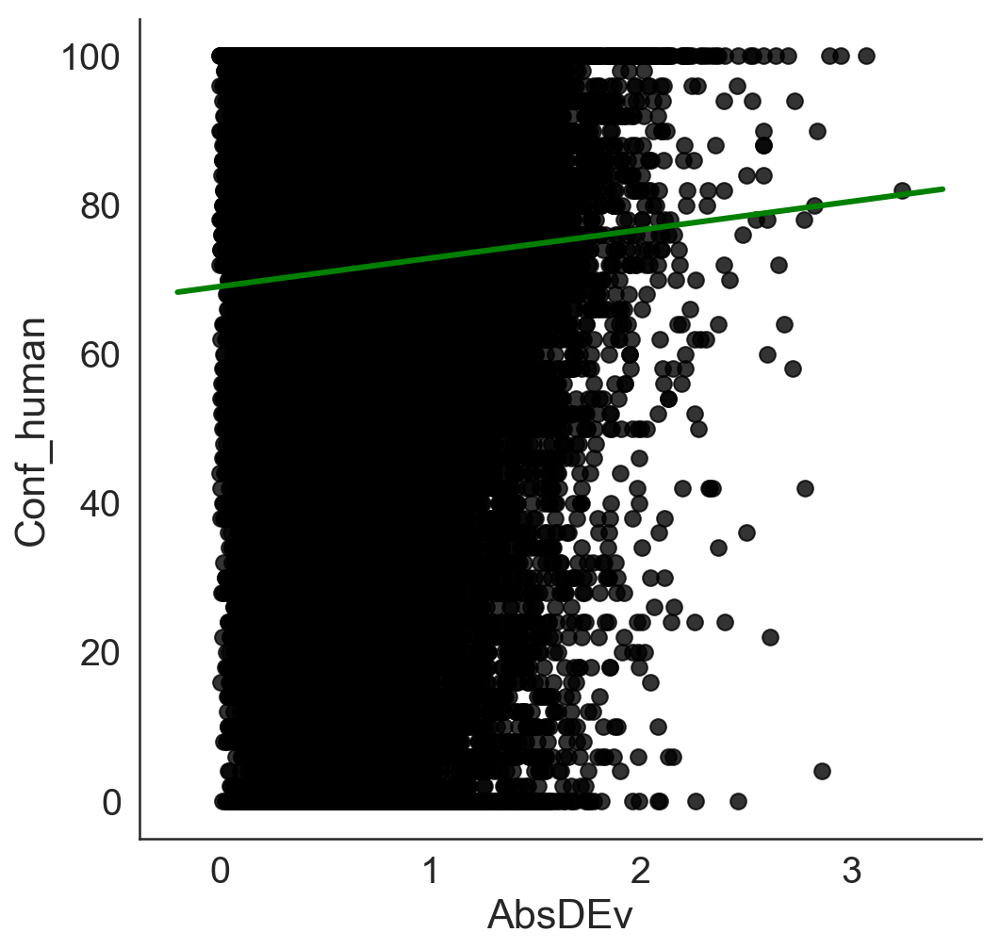

Pearson's r = 0.063 p =  0.0


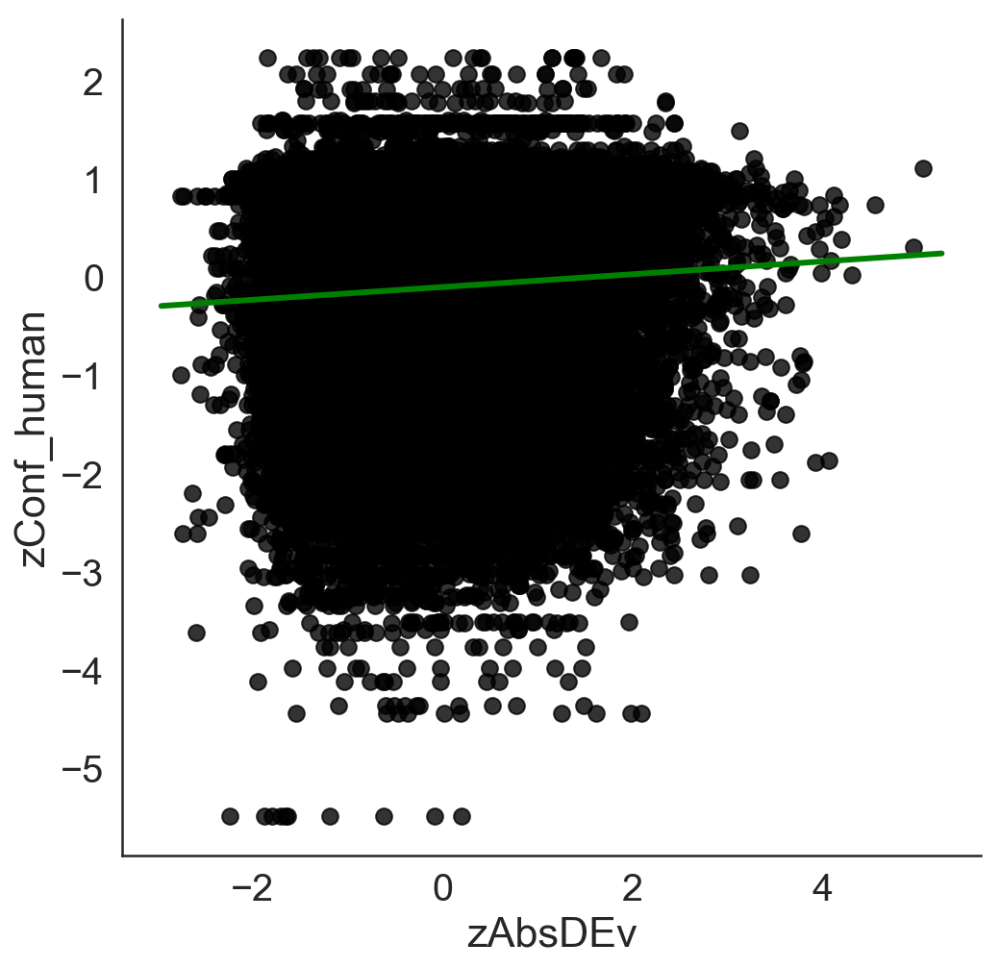

In [90]:
correl_plot(data_simulation,'AbsDEv', "AbsDEv",'Conf_human','Conf_human')
correl_plot(data_simulation,'zAbsDEv', "zAbsDEv",'zConf_human','zConf_human')

In [91]:
%%R -i data_simulation
d <- data_simulation

BIC: 103605.9
Call:  glm(formula = zAbsDEv ~ zAbsDVal + zTotVal_orig + zRTsim, data = d)

Coefficients:
 (Intercept)      zAbsDVal  zTotVal_orig        zRTsim  
   6.571e-17     1.263e-01    -5.201e-02    -1.775e-01  

Degrees of Freedom: 37199 Total (i.e. Null);  37196 Residual
Null Deviance:	    37200 
Residual Deviance: 35240 	AIC: 103600


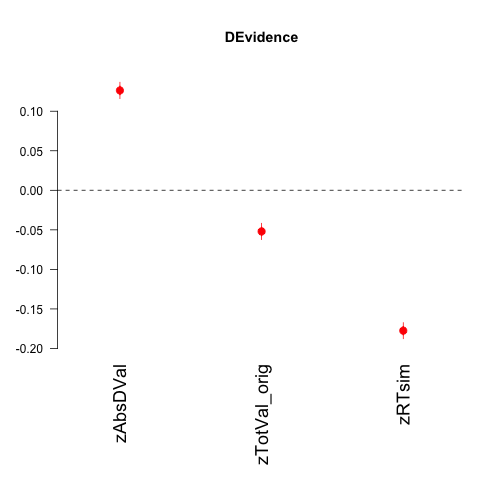

In [92]:
%%R    
title_plot = "DEvidence"
ModelChoice_1 <- glm(zAbsDEv ~ zAbsDVal + zTotVal_orig + zRTsim  , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

# We calculate the original regression with human data

In [93]:
%%R -i data_all2
d <- data_all2

BIC: 10216.38
Call:  glm(formula = zConf ~ zAbsDVal + zTotVal + zRT, data = d)

Coefficients:
(Intercept)     zAbsDVal      zTotVal          zRT  
   -0.07089      0.18816     -0.15851     -0.30716  

Degrees of Freedom: 3719 Total (i.e. Null);  3716 Residual
Null Deviance:	    4019 
Residual Deviance: 3357 	AIC: 10190


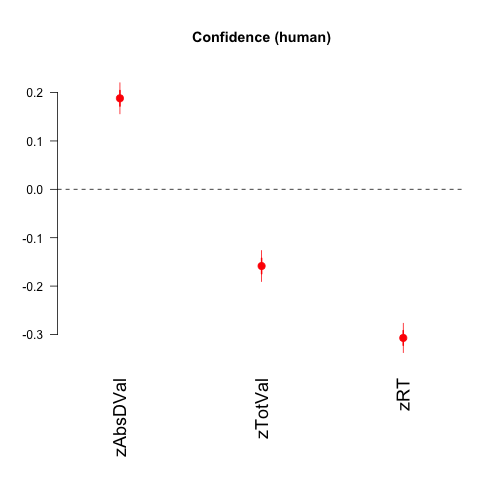

In [94]:
%%R    
title_plot = "Confidence (human)"
ModelChoice_1 <- glm(zConf ~ zAbsDVal + zTotVal + zRT  , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

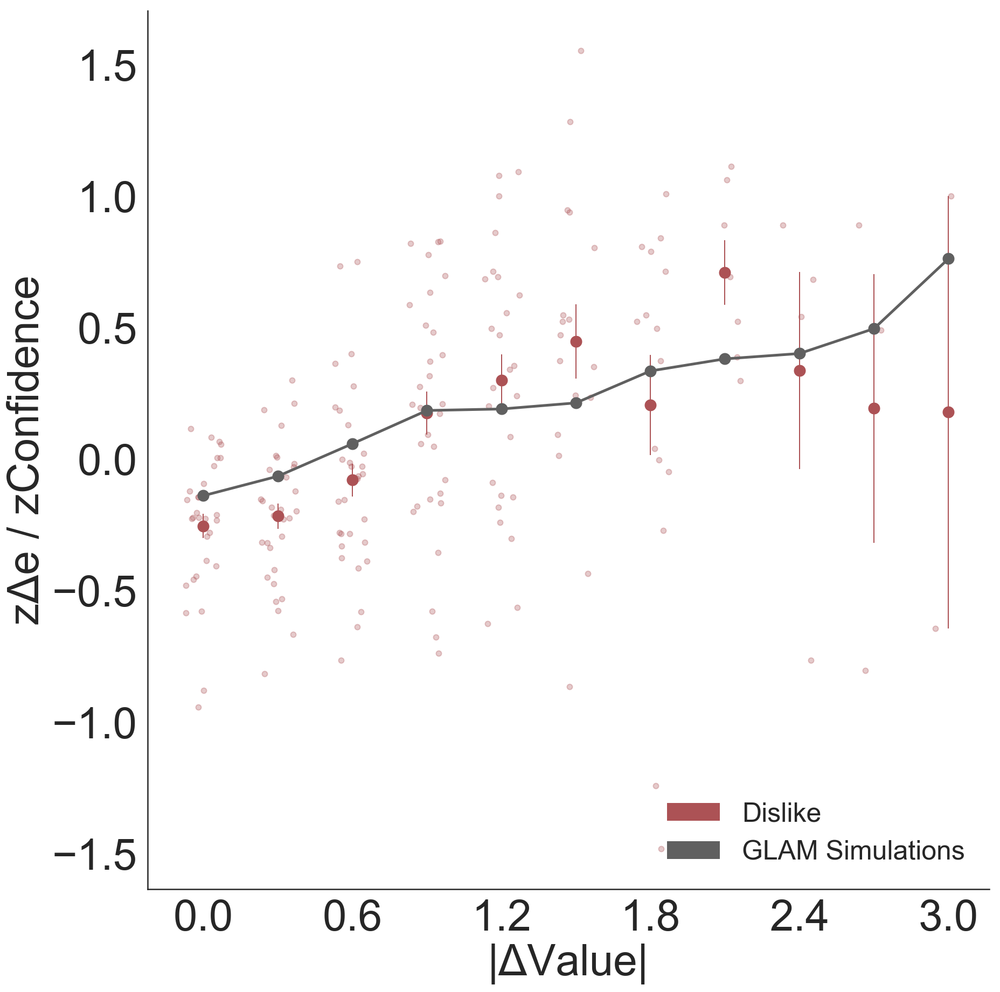

In [95]:
plot_DEv_Conf(data_simulation, xlabel_skip=2,color1 = '#AC5255',label1 = 'Dislike')

In [96]:
data_simulation

,Unnamed: 0,Part,LVal,RVal,LGaze,RGaze,AbsDVal,TotVal,AbsDEv,RTsim,...,Conf_human,zConf_human,zLVal,zRVal,zAbsDVal,zTotVal,zAbsDEv,zRTsim,TotVal_orig,zTotVal_orig
0,0,0,2.05,1.00,0.745415,0.254585,1.05,3.05,0.882675,5775.0,...,72,-0.016206,1.237881,-1.136137,1.517553,0.071287,0.323846,1.962973,2.95,-0.071287
1,1,0,0.70,1.30,0.410720,0.589280,0.60,2.00,1.116604,3469.0,...,68,-0.315386,-1.814428,-0.457846,0.264528,-1.592082,0.966795,0.109490,4.00,1.592082
2,2,0,1.30,1.75,0.330549,0.669451,0.45,3.05,0.932064,3864.0,...,68,-0.315386,-0.457846,0.559590,-0.153148,0.071287,0.459590,0.426977,2.95,-0.071287
3,3,0,1.45,0.70,0.592345,0.407655,0.75,2.15,1.306198,1891.0,...,68,-0.315386,-0.118701,-1.814428,0.682203,-1.354458,1.487889,-1.158853,3.85,1.354458
4,4,0,1.00,1.00,0.641717,0.358283,0.00,2.00,0.568219,5356.0,...,88,1.180516,-1.136137,-1.136137,-1.406173,-1.592082,-0.540429,1.626196,4.00,1.592082
5,5,0,2.35,1.75,0.744016,0.255984,0.60,4.10,1.111494,2301.0,...,86,1.030926,1.916172,0.559590,0.264528,1.734657,0.952751,-0.829309,1.90,-1.734657
6,6,0,1.45,1.90,0.329730,0.670270,0.45,3.35,0.841895,4794.0,...,78,0.432565,-0.118701,0.898735,-0.153148,0.546536,0.211762,1.174479,2.65,-0.546536
7,7,0,2.05,2.35,0.363897,0.636103,0.30,4.40,0.712930,3812.0,...,72,-0.016206,1.237881,1.916172,-0.570823,2.209905,-0.142695,0.385181,1.60,-2.209905
8,8,0,1.45,1.30,0.419431,0.580569,0.15,2.75,0.156379,5324.0,...,68,-0.315386,-0.118701,-0.457846,-0.988498,-0.403961,-1.672362,1.600475,3.25,0.403961
9,9,0,1.00,1.90,0.169957,0.830043,0.90,2.90,1.303793,2792.0,...,66,-0.464976,-1.136137,0.898735,1.099878,-0.166337,1.481278,-0.434660,3.10,0.166337


Done with TotVal


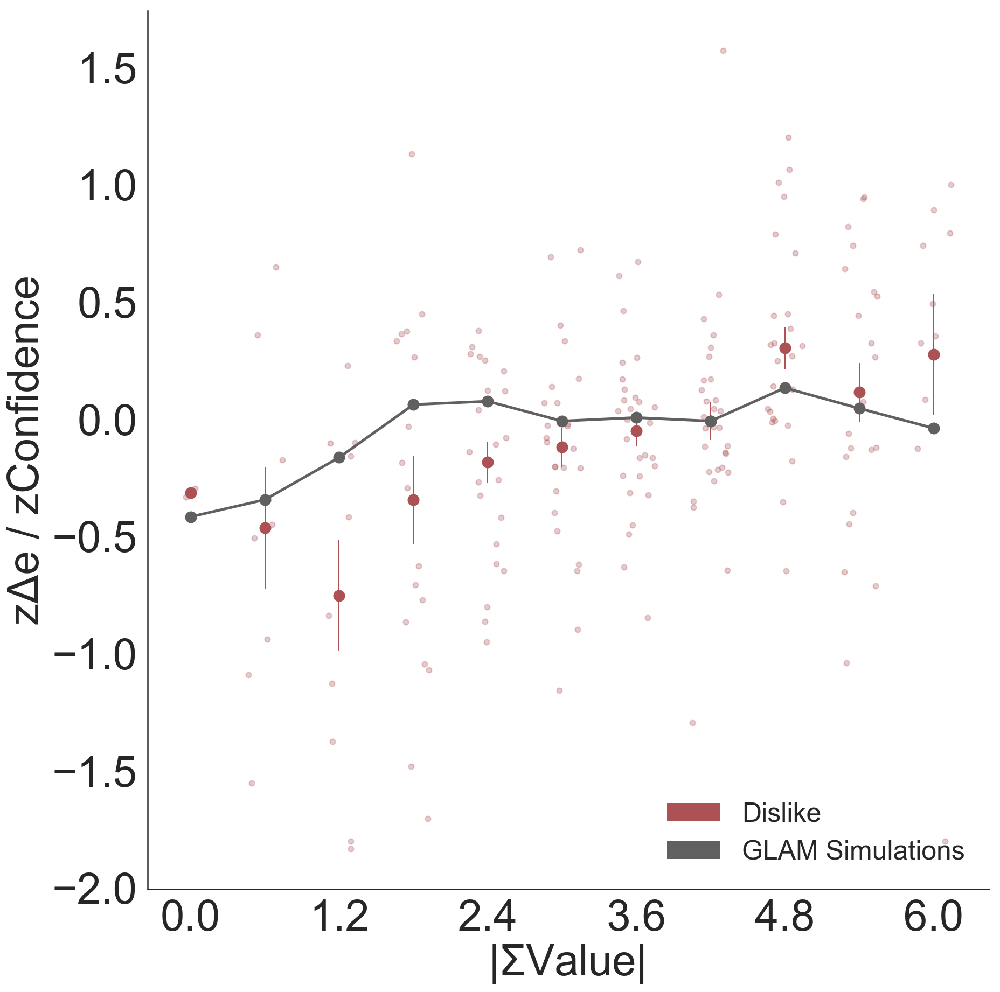

In [97]:
plot_DEv_Conf_TotVal(data_simulation,'TotVal', xlabel_skip=2,color1 = '#AC5255',label1 = 'Dislike')

Done with TotVal


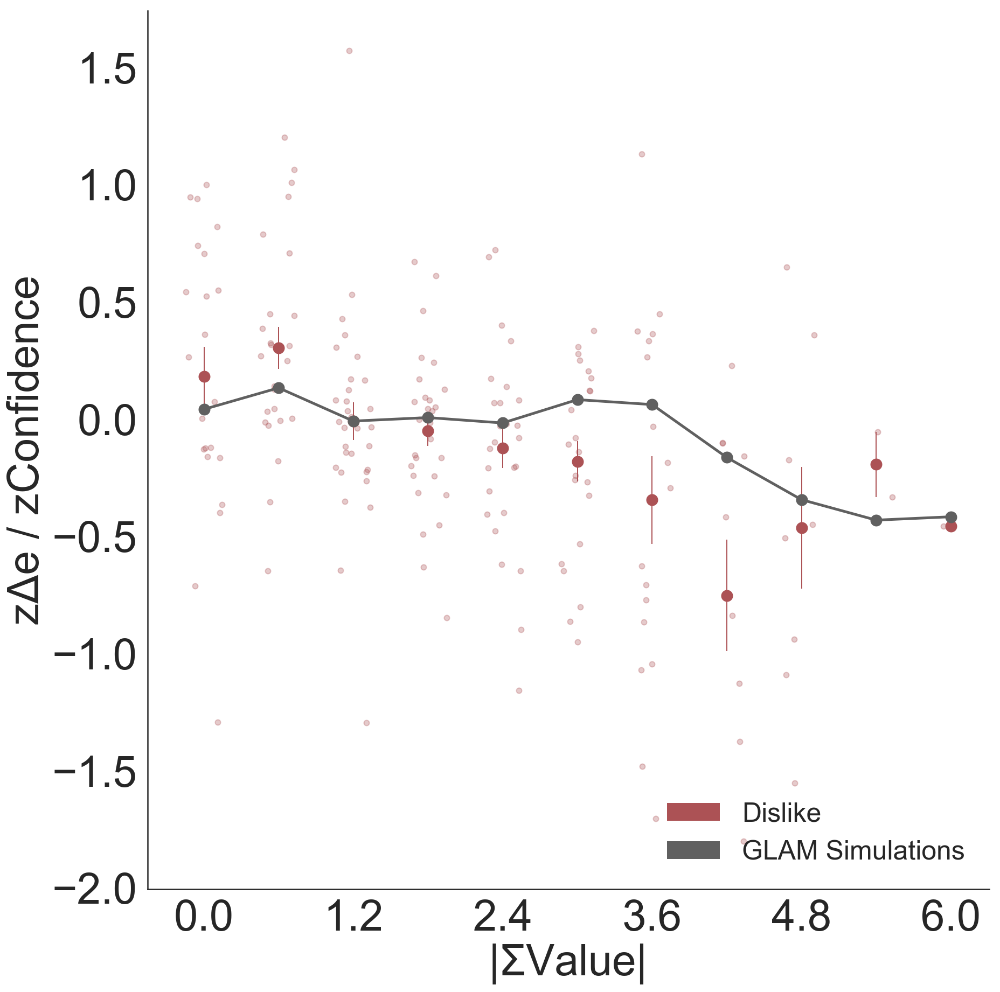

In [98]:
plot_DEv_Conf_TotVal(data_simulation,'TotVal_orig', xlabel_skip=2,color1 = '#AC5255',label1 = 'Dislike')

#  2. Excluding gaze information in the simulation 

In [99]:
if os.path.exists(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv')):  
        data_simulation2 = pd.read_csv(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv'))

In [100]:
# repeats only once so we obtain one accumulator race for each difference in value given by participants DV used.
n_repeats = 1 # Repeats within the accumulator function
repeat_extra = 10 # Repeat outside the accumulator function
gaze_out = 1 # We DON'T want to use the gaze from the particpants

In [101]:
if not os.path.exists(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv')):  
    Part_number = []
    LVal = []
    RVal = []
    LGaze = []
    RGaze = []
    absDVal = []
    TotVal = []
    AbsDEvid = []
    RT_sim = []
    Correct_sim = []
    Choice_sim = []
    Conf_human = []
    zConf_human = []
    
    value_tests = []
    gaze_tests = []
    
    part_id = data_all2['Part'].unique()
    
    for i in (data2['subject'].unique()):    
        for k in range(0,repeat_extra) :
            PartData = data2.loc[data2['subject'] == i] # dataframe including participant GLAM data
            PartDataAll = data_all2.loc[data_all2['Part'] == part_id[i]] # dataframe including participant all data

            value_tests =np.column_stack((PartData['item_value_0'].values,PartData['item_value_1'].values))
            
            # get confidence from participants and add to the simulations datasets
            conf_tests =PartDataAll['Conf'].values
            zconf_tests =PartDataAll['zConf'].values
            
            if gaze_out == 1:
                gaze_tests = np.matlib.repmat([0.5, 0.5], len(value_tests),1)
            else:
              #  gaze_tests =np.column_stack((PartData['gaze_0'].values,PartData['gaze_1'].values))
                gaze_tests = [0, 0] # To test why it's crashing

            # We keep the same parameters for this case. 
            gamma = params_part['gamma'] [i]
            tau = params_part['tau'][i]
            v = params_part['v'][i]
            s = params_part['s'][i]
            t0 = 0
            
            parameters = [v , gamma, s, tau, t0]
            ## error_range given by the reaction time values for an individual participant
            rt_min = glam_full.data['rt'].values.min()
            rt_max = glam_full.data['rt'].values.max()
            error_range = (rt_min, rt_max)
        
            Dev_a, rts,evi_seq_0,evi_seq_1,choices = balance_evidence(value_tests, gaze_tests, parameters,boundary, error_weight, error_range,n_repeats)

            LVal_tmp = [item[0] for item in value_tests]
            RVal_tmp = [item[1] for item in value_tests]
            
            LGaze_tmp = [item[0] for item in gaze_tests]
            RGaze_tmp = [item[1] for item in gaze_tests]
            
            for  j in range(len(Dev_a)):
                
                Part_number.append(i)
                Conf_human.append(conf_tests[j])
                zConf_human.append(zconf_tests[j])
                
                LVal.append(LVal_tmp[j])
                RVal.append(RVal_tmp[j])
                
                LGaze.append(LGaze_tmp[j])
                RGaze.append(RGaze_tmp[j])

                absDVal.append(abs(RVal_tmp[j] -  LVal_tmp[j]))
                TotVal.append(RVal_tmp[j] +  LVal_tmp[j])
                
                if (choices[j] == 1 and value_tests[j][1]>value_tests[j][0]) or (choices[j] == 0 and value_tests[j][1]<value_tests[j][0]):
                    Correct_sim.append(1)
                else:
                    Correct_sim.append(0)
                    
                AbsDEvid.append(Dev_a[j])
                RT_sim.append(rts[j])
                Choice_sim.append(choices[j])

        print ("subj " + str(i))

    data_simulation2 =  pd.DataFrame()
    
    data_simulation2["Part"] = Part_number
    data_simulation2["LVal"] = LVal
    data_simulation2["RVal"] = RVal
    data_simulation2["LGaze"] = LGaze
    data_simulation2["RGaze"] = RGaze
    data_simulation2["AbsDVal"] = absDVal
    data_simulation2["TotVal"] = TotVal
    data_simulation2["AbsDEv"] = AbsDEvid
    data_simulation2["RTsim"] = RT_sim
    data_simulation2["Correct_sim"] = Correct_sim
    data_simulation2["Choice_sim"] = Choice_sim
    data_simulation2["Conf_human"] = Conf_human
    data_simulation2["zConf_human"] = zConf_human
    

In [102]:
data_simulation2["zLVal"] = z_score1(data_simulation2,'Part',"LVal")
data_simulation2["zRVal"] = z_score1(data_simulation2,'Part',"RVal")
data_simulation2["zAbsDVal"] = z_score1(data_simulation2,'Part',"AbsDVal")
data_simulation2["zTotVal"] = z_score1(data_simulation2,'Part',"TotVal")
data_simulation2["zAbsDEv"] = z_score1(data_simulation2,'Part',"AbsDEv")
data_simulation2["zRTsim"] = z_score1(data_simulation2,'Part',"RTsim")

In [103]:
if not  os.path.exists(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv')):   
        data_simulation2.to_csv(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv'))

In [104]:
data_simulation2

,Unnamed: 0,Part,LVal,RVal,LGaze,RGaze,AbsDVal,TotVal,AbsDEv,RTsim,Correct_sim,Choice_sim,Conf_human,zConf_human,zLVal,zRVal,zAbsDVal,zTotVal,zAbsDEv,zRTsim
0,0,0,2.05,1.00,0.5,0.5,1.05,3.05,1.670773,4361.0,1,0.0,72,-0.016206,1.237881,-1.136137,1.517553,0.071287,2.542625,0.668519
1,1,0,0.70,1.30,0.5,0.5,0.60,2.00,0.656735,2938.0,1,1.0,68,-0.315386,-1.814428,-0.457846,0.264528,-1.592082,-0.236878,-0.379041
2,2,0,1.30,1.75,0.5,0.5,0.45,3.05,1.151043,2637.0,1,1.0,68,-0.315386,-0.457846,0.559590,-0.153148,0.071287,1.118032,-0.600626
3,3,0,1.45,0.70,0.5,0.5,0.75,2.15,0.752506,5080.0,1,0.0,68,-0.315386,-0.118701,-1.814428,0.682203,-1.354458,0.025632,1.197821
4,4,0,1.00,1.00,0.5,0.5,0.00,2.00,0.500013,2740.0,0,0.0,88,1.180516,-1.136137,-1.136137,-1.406173,-1.592082,-0.666457,-0.524802
5,5,0,2.35,1.75,0.5,0.5,0.60,4.10,1.076115,3264.0,1,0.0,86,1.030926,1.916172,0.559590,0.264528,1.734657,0.912653,-0.139052
6,6,0,1.45,1.90,0.5,0.5,0.45,3.35,1.466680,3542.0,1,1.0,78,0.432565,-0.118701,0.898735,-0.153148,0.546536,1.983201,0.065601
7,7,0,2.05,2.35,0.5,0.5,0.30,4.40,0.801232,2166.0,1,1.0,72,-0.016206,1.237881,1.916172,-0.570823,2.209905,0.159192,-0.947359
8,8,0,1.45,1.30,0.5,0.5,0.15,2.75,0.397058,4616.0,1,0.0,68,-0.315386,-0.118701,-0.457846,-0.988498,-0.403961,-0.948660,0.856241
9,9,0,1.00,1.90,0.5,0.5,0.90,2.90,0.777831,1917.0,1,1.0,66,-0.464976,-1.136137,0.898735,1.099878,-0.166337,0.095049,-1.130664


## Since for dislike we have that TotVal represents the inverted value we take it back to the original denomination

In [105]:
data_simulation2['TotVal_orig'] = 6 - data_simulation2['TotVal']
data_simulation2["zTotVal_orig"] = z_score1(data_simulation2,'Part',"TotVal_orig")

Pearson's r = 0.027 p =  0.0


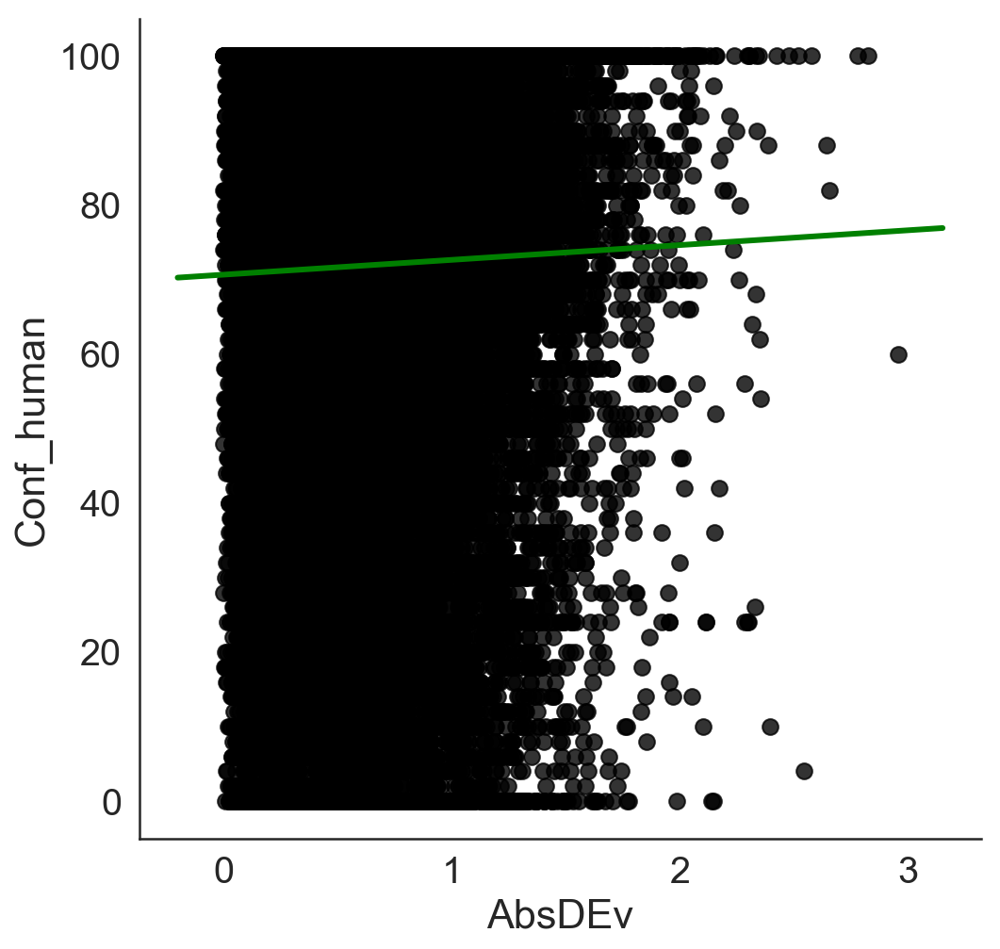

Pearson's r = 0.049 p =  0.0


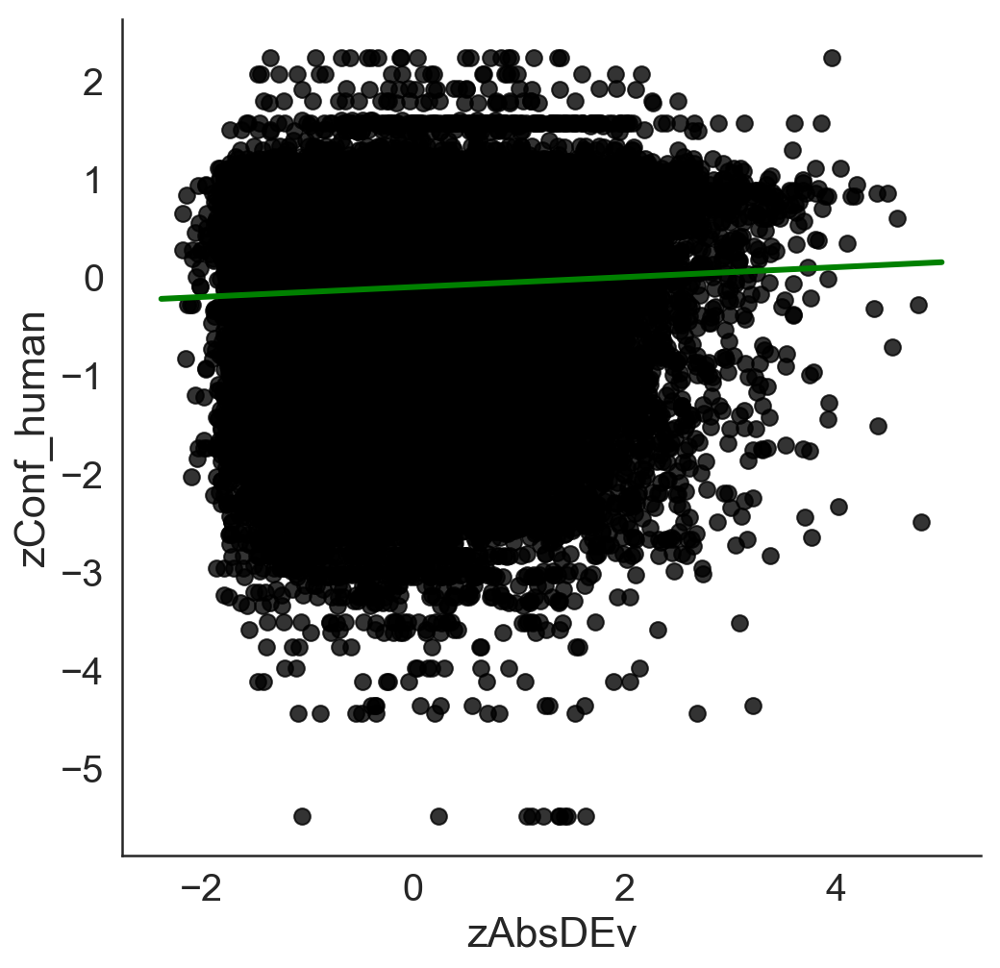

In [106]:
correl_plot(data_simulation2,'AbsDEv', "AbsDEv",'Conf_human','Conf_human')
correl_plot(data_simulation2,'zAbsDEv', "zAbsDEv",'zConf_human','zConf_human')

In [107]:
%%R -i data_simulation2
d <- data_simulation2

BIC: 102320.9
Call:  glm(formula = zAbsDEv ~ zAbsDVal + zTotVal_orig + zRTsim, data = d)

Coefficients:
 (Intercept)      zAbsDVal  zTotVal_orig        zRTsim  
  -2.887e-16     2.021e-01     1.050e-02    -1.777e-01  

Degrees of Freedom: 37199 Total (i.e. Null);  37196 Residual
Null Deviance:	    37200 
Residual Deviance: 34040 	AIC: 102300


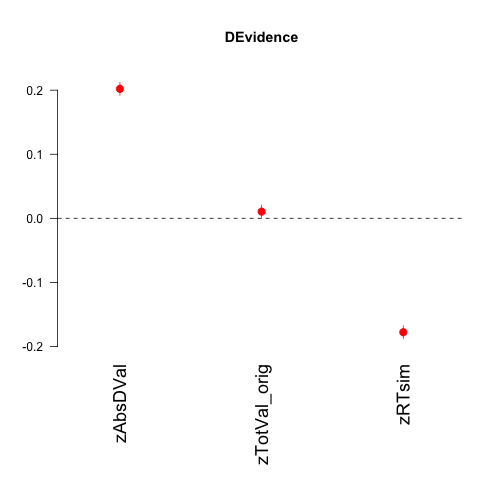

In [108]:
%%R    
title_plot = "DEvidence"
ModelChoice_1 <- glm(zAbsDEv ~ zAbsDVal + zTotVal_orig + zRTsim  , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

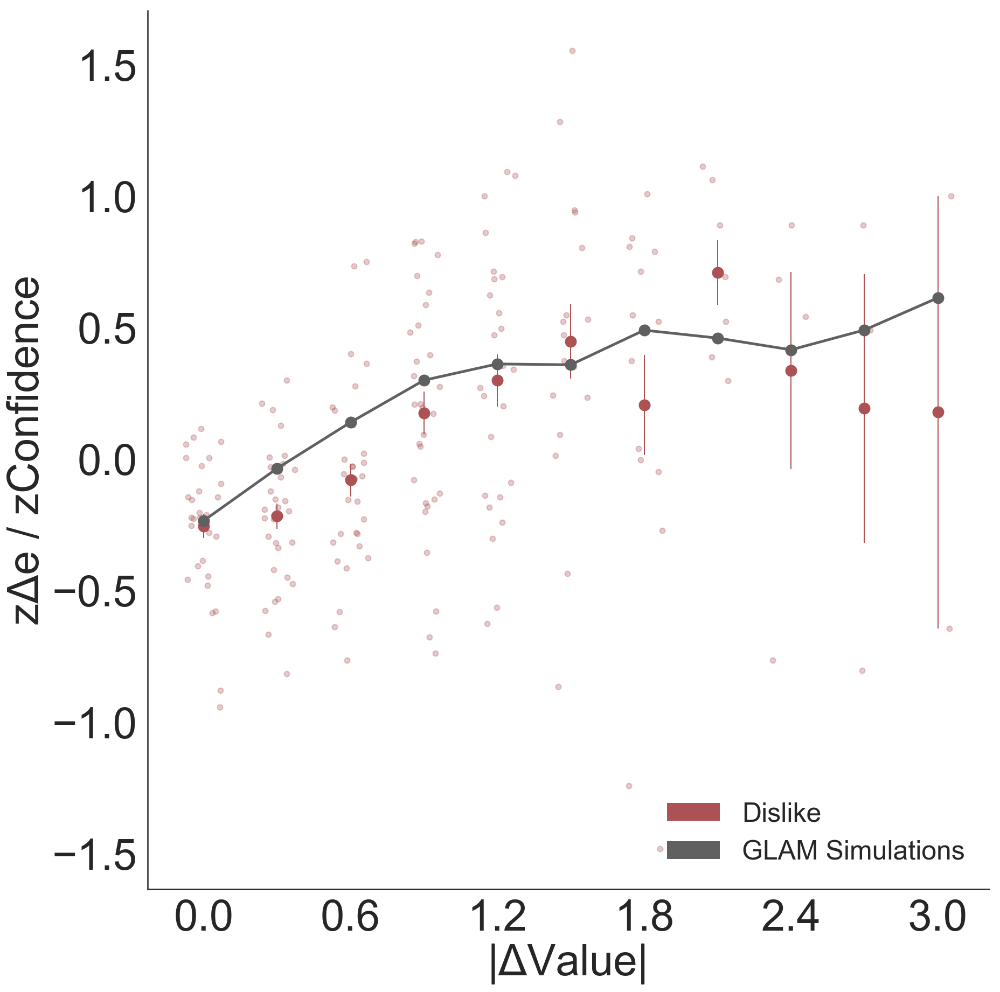

In [109]:
plot_DEv_Conf(data_simulation2, xlabel_skip=2,color1 = '#AC5255',label1 = 'Dislike')

Done with TotVal


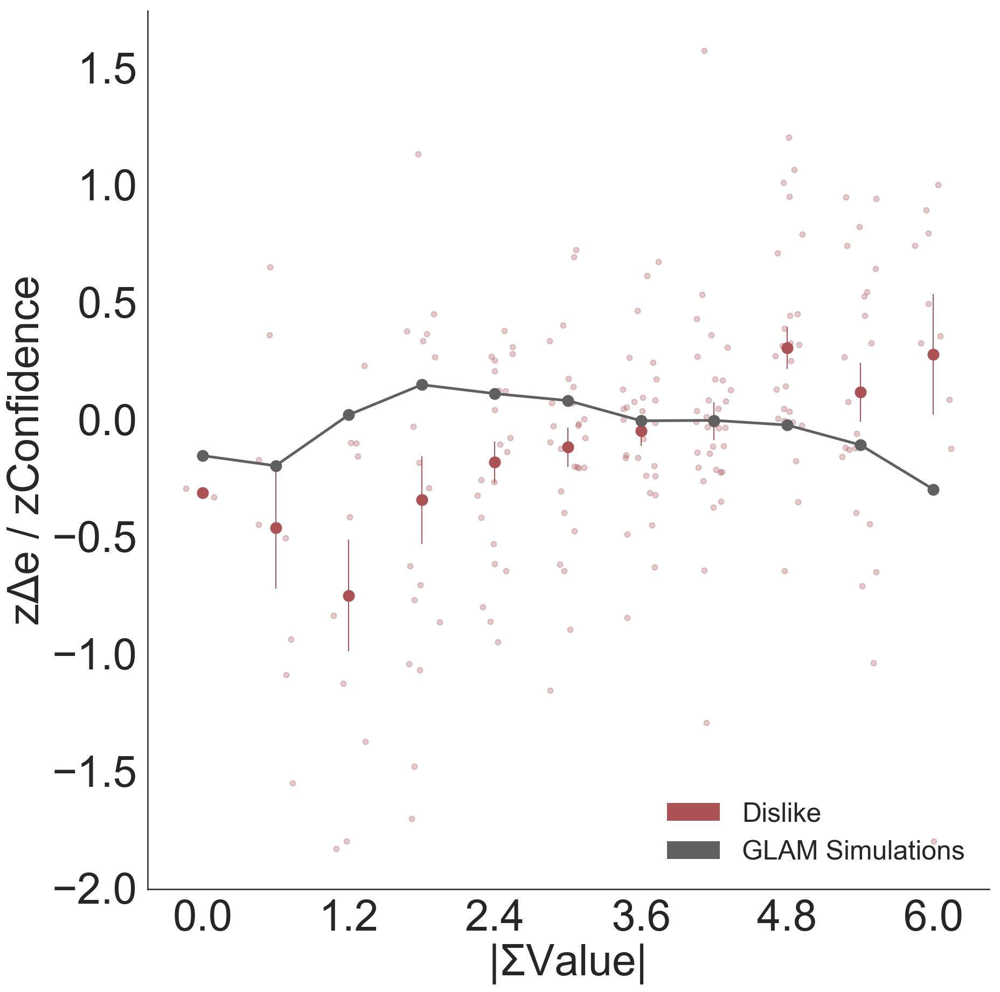

In [110]:
plot_DEv_Conf_TotVal(data_simulation2,'TotVal' , xlabel_skip=2,color1 = '#AC5255',label1 = 'Dislike')

Done with TotVal


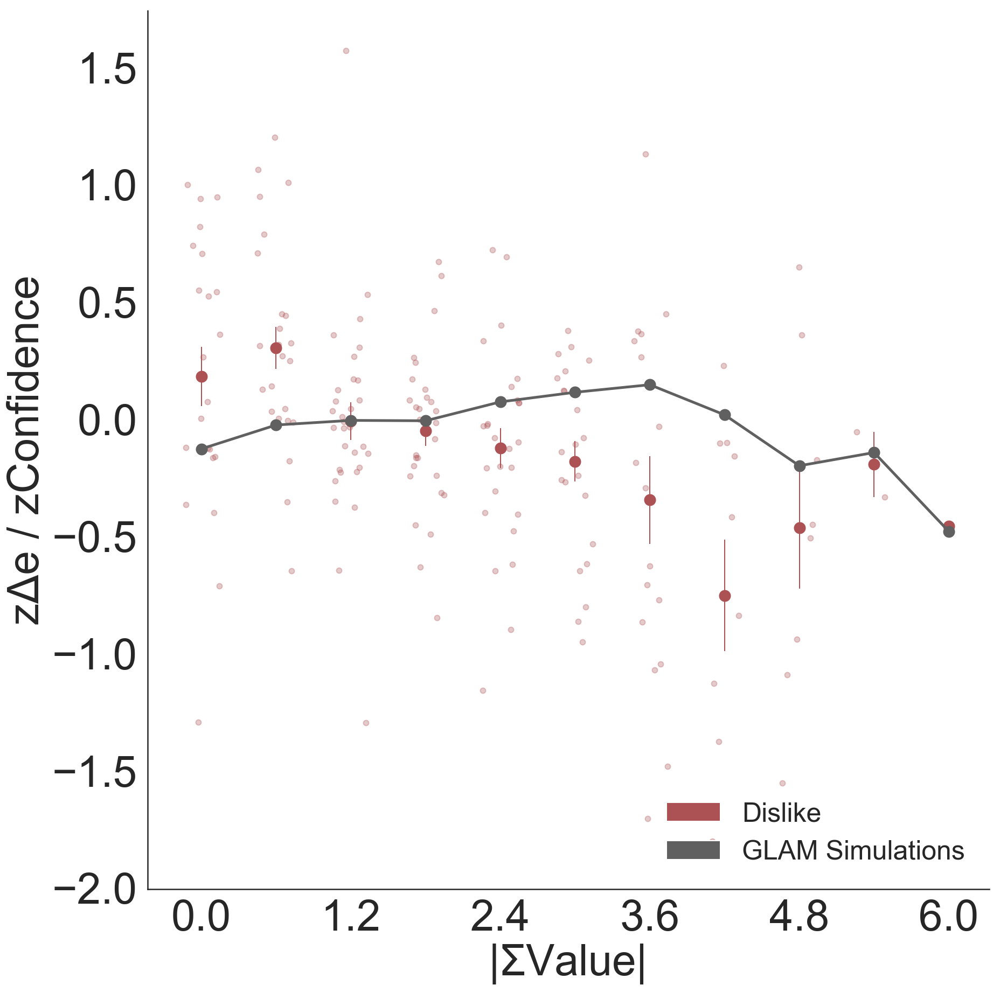

In [111]:
plot_DEv_Conf_TotVal(data_simulation2,'TotVal_orig' , xlabel_skip=2,color1 = '#AC5255',label1 = 'Dislike')

# ----------------------------------------------------------------------

# Is DGaze linked to DVal?

we use the data from simulation 2 since we re taking human data for all the participants those relationships are maintained.

In [112]:
data_GazeVal =  pd.DataFrame()
data_GazeVal["RGaze"] = data.gaze_1 
data_GazeVal["LGaze"] = data.gaze_0 
data_GazeVal["DGaze"] = data.gaze_1 - data.gaze_0
data_GazeVal["AbsDGaze"] = abs(data.gaze_1 - data.gaze_0)
data_GazeVal["zRValue"] = data_all.zRVal.values
data_GazeVal["zLValue"] = data_all.zLVal.values
data_GazeVal["zTotValue"] = data_all.zTotVal.values
data_GazeVal["zDValue"] = data_all.zDVal.values
data_GazeVal["zAbsDValue"] = data_all.zAbsDVal.values
data_GazeVal["DValue"] = data_all.DVal.values
data_GazeVal["zConf"] = data_all.zConf.values



In [113]:
len(data_GazeVal["zDValue"].values)

3720

# Add bin column for Value

In [114]:
# data_GazeVal["zDVal_bin"] = pd.qcut(data_GazeVal["zDValue"].values, 10, labels=[0, 1, 2,3,4,5,6,7,8,9])
data_GazeVal["zDVal_bin"] = pd.to_numeric(pd.qcut(data_GazeVal["zDValue"].values, 5, labels=[0, 1, 2,3,4]))
data_GazeVal["zAbsDVal_bin"] = pd.to_numeric(pd.qcut(data_GazeVal["zAbsDValue"].values, 5, labels=[0, 1, 2,3,4]))

data_GazeVal["zHighVal"] = data_GazeVal[["zRValue", "zLValue"]].max(axis=1)

# Add bin column for Gaze

In [115]:
# data_GazeVal["zDVal_bin"] = pd.qcut(data_GazeVal["zDValue"].values, 10, labels=[0, 1, 2,3,4,5,6,7,8,9])
data_GazeVal["zDGaze_bin"] = pd.to_numeric(pd.qcut(data_GazeVal["DGaze"].values, 5, labels=[0, 1, 2,3,4]))
data_GazeVal["zAbsDGaze_bin"] =pd.to_numeric( pd.qcut(data_GazeVal["AbsDGaze"].values, 5, labels=[0, 1, 2,3,4]))

data_GazeVal["zHighGaze"] = data_GazeVal[["RGaze", "LGaze"]].max(axis=1)

In [116]:
data_GazeVal.head()

,RGaze,LGaze,DGaze,AbsDGaze,zRValue,zLValue,zTotValue,zDValue,zAbsDValue,DValue,zConf,zDVal_bin,zAbsDVal_bin,zHighVal,zDGaze_bin,zAbsDGaze_bin,zHighGaze
0,0.431604,0.568396,-0.136792,0.136792,-1.237881,-0.898735,-1.497033,-0.242061,-0.988498,-0.15,0.582155,1,0,-0.898735,1,1,0.568396
1,0.237668,0.762332,-0.524664,0.524664,0.457846,1.136137,1.116834,-0.484123,-0.570823,-0.30,0.432565,1,1,1.136137,0,4,0.762332
2,0.553191,0.446809,0.106383,0.106383,1.814428,-0.898735,0.641585,1.936492,1.935228,1.20,0.731746,4,4,1.814428,3,1,0.553191
3,0.467648,0.532352,-0.064704,0.064704,-0.220445,-0.559590,-0.546536,0.242061,-0.988498,0.15,-2.260059,3,0,-0.220445,2,0,0.532352
4,0.470264,0.529736,-0.059473,0.059473,1.814428,1.136137,2.067331,0.484123,-0.570823,0.30,-0.165796,3,1,1.814428,2,0,0.529736


Pearson's r = -0.003 p =  0.849


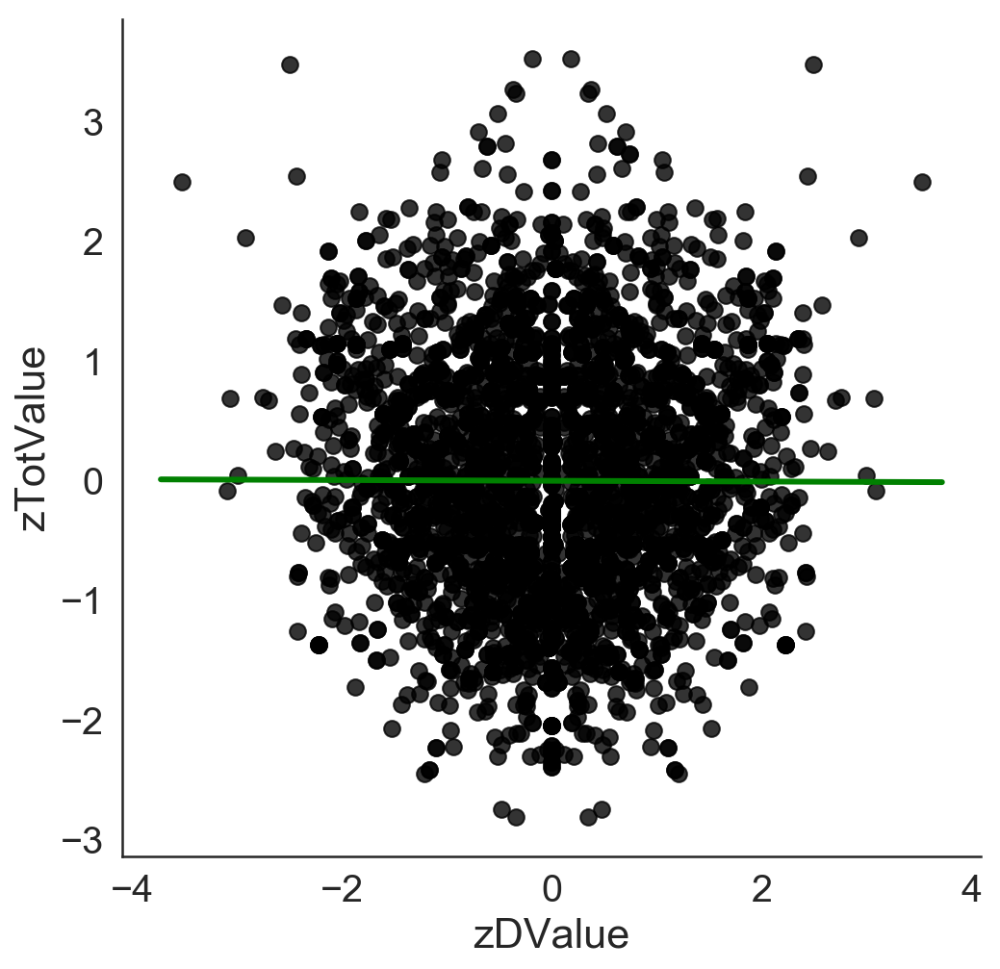

In [117]:
correl_plot(data_GazeVal,'zDValue', "zDValue",'zTotValue','zTotValue')

Pearson's r = 0.287 p =  0.0


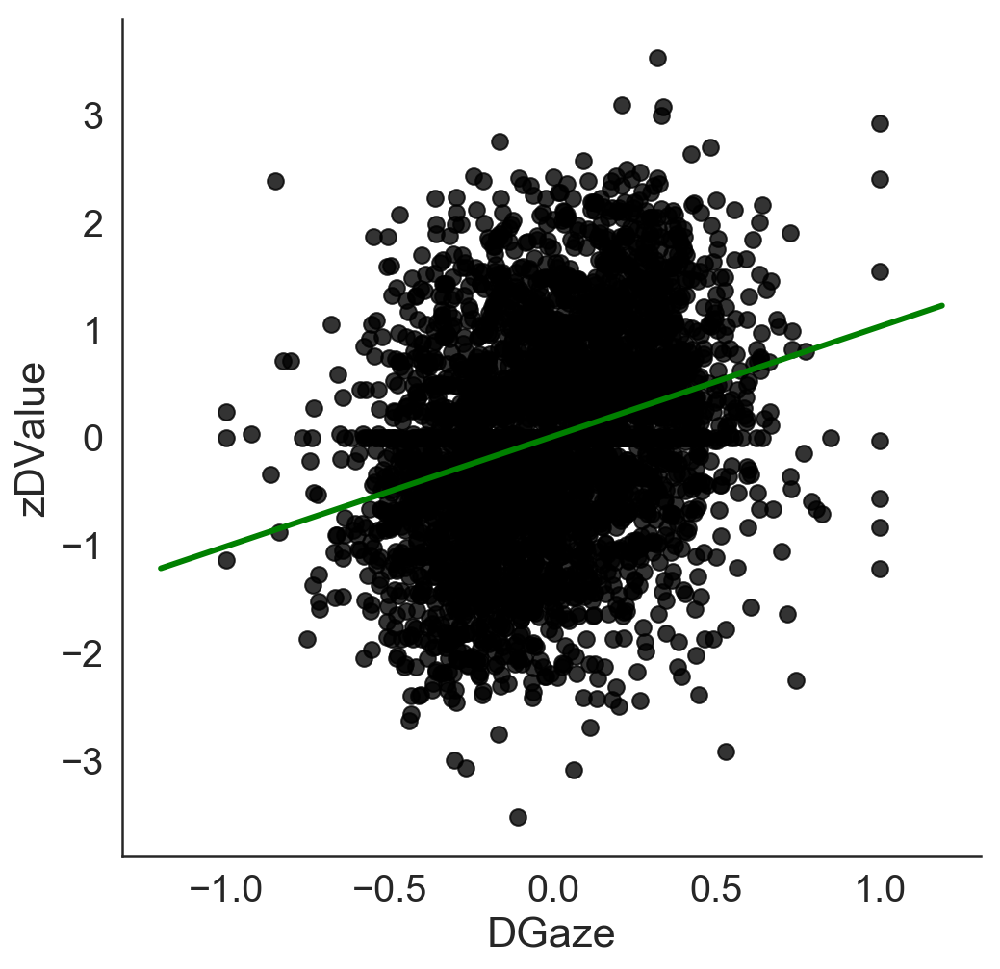

Pearson's r = 0.026 p =  0.116


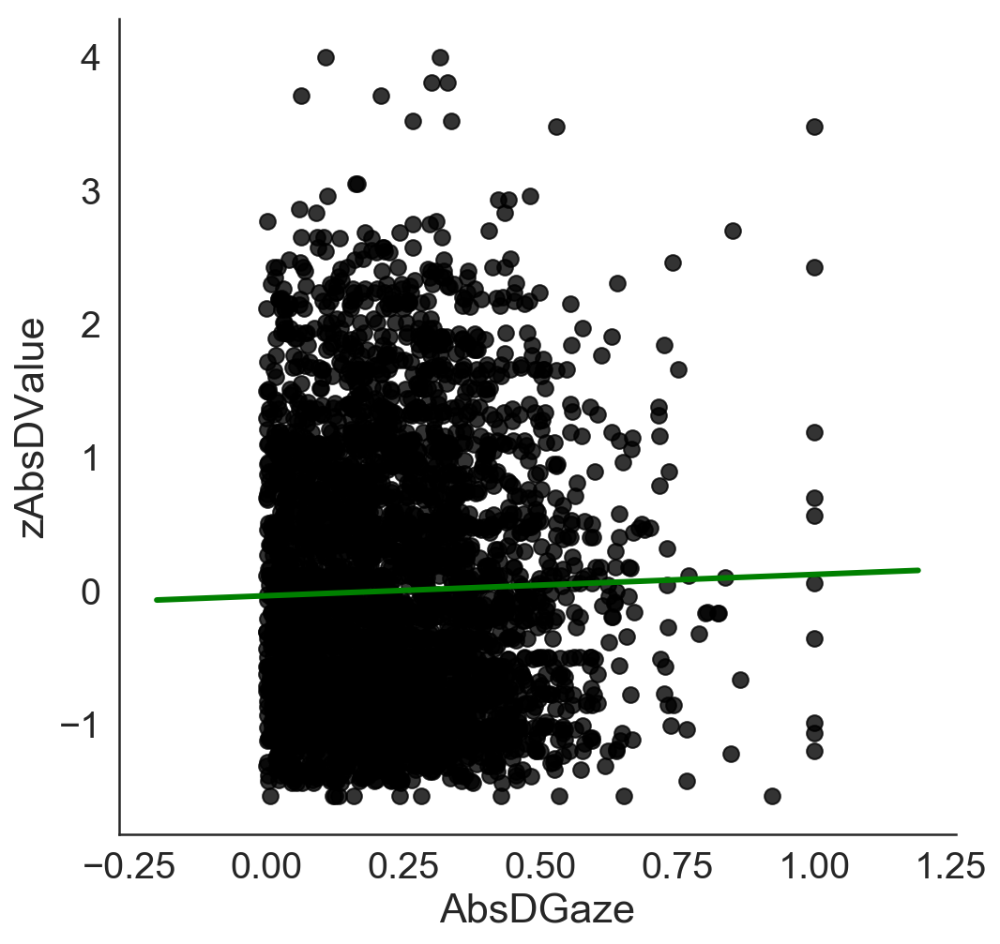

Pearson's r = 0.042 p =  0.01


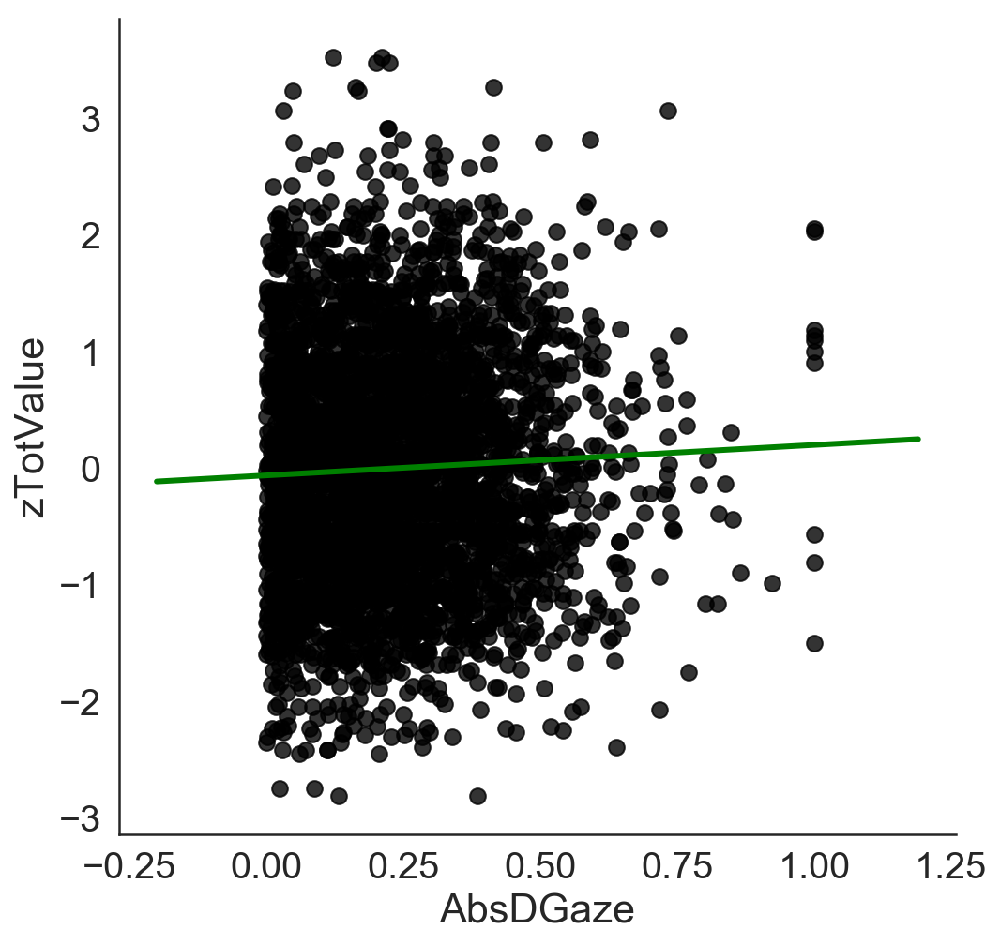

In [118]:
correl_plot(data_GazeVal,'DGaze', "DGaze",'zDValue','zDValue')
correl_plot(data_GazeVal,'AbsDGaze', "AbsDGaze",'zAbsDValue','zAbsDValue')
correl_plot(data_GazeVal,'AbsDGaze', "AbsDGaze",'zTotValue','zTotValue')

Pearson's r = 0.045 p =  0.006


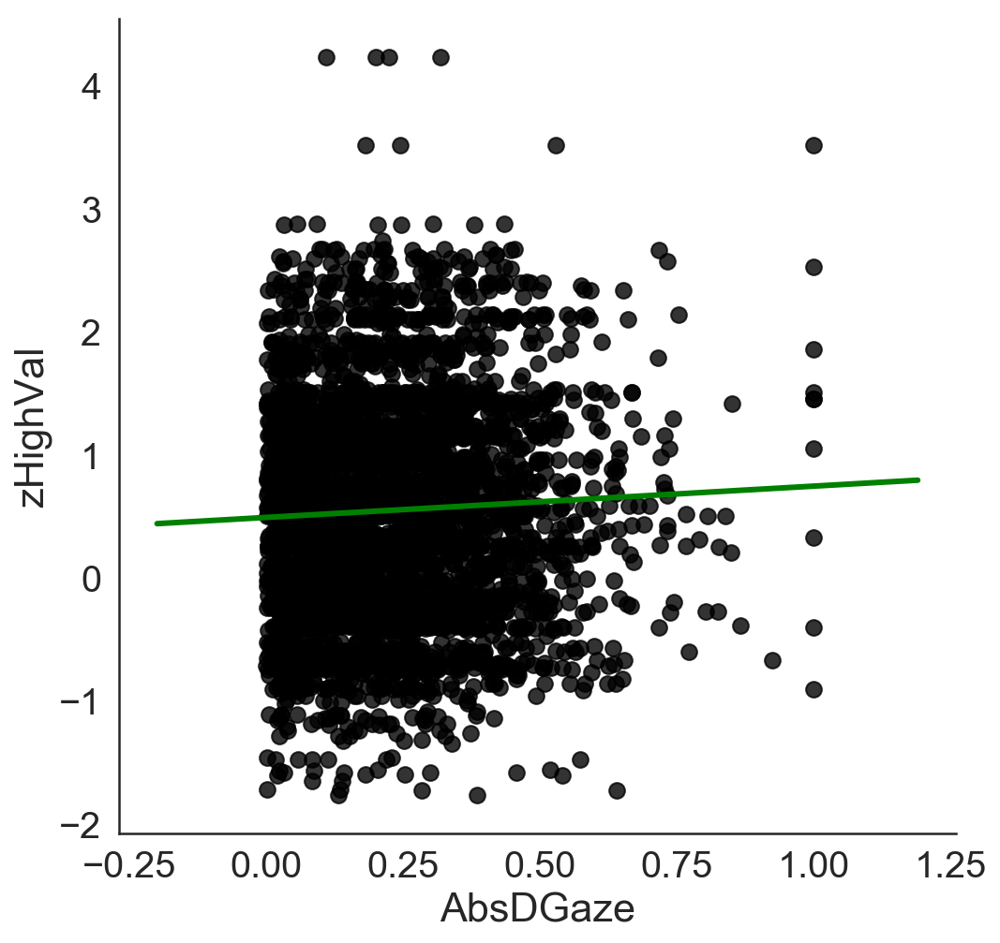

In [119]:
correl_plot(data_GazeVal,'AbsDGaze', "AbsDGaze",'zHighVal','zHighVal')

# Tiny yet significant correlation between |DGaze| and Total Value

In [120]:
%%R -i data_GazeVal
d <- data_GazeVal

BIC: 818.8861
Call:  glm(formula = DGaze ~ zRValue + zLValue, data = d)

Coefficients:
(Intercept)      zRValue      zLValue  
   -0.01265      0.05723     -0.05614  

Degrees of Freedom: 3719 Total (i.e. Null);  3717 Residual
Null Deviance:	    293.1 
Residual Deviance: 269 	AIC: 794


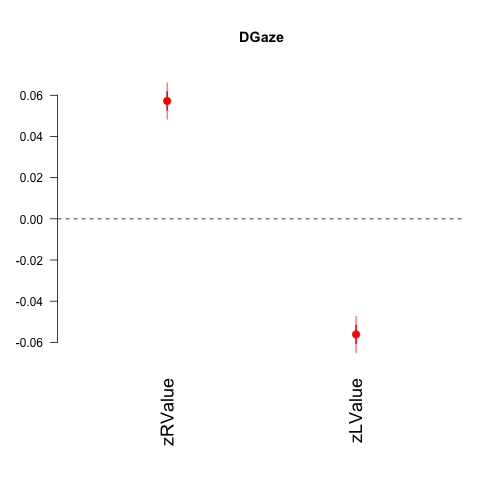

In [121]:
%%R    
title_plot = "DGaze"
ModelChoice_1 <- glm(DGaze ~ zRValue + zLValue  , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

BIC: 823.8782
Call:  glm(formula = DGaze ~ zDValue + zTotValue + zDValue:zTotValue, 
    data = d)

Coefficients:
      (Intercept)            zDValue          zTotValue  zDValue:zTotValue  
       -0.0126313          0.0789689          0.0007934          0.0068928  

Degrees of Freedom: 3719 Total (i.e. Null);  3716 Residual
Null Deviance:	    293.1 
Residual Deviance: 268.8 	AIC: 792.8


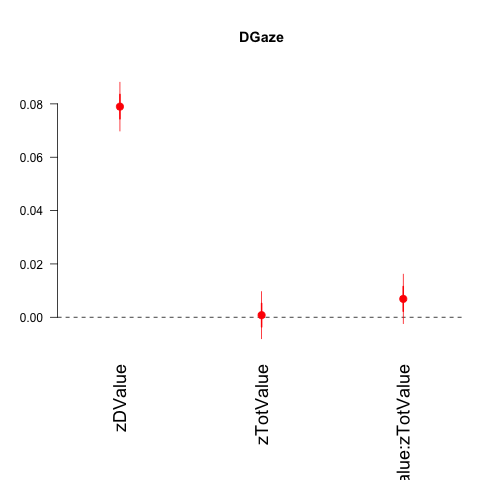

In [122]:
%%R    
title_plot = "DGaze"
ModelChoice_1 <- glm(DGaze ~ zDValue + zTotValue+ zDValue:zTotValue  , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

BIC: -2986.496
Call:  glm(formula = AbsDGaze ~ zAbsDValue + zTotValue, data = d)

Coefficients:
(Intercept)   zAbsDValue    zTotValue  
   0.230028     0.003010     0.006256  

Degrees of Freedom: 3719 Total (i.e. Null);  3717 Residual
Null Deviance:	    96.94 
Residual Deviance: 96.73 	AIC: -3011


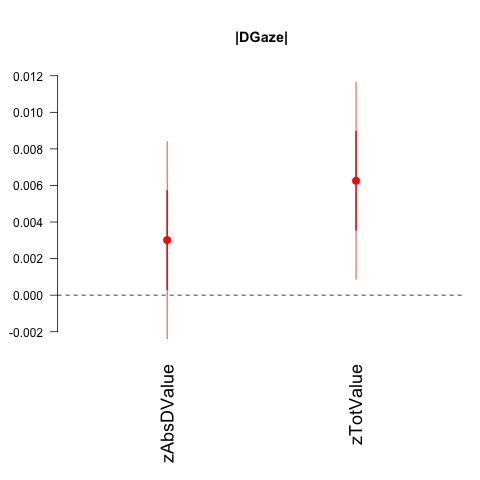

In [123]:
%%R    
title_plot = "|DGaze|"
ModelChoice_1 <- glm(AbsDGaze ~ zAbsDValue +zTotValue , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

## Is DGaze linked to TotValue ?


BIC: -2986.496
Call:  glm(formula = AbsDGaze ~ zAbsDValue + zTotValue, data = d)

Coefficients:
(Intercept)   zAbsDValue    zTotValue  
   0.230028     0.003010     0.006256  

Degrees of Freedom: 3719 Total (i.e. Null);  3717 Residual
Null Deviance:	    96.94 
Residual Deviance: 96.73 	AIC: -3011


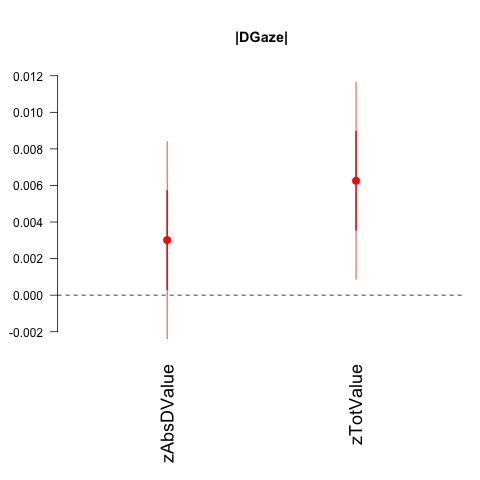

In [124]:
%%R    
title_plot = "|DGaze|"
ModelChoice_1 <- glm(AbsDGaze ~ zAbsDValue +zTotValue , data= d)
coefplot(ModelChoice_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1choice = BIC(ModelChoice_1)
cat("BIC:" , BIC1choice)
ModelChoice_1

If we split by constant DVal...

## Relationship Total Value and DGaze, splitting for DV

DVal = 0
Pearson's r = 0.076 p =  0.038


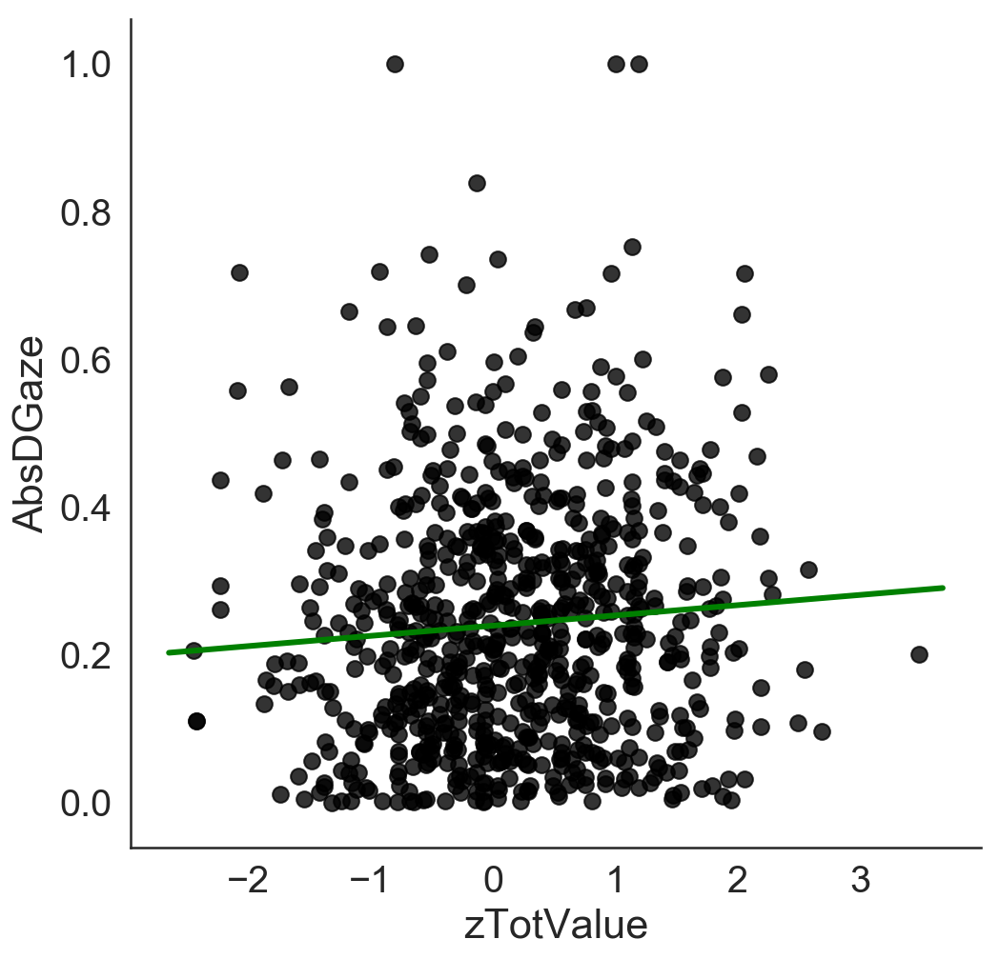

DVal = 1
Pearson's r = 0.039 p =  0.283


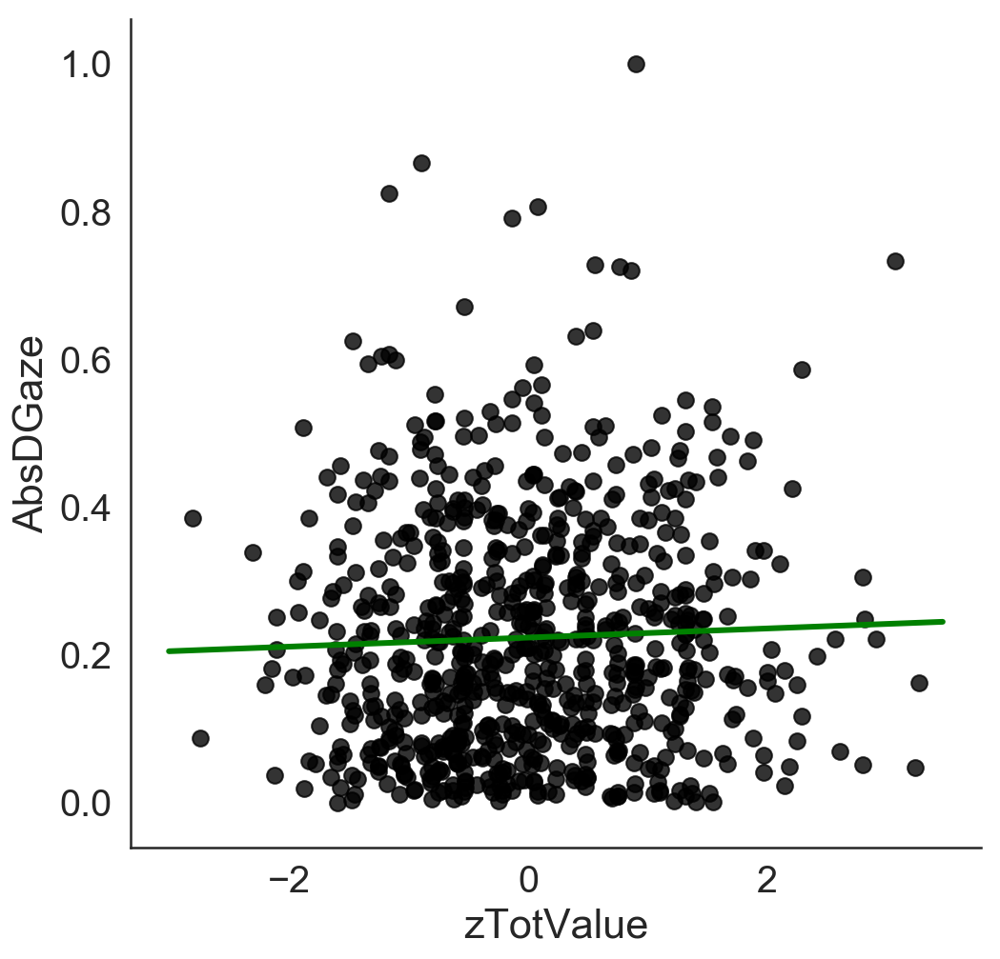

DVal = 2
Pearson's r = 0.022 p =  0.549


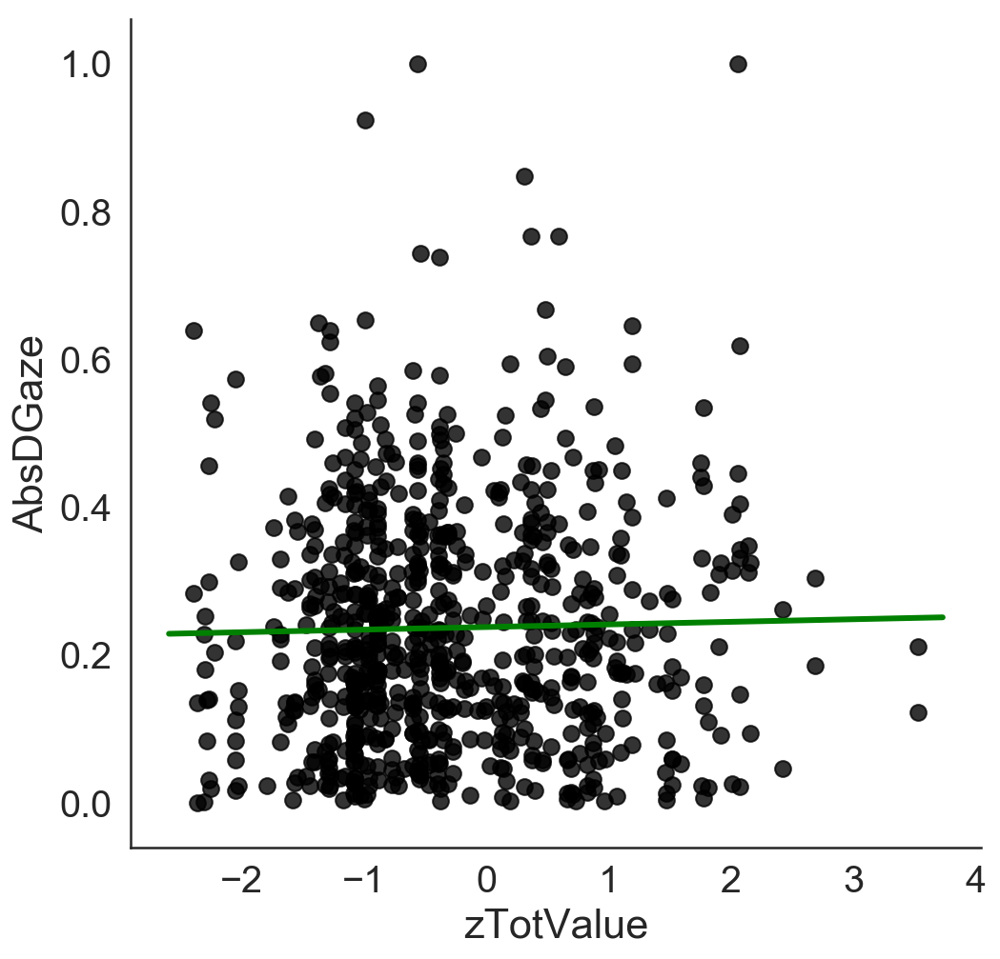

DVal = 3
Pearson's r = -0.017 p =  0.643


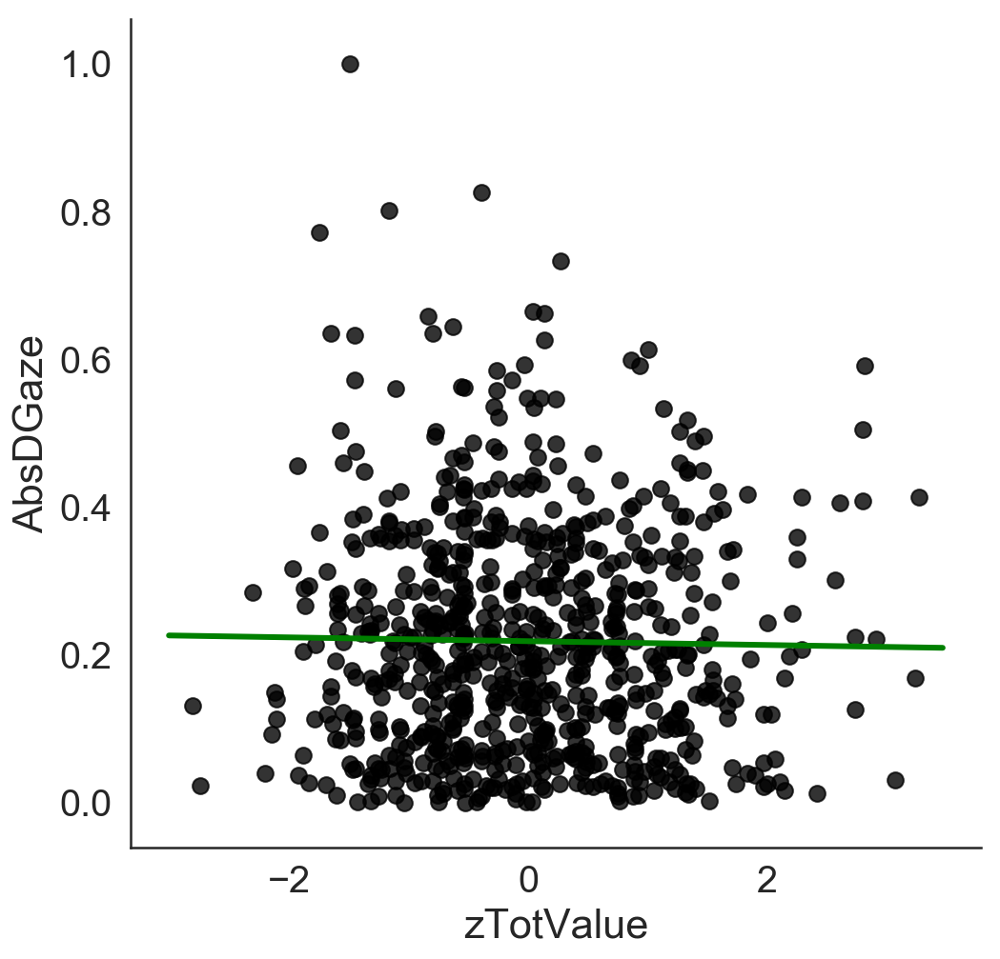

DVal = 4
Pearson's r = 0.098 p =  0.008


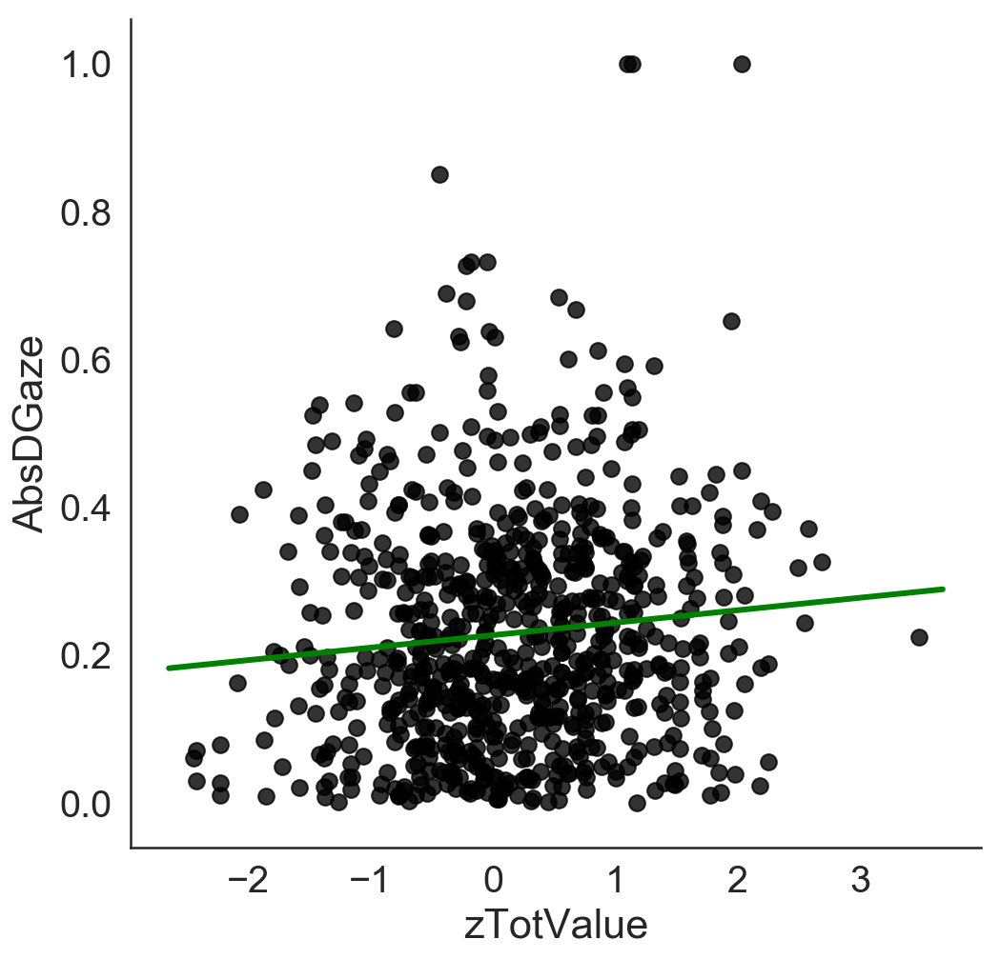

In [125]:

for i in range(5):
    data_GazeVal_extract = data_GazeVal.loc[data_GazeVal['zDVal_bin'] == i] # 1 = Like, 2 = Dislike
    print ('DVal = ' + str(i))
    correl_plot(data_GazeVal_extract,'zTotValue','zTotValue','AbsDGaze', "AbsDGaze") 

## Relationship Total Value and DGaze, splitting for AbsDV

DVal = 0
Pearson's r = -0.007 p =  0.843


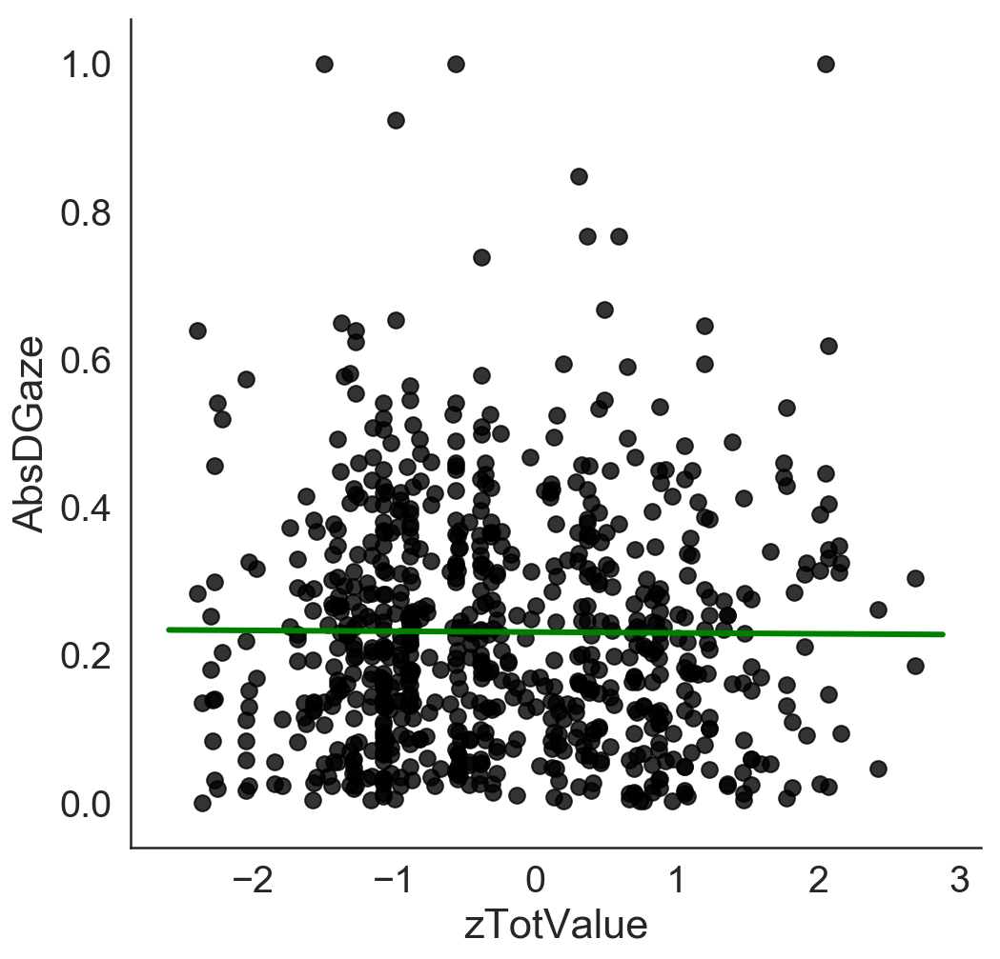

DVal = 1
Pearson's r = 0.055 p =  0.134


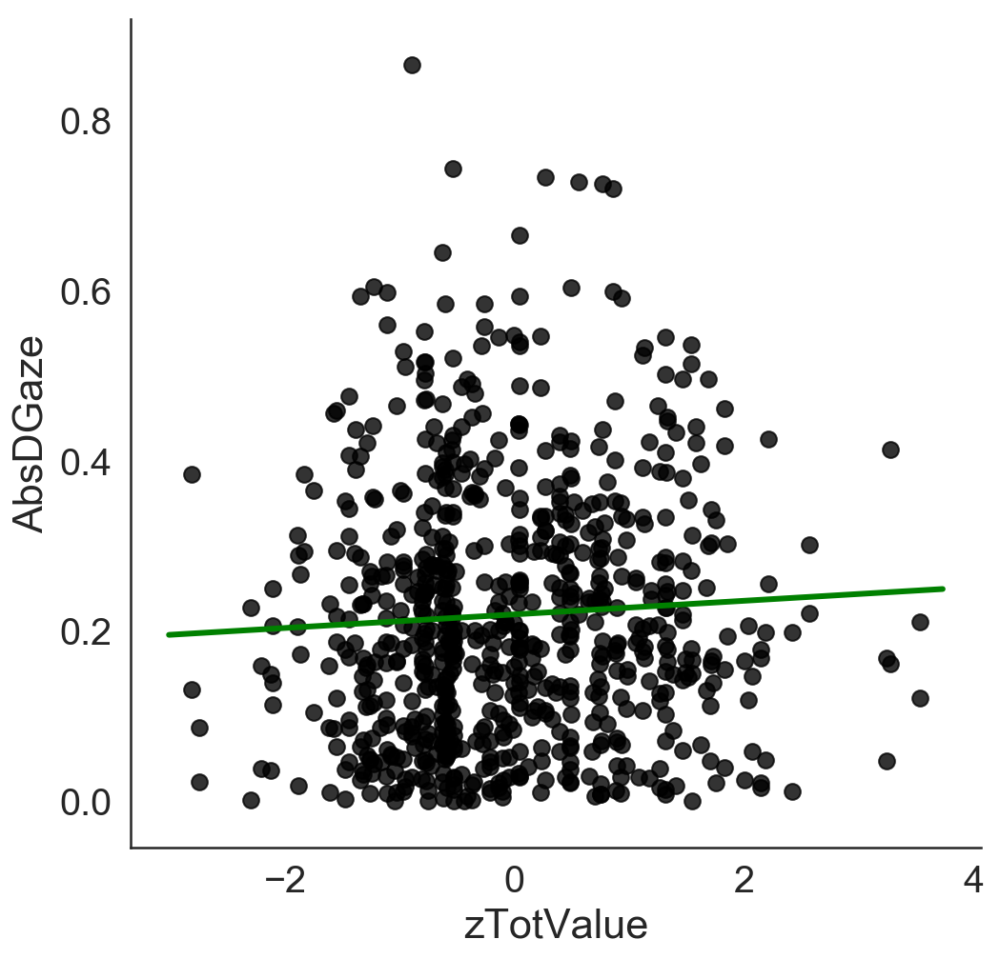

DVal = 2
Pearson's r = -0.013 p =  0.723


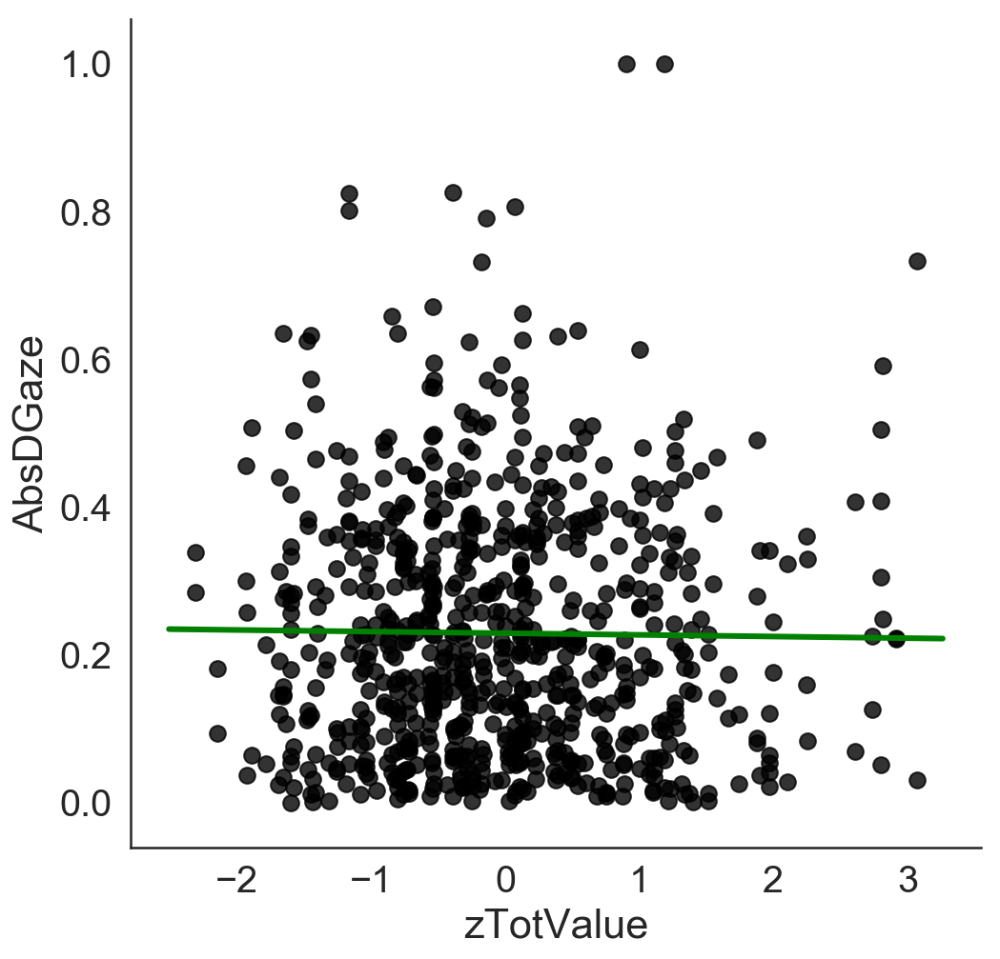

DVal = 3
Pearson's r = 0.035 p =  0.332


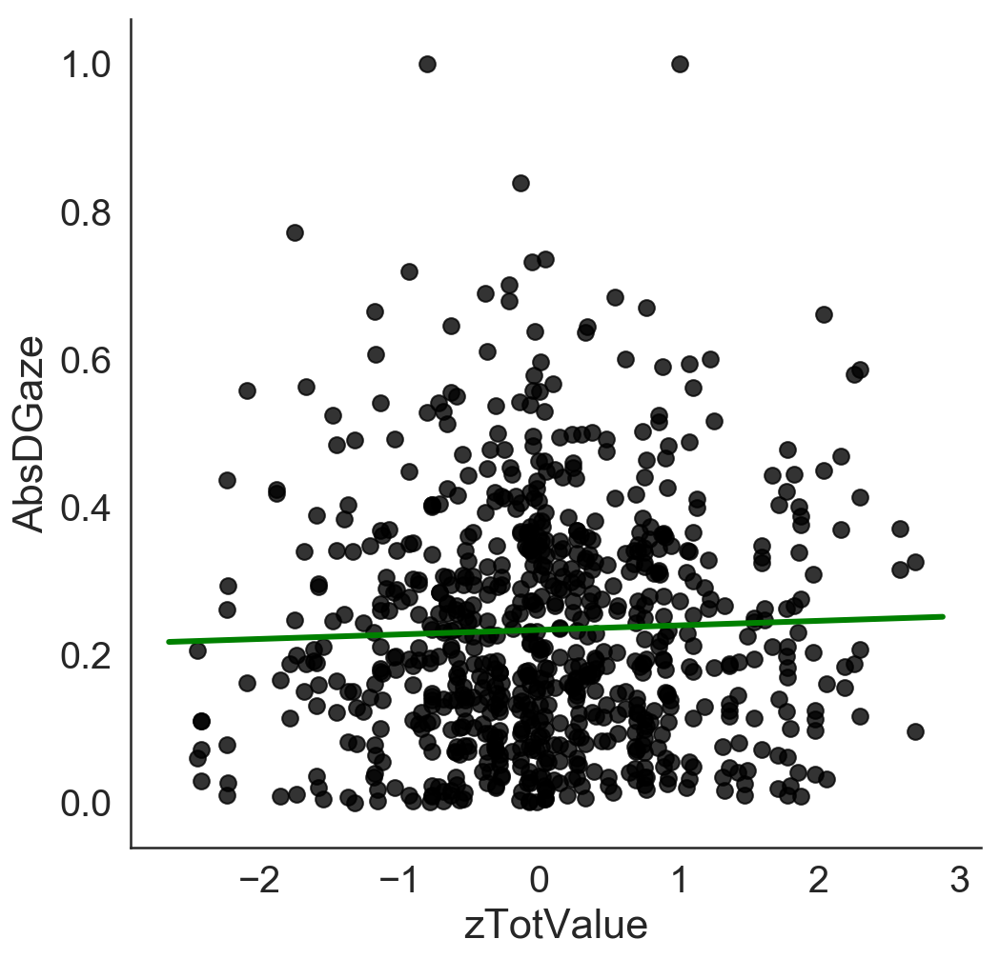

DVal = 4
Pearson's r = 0.148 p =  0.0


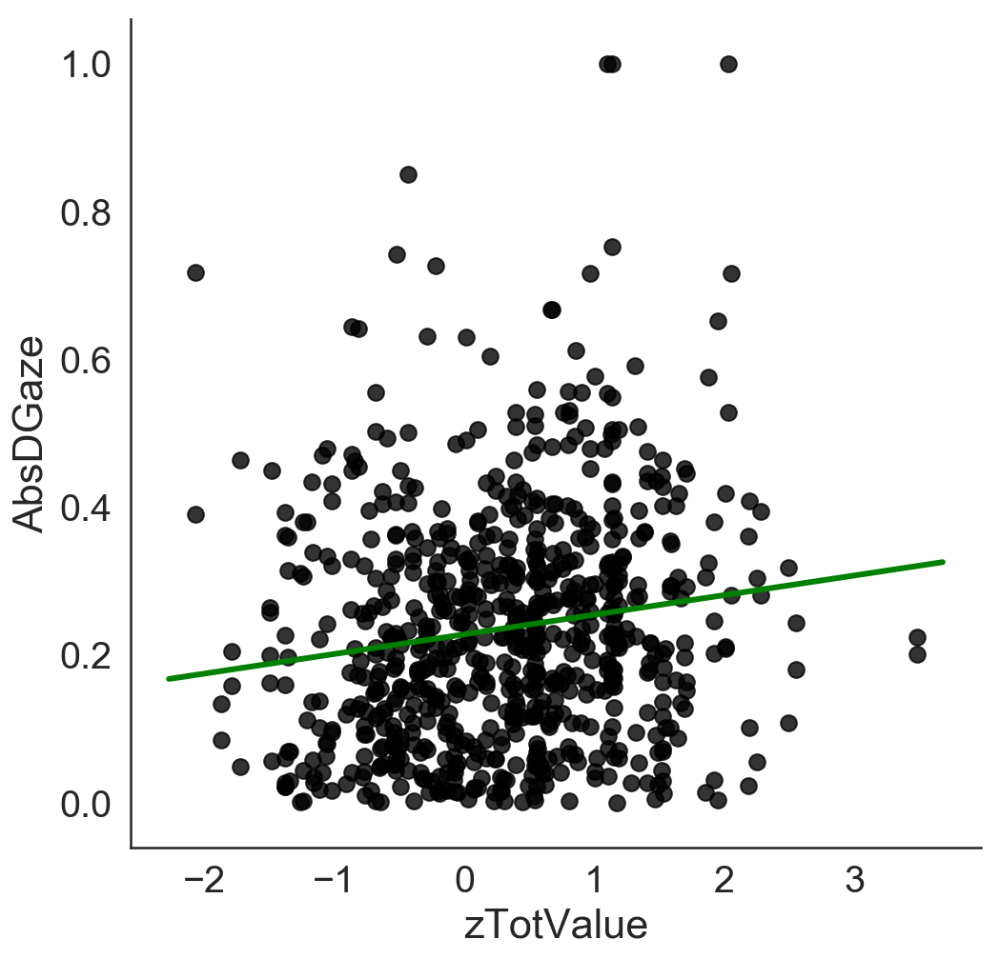

In [126]:

for i in range(5):
    data_GazeVal_extract = data_GazeVal.loc[data_GazeVal['zAbsDVal_bin'] == i] # 1 = Like, 2 = Dislike
    print ('DVal = ' + str(i))
    correl_plot(data_GazeVal_extract,'zTotValue','zTotValue','AbsDGaze', "AbsDGaze") 

We observe a (tiny) effect of Total Value over the magnitude in DGaze. That means that the bigger the difference in value also the magnitude of DGaze will increment. From the correlation above, we see that gaze tends to be aliged with the item of max value.
Therefore, in terms of accumulators, we have that the biggest the total value, the difference in gaze will increase favouring the item with higher value. Given the model, when the selected item is not fixated the rate of accumulation decreases keeping the rate of accumulation of the higher item. 

𝐴 = 𝑔 × 𝑟 + (1 − 𝑔 ) × 𝛾𝑟   

R*left = A_left - A_right   

R*right = A_right - A_left    

Then, the R* will get into the logistic regression to get the accumulation rate. However, given that tau is the same for all, is Rstar the one that should contain the TotValue effect over DEvidence.
The atenuation effect for DEvidence that we observe  for higher TotVal can be explained by the asintote that we have at the extremes of sigmoid function. 

Using mean gamma from params ( negative gamma) that means that there is a leak towards the non fixated item which should increase more the difference between the attended vs unattended item. (Leak: you are substracting evidence when the item is not attended)


In [127]:
# No gaze bias
gamma_t= -0.2
gL_t=0.5
LItem_t = 3 
RItem_t = 2 
AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t

R_starR = AR_t - AL_t
R_starL = AL_t - AR_t
R_starL

0.3999999999999999

In [128]:
# No gaze bias
gamma_t= -0.2
gL_t=0.5
LItem_t = 4
RItem_t = 3 
AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t

R_starR = AR_t - AL_t
R_starL = AL_t - AR_t
R_starL

0.40000000000000013

In [129]:
# No gaze bias
gamma_t= -0.2
gL_t=0.5
LItem_t = 5
RItem_t = 4 
AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t

R_starR = AR_t - AL_t
R_starL = AL_t - AR_t
R_starL

0.3999999999999999

Without gaze bias we don't observe an influence of TotalValue over the result. But if we include the gaze bias. We observe an increase in the magnitude of R*

In [130]:
# gaze bias towards the higher item
gamma_t= 0.5
gL_t=0.7
LItem_t = 3 
RItem_t = 2 
AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t

R_starR = AR_t - AL_t
R_starL = AL_t - AR_t
R_starL

1.2499999999999998

In [131]:
# gaze bias towards the higher item
gamma_t= 0.5
gL_t=0.7
LItem_t = 4 
RItem_t = 3 
AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t

R_starR = AR_t - AL_t
R_starL = AL_t - AR_t
R_starL

1.45

In [132]:
# gaze bias towards the higher item
gamma_t= 0.5
gL_t=0.7
LItem_t = 5 
RItem_t = 4 
AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t

R_starR = AR_t - AL_t
R_starL = AL_t - AR_t
R_starL

1.65

And additionally, if we also include the negative gamma parameter, as the one observed in our participants, the magnitude just increases

In [133]:
# gaze bias towards the higher item
gamma_t= -0.2
gL_t=0.7
LItem_t = 3 
RItem_t = 2 
AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t

R_starR = AR_t - AL_t
R_starL = AL_t - AR_t
R_starL

1.5999999999999994

In [134]:
# gaze bias towards the higher item
gamma_t= -0.2
gL_t=0.7
LItem_t = 4 
RItem_t = 3 
AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t

R_starR = AR_t - AL_t
R_starL = AL_t - AR_t
R_starL

2.079999999999999

In [135]:
# gaze bias towards the higher item
gamma_t= -0.2
gL_t=0.7
LItem_t = 5 
RItem_t = 4 
AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t

R_starR = AR_t - AL_t
R_starL = AL_t - AR_t
R_starL

2.56

# Generate HeatMap for R* (bigger R* means the difference between the accumulator rates will also be bigger)

## For equal gaze ration

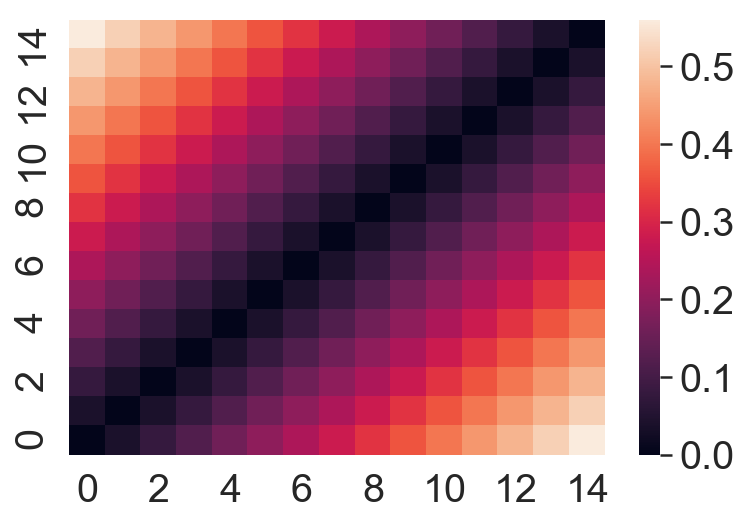

In [136]:
# Create DV data
x = range(0, 30,2)
y = range(0, 30,2)
# Keeping constant 
gL_t = 0.5
gamma_t = -0.2

Rstars_2dim = []
for i in range(len(x)):
    Rstars_1dim = []
    for j in range(len(y)):
        RItem_t = i *0.1
        LItem_t = j *0.1
        AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
        AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t
        R_star = abs (AR_t - AL_t)
        Rstars_1dim.append(R_star)
    Rstars_2dim.append(Rstars_1dim)
df = pd.DataFrame(Rstars_2dim)
df2 = df.reindex(index=df.index[::-1])
p1 = sns.heatmap(df2)

## For assymetric gaze ration

### A. Right more gaze 

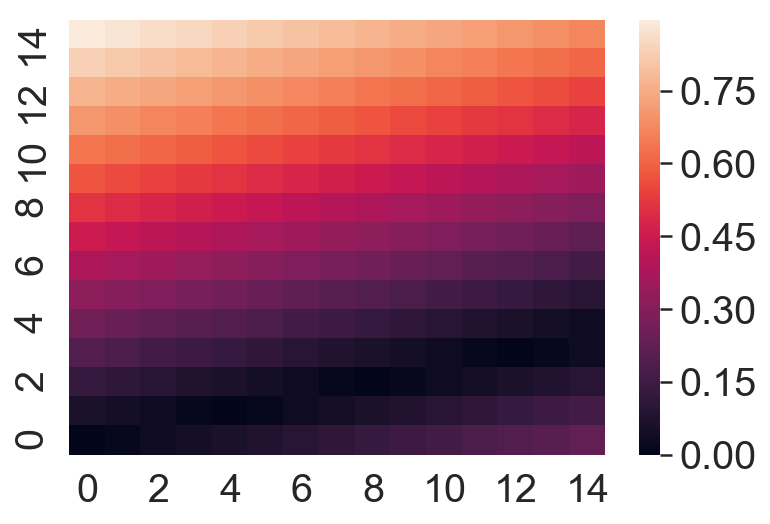

In [137]:
# Create DV data
x = range(0, 30,2)
y = range(0, 30,2)
# Keeping constant 
gL_t = 0.3
gamma_t = -0.2

Rstars_2dim = []
for i in range(len(x)):
    Rstars_1dim = []
    for j in range(len(y)):
        RItem_t = i *0.1
        LItem_t = j *0.1
        AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
        AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t
        R_star = abs (AR_t - AL_t)
        Rstars_1dim.append(R_star)
    Rstars_2dim.append(Rstars_1dim)
df = pd.DataFrame(Rstars_2dim)
df2 = df.reindex(index=df.index[::-1])
p1 = sns.heatmap(df2)

## B. Left more gaze

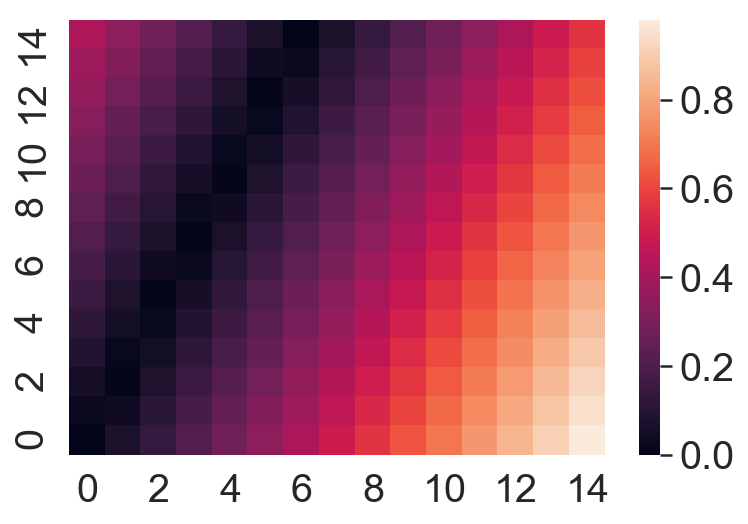

In [138]:
# Create DV data
x = range(0, 30,2)
y = range(0, 30,2)
# Keeping constant 
gL_t = 0.7
gamma_t = -0.0

Rstars_2dim = []
for i in range(len(x)):
    Rstars_1dim = []
    for j in range(len(y)):
        RItem_t = i *0.1
        LItem_t = j *0.1
        AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
        AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t
        R_star = abs (AR_t - AL_t)
        Rstars_1dim.append(R_star)
    Rstars_2dim.append(Rstars_1dim)
df = pd.DataFrame(Rstars_2dim)
df2 = df.reindex(index=df.index[::-1])
p1 = sns.heatmap(df2)

## Changing the gamma value : equal gaze ratio

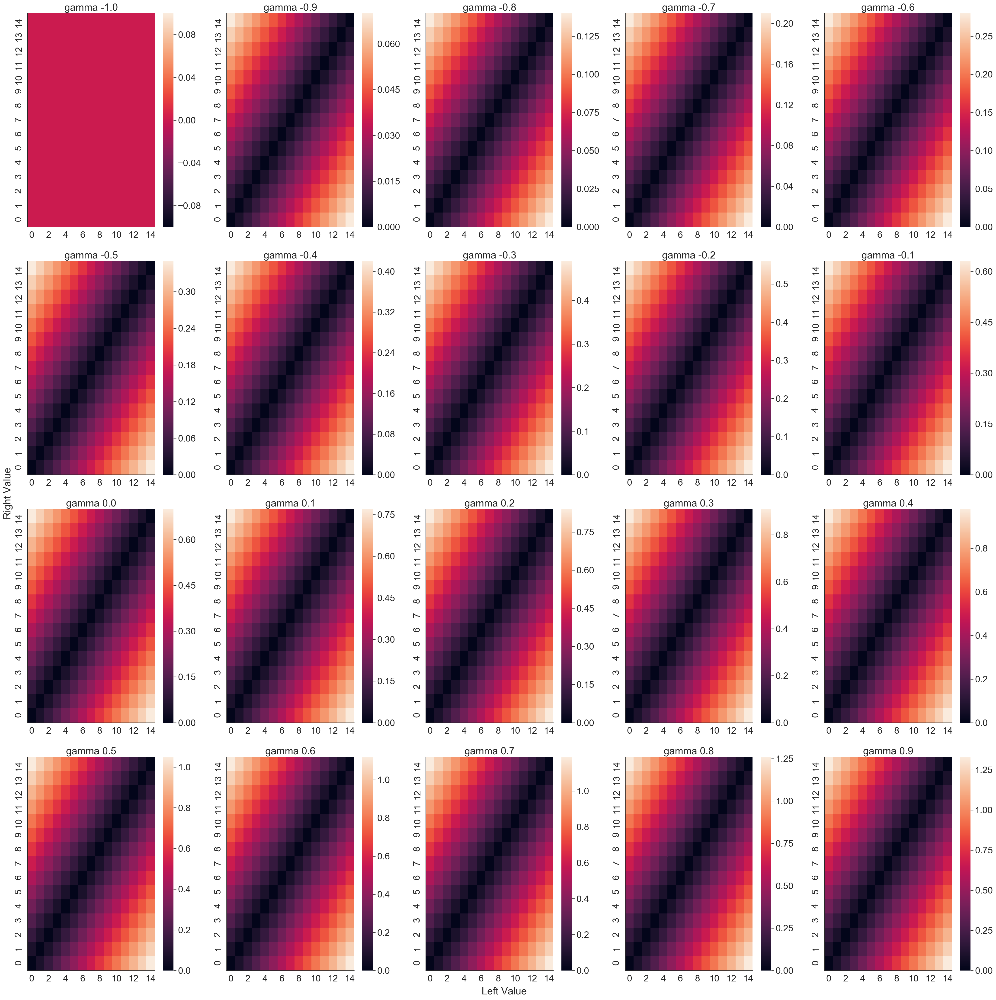

In [139]:
order = 1
f = plt.figure(figsize=(30, 30))
for gama in range(-10,10):
    # Create DV data
    x = range(0, 30,2)
    y = range(0, 30,2)
    # Keeping constant 
    gL_t = 0.5
    gamma_t = gama*0.1
   # print ('gamma:' + str(gamma_t))
    
    Rstars_2dim = []
    for i in range(len(x)):
        Rstars_1dim = []
        for j in range(len(y)):
            RItem_t = i *0.1
            LItem_t = j *0.1
            AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
            AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t
            R_star = abs (AR_t - AL_t)
            Rstars_1dim.append(R_star)
        Rstars_2dim.append(Rstars_1dim)
    df = pd.DataFrame(Rstars_2dim)
    df2 = df.reindex(index=df.index[::-1])
    
    sub={}
    sub['%s' % order] = plt.subplot(int(len(range(-10,10))/5), 5, order)
    sub['%s' % order].set_title('gamma %s' % round(gamma_t,2))

    p1 = sns.heatmap(df2)
    
    order += 1
 
    sns.despine()

    
f.text(0.5, 0.0, 'Left Value', ha='center')
f.text(0.0, 0.5, 'Right Value', va='center', rotation='vertical')
plt.tight_layout()
    


## Changing the gamma value : left more gaze

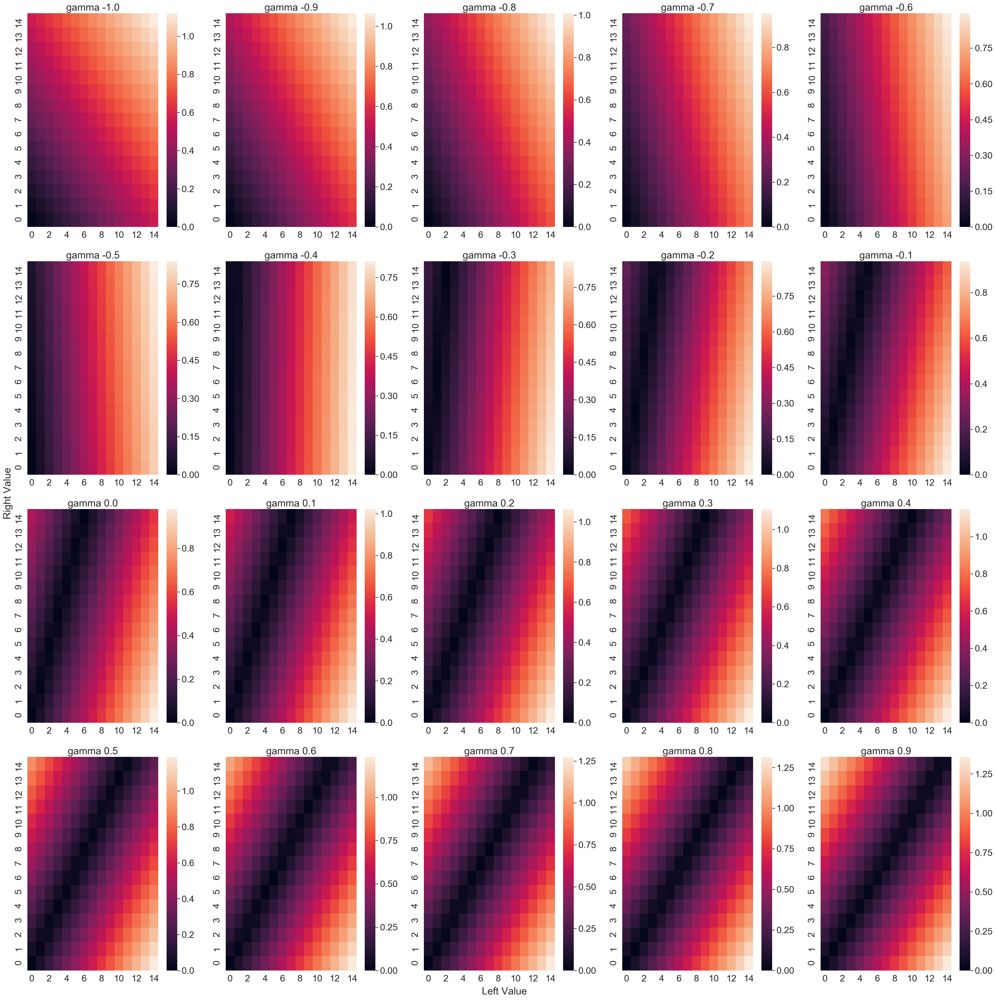

In [140]:
order = 1
f = plt.figure(figsize=(30, 30))
for gama in range(-10,10):
    # Create DV data
    x = range(0, 30,2)
    y = range(0, 30,2)
    # Keeping constant 
    gL_t = 0.7
    gamma_t = gama*0.1
   # print ('gamma:' + str(gamma_t))
    
    Rstars_2dim = []
    for i in range(len(x)):
        Rstars_1dim = []
        for j in range(len(y)):
            RItem_t = i *0.1
            LItem_t = j *0.1
            AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
            AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t
            R_star = abs (AR_t - AL_t)
            Rstars_1dim.append(R_star)
        Rstars_2dim.append(Rstars_1dim)
    df = pd.DataFrame(Rstars_2dim)
    df2 = df.reindex(index=df.index[::-1])
    
    sub={}
    sub['%s' % order] = plt.subplot(int(len(range(-10,10))/5), 5, order)
    sub['%s' % order].set_title('gamma %s' % round(gamma_t,2))

    p1 = sns.heatmap(df2)
    
    order += 1
    
    
   # x_labels = [round(0.1*ii,2) for ii in x]
   # y_labels = [round(0.1*jj,2) for jj in y]
   # plt.xticks(range(len(y)),y_labels)
   # plt.yticks(range(len(x)),x_labels)
   # sns.despine()

    
f.text(0.5, 0.0, 'Left Value', ha='center')
f.text(0.0, 0.5, 'Right Value', va='center', rotation='vertical')
plt.tight_layout()


## Changing gaze ratio

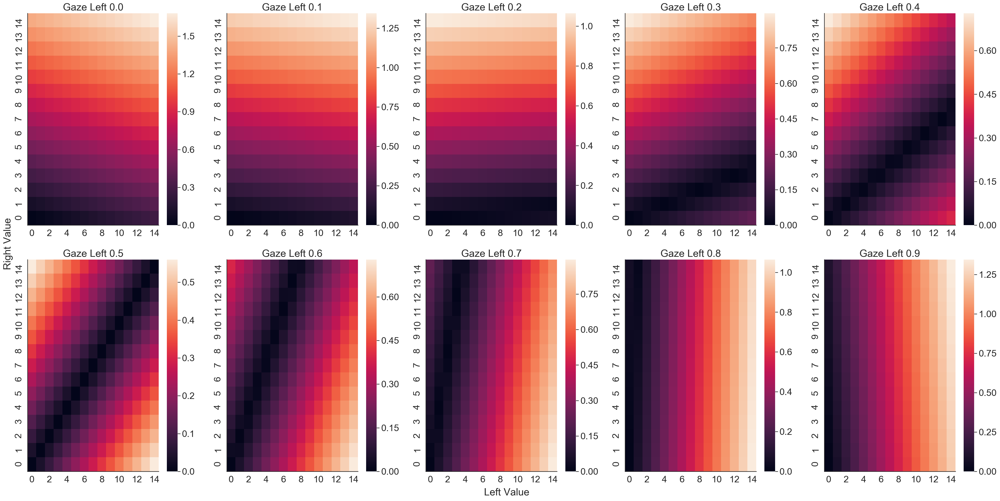

In [141]:
order = 1
f = plt.figure(figsize=(30, 15))
for gaze in range(0,10):
    # Create DV data
    x = range(0, 30,2)
    y = range(0, 30,2)
    # Keeping constant 
    gL_t = gaze*0.1
    gamma_t = -0.2
   # print ('gamma:' + str(gamma_t))
    
    Rstars_2dim = []
    for i in range(len(x)):
        Rstars_1dim = []
        for j in range(len(y)):
            RItem_t = i *0.1
            LItem_t = j *0.1
            AL_t = gL_t*LItem_t + (1-gL_t)*gamma_t*LItem_t
            AR_t = (1-gL_t)*RItem_t + (gL_t)*gamma_t*RItem_t
            R_star = abs (AR_t - AL_t)
            Rstars_1dim.append(R_star)
        Rstars_2dim.append(Rstars_1dim)
    df = pd.DataFrame(Rstars_2dim)
    df2 = df.reindex(index=df.index[::-1])
    
    sub={}
    sub['%s' % order] = plt.subplot(int(len(range(0,10))/5), 5, order)
    sub['%s' % order].set_title('Gaze Left %s' % round(gL_t,2))

    p1 = sns.heatmap(df2)
    
    order += 1
    sns.despine()

    
f.text(0.5, 0.0, 'Left Value', ha='center')
f.text(0.0, 0.5, 'Right Value', va='center', rotation='vertical')
plt.tight_layout()


We see how R* increases for higher total value even if we mantain the same DV, that means that the boost of evidence due to attention is real. 

distributions seemed strange for TotVal, but the real data has that shape

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7faf7922e400>]],
      dtype=object)

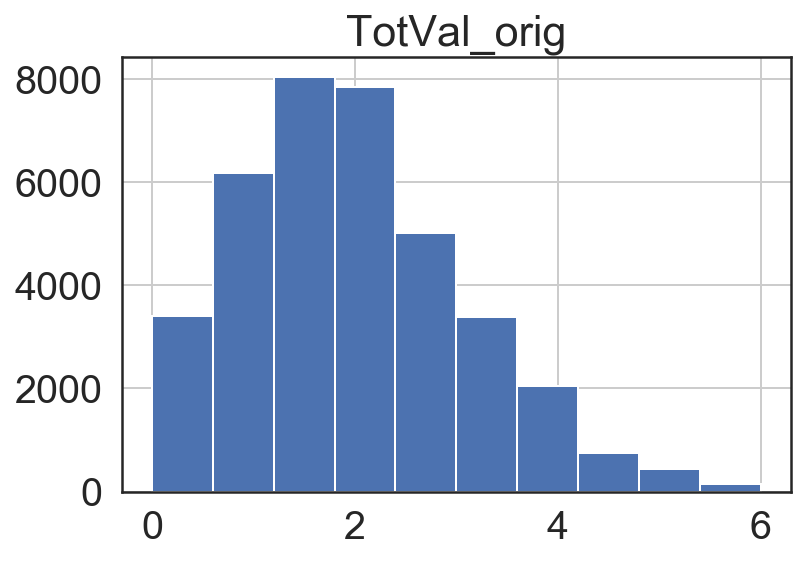

In [142]:
data_simulation.hist(column='TotVal_orig')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7faf89265048>]],
      dtype=object)

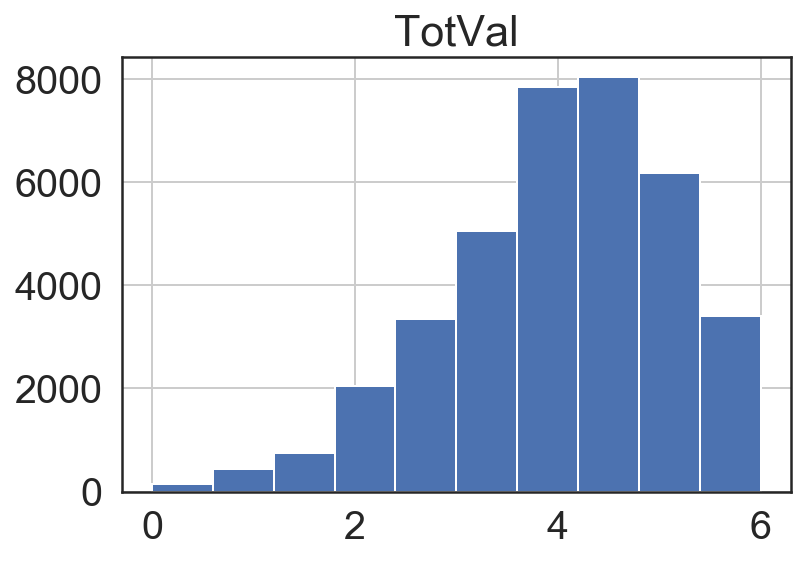

In [143]:
data_simulation.hist(column='TotVal')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7faf9bf673c8>]],
      dtype=object)

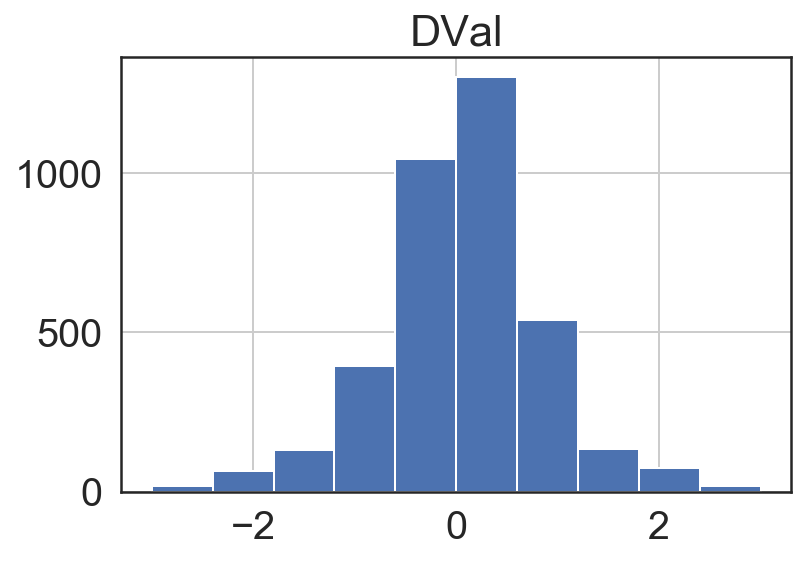

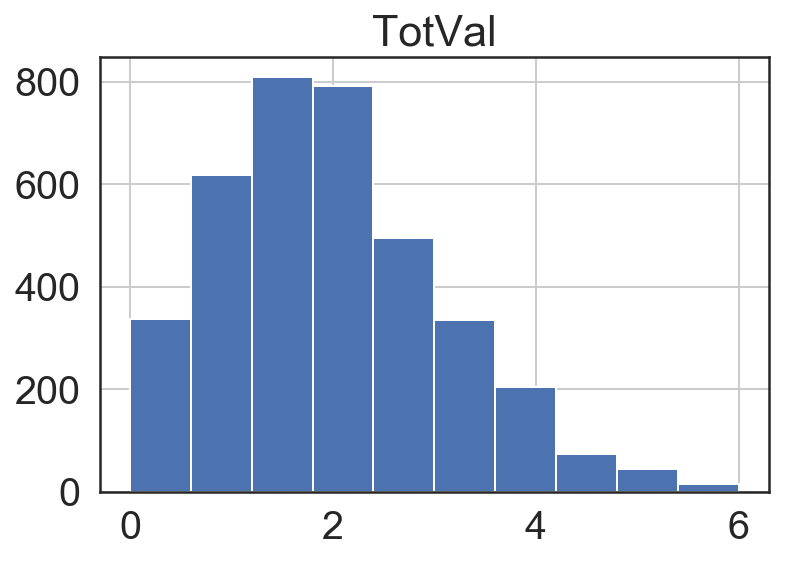

In [144]:
data_all.hist(column='DVal')
data_all.hist(column='TotVal')

# Confidence is linked to high value item??

In [145]:
data_all.columns

Index(['Part', 'TrialN', 'PairID', 'LItem', 'LVal', 'RItem', 'RVal', 'Choice',
       'RT', 'Conf', 'ConfRT', 'BlockCond', 'DDT', 'LDwellTime', 'RDwellTime',
       'GSF', 'LastFixat', 'DVal', 'zDVal', 'AbsDVal', 'zAbsDVal', 'zConf',
       'zRT', 'DFam', 'LFam', 'RFam', 'TotFam', 'TotVal', 'ChosenFam',
       'UnchosenFam', 'ChosenVal', 'UnchosenVal', 'Correct', 'LValConfBDM',
       'LFamConfBDM', 'RValConfBDM', 'RFamConfBDM', 'zDFam', 'zTotFam',
       'zTotVal', 'zChosenVal', 'zUnchosenVal', 'zChosenFam', 'zUnchosenFam',
       'zGSF', 'zDDT', 'zAbsDDT', 'zAbsDFam', 'zLVal', 'zRVal', 'zLFam',
       'zRFam', 'zLValConfBDM', 'zLFamConfBDM', 'zRValConfBDM', 'zRFamConfBDM',
       'ConfSplit', 'GSFSplit', 'DDTSplit'],
      dtype='object')

In [146]:
# add higher value
data_all["zHighVal"] = data_all[["zRVal", "zLVal"]].max(axis=1)
data_all2["zHighVal"] = data_all2[["zRVal", "zLVal"]].max(axis=1)

# add lower value
data_all["zLowVal"] = data_all[["zRVal", "zLVal"]].min(axis=1)
data_all2["zLowVal"] = data_all2[["zRVal", "zLVal"]].min(axis=1)

In [147]:
data_all[['zLVal','zRVal','zHighVal','zLowVal']]

,zLVal,zRVal,zHighVal,zLowVal
40,-0.898735,-1.237881,-0.898735,-1.237881
41,1.136137,0.457846,1.136137,0.457846
42,-0.898735,1.814428,1.814428,-0.898735
43,-0.559590,-0.220445,-0.220445,-0.559590
44,1.136137,1.814428,1.814428,1.136137
45,0.457846,0.796992,0.796992,0.457846
46,0.796992,-1.916172,0.796992,-1.916172
47,0.118701,-1.577026,0.118701,-1.577026
48,0.118701,-0.898735,0.118701,-0.898735
49,-0.898735,1.136137,1.136137,-0.898735


In [148]:
%%R -i data_all -i data_all2
d <- data_all
d2 <- data_all2

 BIC Like:  10019.06 BIC Dislike:  10599.82
Call:  glm(formula = zConf ~ zHighVal + zLowVal + zTotVal + zConf, data = d2)

Coefficients:
(Intercept)     zHighVal      zLowVal      zTotVal  
    -0.3833      -1.1993      -1.7159       1.8491  

Degrees of Freedom: 3719 Total (i.e. Null);  3716 Residual
Null Deviance:	    4019 
Residual Deviance: 3722 	AIC: 10570


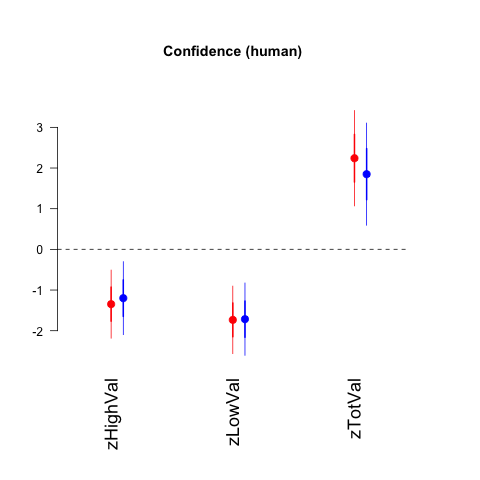

In [149]:
%%R    
title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~ zHighVal + zLowVal + zTotVal + zConf  , data= d)
ModelDislike_1 <- glm(zConf ~ zHighVal + zLowVal  + zTotVal + zConf  , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5),main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)

#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  9827.397 BIC Dislike:  10331.61
Call:  glm(formula = zConf ~ zDVal + zRT + zTotVal + zGSF, data = d2)

Coefficients:
(Intercept)        zDVal          zRT      zTotVal         zGSF  
  -0.068366     0.008944    -0.266803    -0.117868    -0.104240  

Degrees of Freedom: 3719 Total (i.e. Null);  3715 Residual
Null Deviance:	    4019 
Residual Deviance: 3455 	AIC: 10290


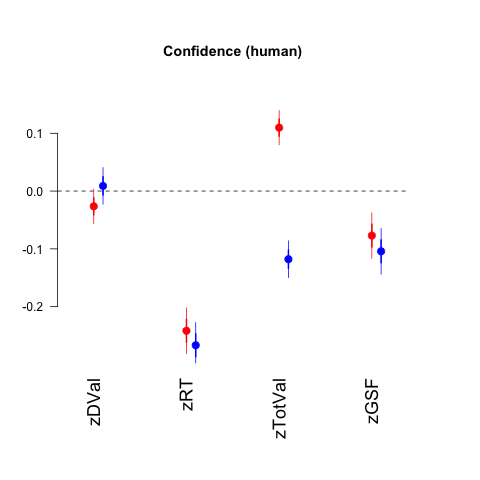

In [150]:
%%R    
title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~ zDVal + zRT + zTotVal + zGSF  , data= d)
ModelDislike_1 <- glm(zConf ~ zDVal + zRT + zTotVal + zGSF, data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5),main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  9748.712 BIC Dislike:  10209.45
Call:  glm(formula = zConf ~ zDVal + zRT + zTotVal + zGSF + zHighVal + 
    zLowVal, data = d2)

Coefficients:
(Intercept)        zDVal          zRT      zTotVal         zGSF     zHighVal  
  -0.296143     0.007836    -0.245165     1.534849    -0.096486    -1.000427  
    zLowVal  
  -1.406111  

Degrees of Freedom: 3719 Total (i.e. Null);  3713 Residual
Null Deviance:	    4019 
Residual Deviance: 3329 	AIC: 10160


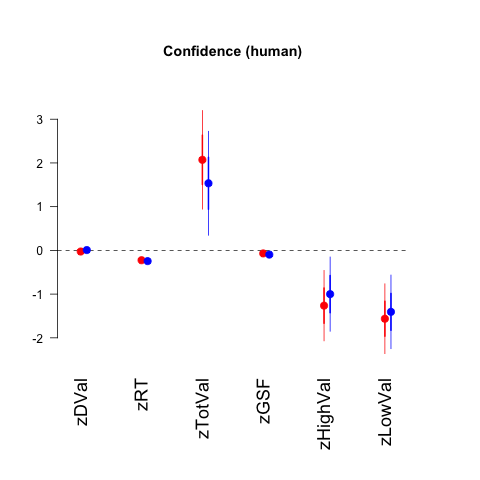

In [151]:
%%R    
title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~ zDVal + zRT + zTotVal + zGSF+ zHighVal + zLowVal  , data= d)
ModelDislike_1 <- glm(zConf ~ zDVal + zRT + zTotVal + zGSF + zHighVal + zLowVal   , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5),main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

# Effect of separated High and Low (instead of TotVal) value over Confidence 

 BIC Like:  9747.907 BIC Dislike:  10198.89
Call:  glm(formula = zConf ~ zAbsDVal + zRT + zGSF + zTotVal, data = d2)

Coefficients:
(Intercept)     zAbsDVal          zRT         zGSF      zTotVal  
   -0.07076      0.18582     -0.24484     -0.09816     -0.15588  

Degrees of Freedom: 3719 Total (i.e. Null);  3715 Residual
Null Deviance:	    4019 
Residual Deviance: 3334 	AIC: 10160


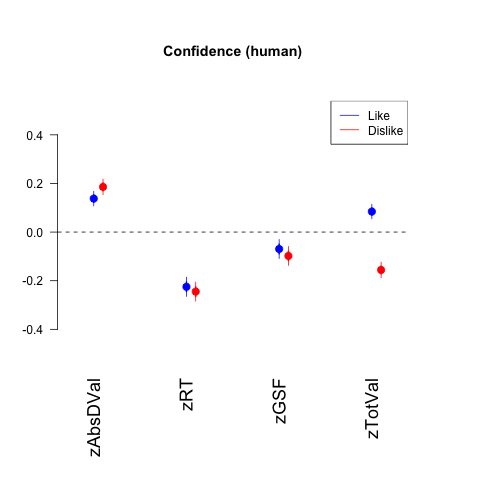

In [152]:
%%R    
title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~ zAbsDVal + zRT  + zGSF+ zTotVal    , data= d)
ModelDislike_1 <- glm(zConf ~ zAbsDVal + zRT  + zGSF + zTotVal   , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-0.5, 0.5) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)

legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  9757.006 BIC Dislike:  10205.29
Call:  glm(formula = zConf ~ zAbsDVal + zRT + zGSF + zHighVal + zLowVal, 
    data = d2)

Coefficients:
(Intercept)     zAbsDVal          zRT         zGSF     zHighVal      zLowVal  
   0.047042     0.279125    -0.244800    -0.098024    -0.216713    -0.004553  

Degrees of Freedom: 3719 Total (i.e. Null);  3714 Residual
Null Deviance:	    4019 
Residual Deviance: 3333 	AIC: 10160


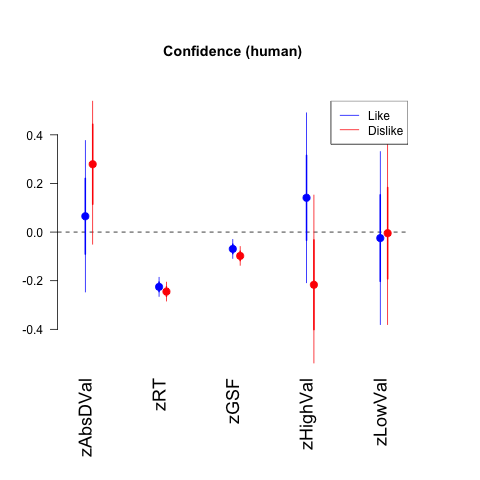

In [153]:
%%R    
title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~ zAbsDVal + zRT  + zGSF+ zHighVal + zLowVal    , data= d)
ModelDislike_1 <- glm(zConf ~ zAbsDVal + zRT  + zGSF + zHighVal + zLowVal   , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-0.5, 0.5) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  9748.959 BIC Dislike:  10199.95
Call:  glm(formula = zConf ~ zRT + zGSF + zHighVal + zLowVal, data = d2)

Coefficients:
(Intercept)          zRT         zGSF     zHighVal      zLowVal  
   -0.30156     -0.24485     -0.09802      0.09462     -0.32099  

Degrees of Freedom: 3719 Total (i.e. Null);  3715 Residual
Null Deviance:	    4019 
Residual Deviance: 3335 	AIC: 10160


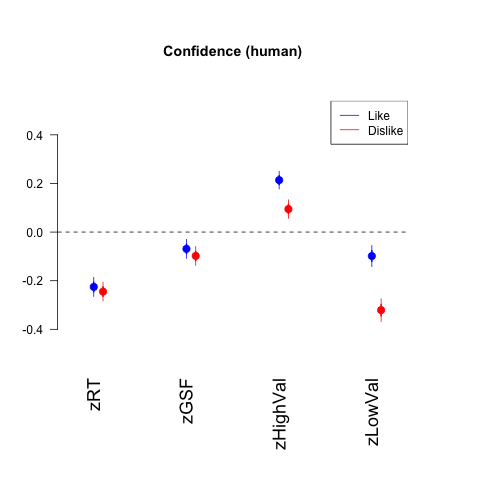

In [154]:
%%R    
title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~  zRT  + zGSF+ zHighVal + zLowVal    , data= d)
ModelDislike_1 <- glm(zConf ~ zRT  + zGSF + zHighVal + zLowVal   , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-0.5, 0.5) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  9687.888 BIC Dislike:  10160.4
Call:  glm(formula = zConf ~ zRT + zGSF + Correct + zHighVal + zLowVal, 
    data = d)

Coefficients:
(Intercept)          zRT         zGSF      Correct     zHighVal      zLowVal  
   -0.31039     -0.21536     -0.06397      0.29121      0.20916     -0.08146  

Degrees of Freedom: 3719 Total (i.e. Null);  3714 Residual
Null Deviance:	    3353 
Residual Deviance: 2900 	AIC: 9644

Call:  glm(formula = zConf ~ zRT + zGSF + Correct + zHighVal + zLowVal, 
    data = d2)

Coefficients:
(Intercept)          zRT         zGSF      Correct     zHighVal      zLowVal  
   -0.48014     -0.24172     -0.09458      0.24834      0.09307     -0.30816  

Degrees of Freedom: 3719 Total (i.e. Null);  3714 Residual
Null Deviance:	    4019 
Residual Deviance: 3293 	AIC: 10120


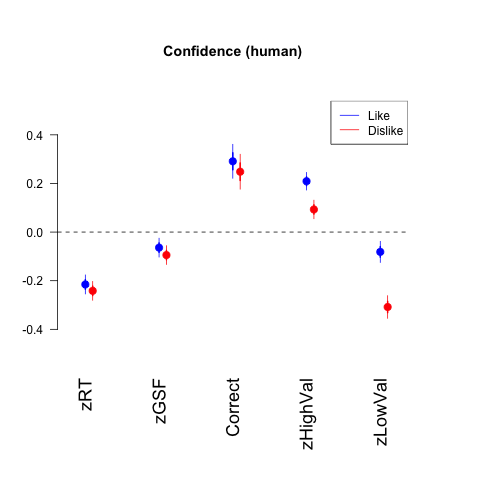

In [155]:
%%R    
title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~  zRT  + zGSF+ Correct + zHighVal + zLowVal    , data= d)
ModelDislike_1 <- glm(zConf ~  zRT  + zGSF + Correct + zHighVal + zLowVal   , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-0.5, 0.5) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

print(ModelLike_1)
print(ModelDislike_1)

 BIC Like:  9674.156 BIC Dislike:  10133.9
Call:  glm(formula = zConf ~ zRT + zGSF + Correct + zHighVal + zLowVal + 
    zHighVal:Correct + zLowVal:Correct, data = d)

Coefficients:
     (Intercept)               zRT              zGSF           Correct  
        -0.10835          -0.21194          -0.06325           0.04314  
        zHighVal           zLowVal  Correct:zHighVal   Correct:zLowVal  
         0.02790           0.15966           0.21535          -0.28774  

Degrees of Freedom: 3719 Total (i.e. Null);  3712 Residual
Null Deviance:	    3353 
Residual Deviance: 2876 	AIC: 9618

Call:  glm(formula = zConf ~ zRT + zGSF + Correct + zHighVal + zLowVal + 
    zHighVal:Correct + zLowVal:Correct, data = d2)

Coefficients:
     (Intercept)               zRT              zGSF           Correct  
       -0.252924         -0.243308         -0.091350         -0.040791  
        zHighVal           zLowVal  Correct:zHighVal   Correct:zLowVal  
       -0.070297         -0.009186          0.

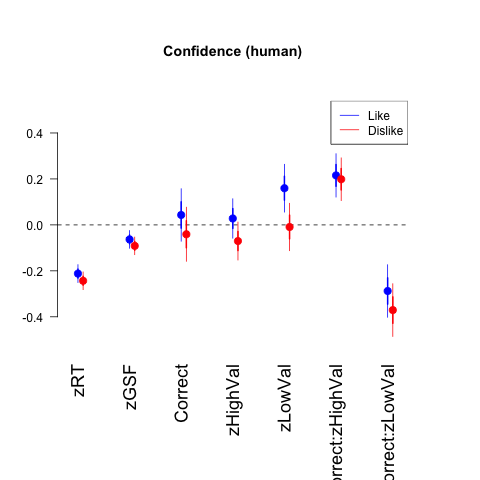

In [156]:
%%R    
title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~  zRT  + zGSF+ Correct + zHighVal + zLowVal+ zHighVal:Correct + zLowVal:Correct    , data= d)
ModelDislike_1 <- glm(zConf ~  zRT  + zGSF + Correct + zHighVal + zLowVal+ zHighVal:Correct + zLowVal:Correct   , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-0.5, 0.5) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

print(ModelLike_1)
print(ModelDislike_1)

# Effect of DV over Reaction Time

 BIC Like:  10024.68 BIC Dislike:  10599.73
Call:  glm(formula = zConf ~ zAbsDVal + zTotVal, data = d2)

Coefficients:
(Intercept)     zAbsDVal      zTotVal  
   -0.09634      0.23586     -0.19890  

Degrees of Freedom: 3719 Total (i.e. Null);  3717 Residual
Null Deviance:	    4019 
Residual Deviance: 3730 	AIC: 10570


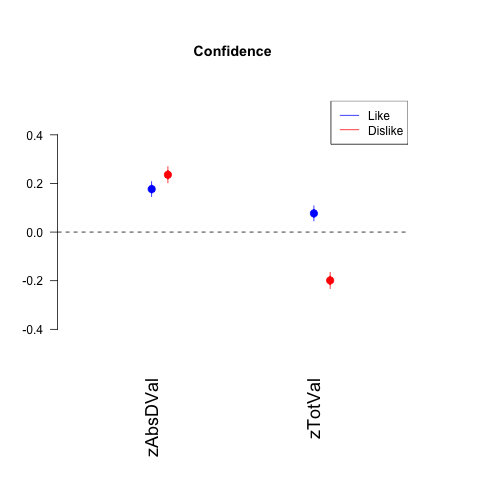

In [157]:
%%R    
title_plot = "Confidence"
ModelLike_1 <- glm(zConf ~ zAbsDVal  + zTotVal    , data= d)
ModelDislike_1 <- glm(zConf ~ zAbsDVal + zTotVal    , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-0.5, .5) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  10081.68 BIC Dislike:  10812.89
Call:  glm(formula = zRT ~ zAbsDVal + zTotVal, data = d2)

Coefficients:
(Intercept)     zAbsDVal      zTotVal  
    0.08286     -0.15528      0.13152  

Degrees of Freedom: 3719 Total (i.e. Null);  3717 Residual
Null Deviance:	    4075 
Residual Deviance: 3950 	AIC: 10790


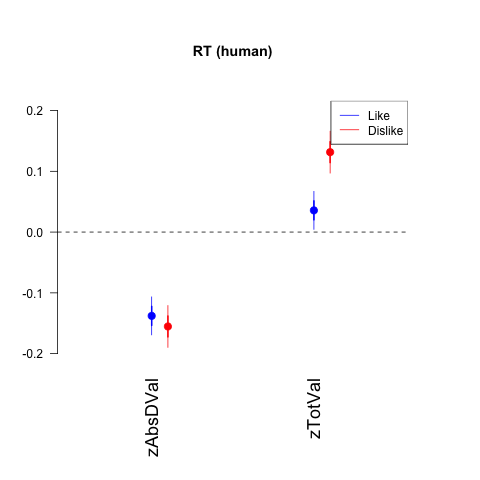

In [158]:
%%R    
title_plot = "RT (human)"
ModelLike_1 <- glm(zRT ~ zAbsDVal  + zTotVal    , data= d)
ModelDislike_1 <- glm(zRT ~ zAbsDVal + zTotVal    , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-0.2, .2) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  8405.287 BIC Dislike:  8928.009
Call:  glm(formula = zRT ~ zAbsDVal + zGSF + zTotVal, data = d2)

Coefficients:
(Intercept)     zAbsDVal         zGSF      zTotVal  
    0.04898     -0.07836      0.62824      0.06225  

Degrees of Freedom: 3719 Total (i.e. Null);  3716 Residual
Null Deviance:	    4075 
Residual Deviance: 2375 	AIC: 8897


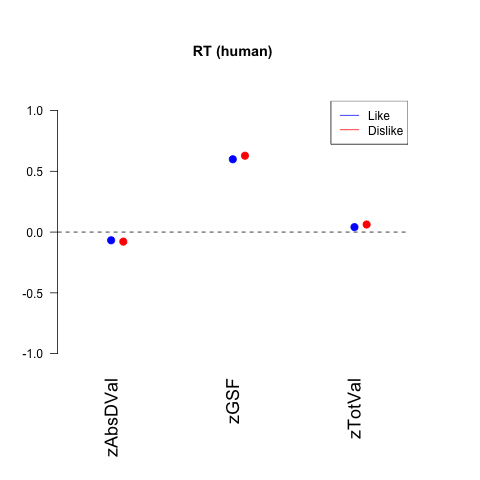

In [159]:
%%R    
title_plot = "RT (human)"
ModelLike_1 <- glm(zRT ~ zAbsDVal  + zGSF+ zTotVal    , data= d)
ModelDislike_1 <- glm(zRT ~ zAbsDVal   + zGSF + zTotVal    , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-1, 1) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  8284.038 BIC Dislike:  8780.707
Call:  glm(formula = zRT ~ zAbsDVal + zConf + zGSF + zTotVal, data = d2)

Coefficients:
(Intercept)     zAbsDVal        zConf         zGSF      zTotVal  
    0.03514     -0.04408     -0.16723      0.58610      0.03363  

Degrees of Freedom: 3719 Total (i.e. Null);  3715 Residual
Null Deviance:	    4075 
Residual Deviance: 2277 	AIC: 8743


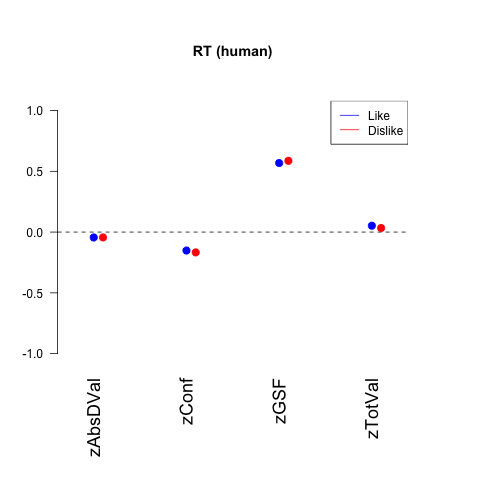

In [160]:
%%R    
title_plot = "RT (human)"
ModelLike_1 <- glm(zRT ~ zAbsDVal  +zConf+ zGSF+ zTotVal    , data= d)
ModelDislike_1 <- glm(zRT ~ zAbsDVal +zConf  + zGSF + zTotVal    , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-1, 1) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  9809.516 BIC Dislike:  10428.83
Call:  glm(formula = zRT ~ zConf + zHighVal + zLowVal, data = d2)

Coefficients:
(Intercept)        zConf     zHighVal      zLowVal  
    0.15133     -0.32503     -0.04128      0.13840  

Degrees of Freedom: 3719 Total (i.e. Null);  3716 Residual
Null Deviance:	    4075 
Residual Deviance: 3555 	AIC: 10400


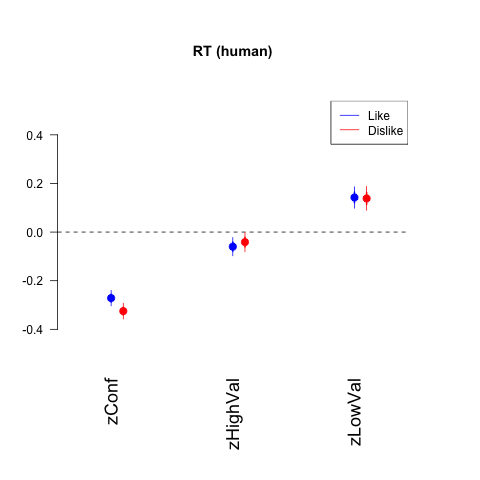

In [161]:
%%R    
title_plot = "RT (human)"
ModelLike_1 <- glm(zRT ~ zConf+  zHighVal + zLowVal    , data= d)
ModelDislike_1 <- glm(zRT ~ zConf + zHighVal + zLowVal   , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-0.5, 0.5) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

 BIC Like:  10081.7 BIC Dislike:  10811.75
Call:  glm(formula = zRT ~ zHighVal + zLowVal, data = d2)

Coefficients:
(Intercept)     zHighVal      zLowVal  
    0.27810     -0.08029      0.27130  

Degrees of Freedom: 3719 Total (i.e. Null);  3717 Residual
Null Deviance:	    4075 
Residual Deviance: 3949 	AIC: 10790


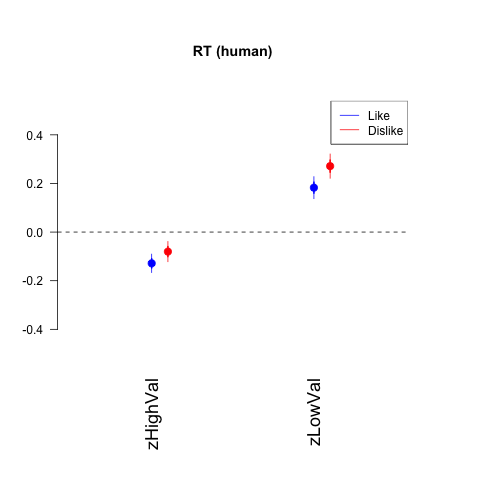

In [162]:
%%R    
title_plot = "RT (human)"
ModelLike_1 <- glm(zRT ~  zHighVal + zLowVal    , data= d)
ModelDislike_1 <- glm(zRT ~ zHighVal + zLowVal   , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-0.5, 0.5) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

ModelLike_1
ModelDislike_1

## Effect of correct on RT

 BIC Like:  10059.47 BIC Dislike:  10818.7
Call:  glm(formula = zRT ~ zAbsDVal + Correct + zTotVal + Correct:zTotVal, 
    data = d)

Coefficients:
    (Intercept)         zAbsDVal          Correct          zTotVal  
       0.092919        -0.128593        -0.227450         0.006407  
Correct:zTotVal  
       0.028656  

Degrees of Freedom: 3719 Total (i.e. Null);  3715 Residual
Null Deviance:	    3314 
Residual Deviance: 3212 	AIC: 10020

Call:  glm(formula = zRT ~ zAbsDVal + Correct + zTotVal + Correct:zTotVal, 
    data = d2)

Coefficients:
    (Intercept)         zAbsDVal          Correct          zTotVal  
        0.17036         -0.15180         -0.11828          0.15699  
Correct:zTotVal  
       -0.03937  

Degrees of Freedom: 3719 Total (i.e. Null);  3715 Residual
Null Deviance:	    4075 
Residual Deviance: 3939 	AIC: 10780


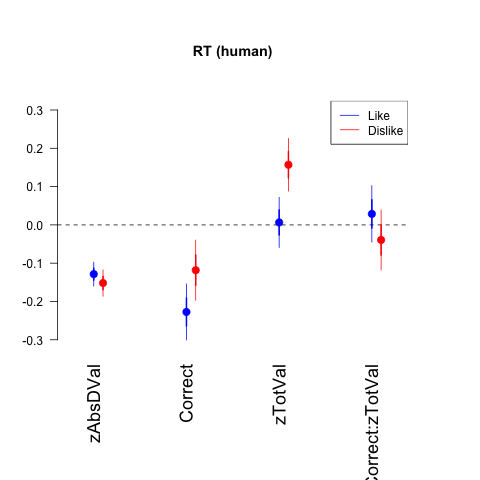

In [163]:
%%R    
title_plot = "RT (human)"
ModelLike_1 <- glm(zRT ~ zAbsDVal  +Correct+  zTotVal + Correct:zTotVal   , data= d)
ModelDislike_1 <- glm(zRT ~ zAbsDVal +Correct + zTotVal + Correct:zTotVal    , data= d2)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-.3, .3) ,main=title_plot)
coefplot(ModelDislike_1,intercept=FALSE,vertical = FALSE, add=TRUE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,1),main=title_plot)


legend("topright",  legend=c( "Like","Dislike"),col=c("blue","red"), , lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)
BIC1Dislike_1 = BIC(ModelDislike_1)

cat(" BIC Like: " , BIC1Like_1)
cat(" BIC Dislike: " , BIC1Dislike_1)

print(ModelLike_1)
print(ModelDislike_1)

## Do we observe Total Value effect over confidence only when there is a difference in gaze? (considering only LIKE frame)

In [164]:
data_GazeVal =  pd.DataFrame()
data_GazeVal["RGaze"] = data.gaze_1 
data_GazeVal["LGaze"] = data.gaze_0 
data_GazeVal["DGaze"] = data.gaze_1 - data.gaze_0
data_GazeVal["AbsDGaze"] = abs(data.gaze_1 - data.gaze_0)
data_GazeVal["zRValue"] = data_all.zRVal.values
data_GazeVal["zLValue"] = data_all.zLVal.values
data_GazeVal["zTotValue"] = data_all.zTotVal.values
data_GazeVal["zDValue"] = data_all.zDVal.values
data_GazeVal["zAbsDValue"] = data_all.zAbsDVal.values
data_GazeVal["DValue"] = data_all.DVal.values
data_GazeVal["zConf"] = data_all.zConf.values
data_GazeVal["zRT"] = data_all.zRT.values

In [165]:
len(data_GazeVal["zDValue"].values)

3720

# Add bin column for Value

In [166]:
# data_GazeVal["zDVal_bin"] = pd.qcut(data_GazeVal["zDValue"].values, 10, labels=[0, 1, 2,3,4,5,6,7,8,9])
data_GazeVal["zDVal_bin"] = pd.to_numeric(pd.qcut(data_GazeVal["zDValue"].values, 3, labels=[0, 1, 2]))
data_GazeVal["zAbsDVal_bin"] = pd.to_numeric(pd.qcut(data_GazeVal["zAbsDValue"].values, 3, labels=[0, 1, 2]))

data_GazeVal["zHighVal"] = data_GazeVal[["zRValue", "zLValue"]].max(axis=1)

# Add bin column for Gaze

In [167]:
# data_GazeVal["zDVal_bin"] = pd.qcut(data_GazeVal["zDValue"].values, 10, labels=[0, 1, 2,3,4,5,6,7,8,9])
data_GazeVal["zDGaze_bin"] = pd.to_numeric(pd.qcut(data_GazeVal["DGaze"].values, 5, labels=[0, 1, 2,3,4]))
data_GazeVal["zAbsDGaze_bin"] =pd.to_numeric( pd.qcut(data_GazeVal["AbsDGaze"].values, 5, labels=[0, 1, 2,3,4]))

data_GazeVal["zHighGaze"] = data_GazeVal[["RGaze", "LGaze"]].max(axis=1)

In [168]:
data_GazeVal.head()

,RGaze,LGaze,DGaze,AbsDGaze,zRValue,zLValue,zTotValue,zDValue,zAbsDValue,DValue,zConf,zRT,zDVal_bin,zAbsDVal_bin,zHighVal,zDGaze_bin,zAbsDGaze_bin,zHighGaze
0,0.431604,0.568396,-0.136792,0.136792,-1.237881,-0.898735,-1.497033,-0.242061,-0.988498,-0.15,0.582155,-0.731582,1,0,-0.898735,1,1,0.568396
1,0.237668,0.762332,-0.524664,0.524664,0.457846,1.136137,1.116834,-0.484123,-0.570823,-0.30,0.432565,0.125810,0,1,1.136137,0,4,0.762332
2,0.553191,0.446809,0.106383,0.106383,1.814428,-0.898735,0.641585,1.936492,1.935228,1.20,0.731746,-0.926101,2,2,1.814428,3,1,0.553191
3,0.467648,0.532352,-0.064704,0.064704,-0.220445,-0.559590,-0.546536,0.242061,-0.988498,0.15,-2.260059,2.703653,1,0,-0.220445,2,0,0.532352
4,0.470264,0.529736,-0.059473,0.059473,1.814428,1.136137,2.067331,0.484123,-0.570823,0.30,-0.165796,-0.807123,2,1,1.814428,2,0,0.529736


In [169]:
%%R -i data_GazeVal 
d <- data_GazeVal

 BIC Like:  2009.168
Call:  glm(formula = zConf ~ zAbsDValue + zTotValue + zRT, data = d1)

Coefficients:
(Intercept)   zAbsDValue    zTotValue          zRT  
    0.07338      0.10106      0.08575     -0.38917  

Degrees of Freedom: 743 Total (i.e. Null);  740 Residual
Null Deviance:	    728.3 
Residual Deviance: 620.3 	AIC: 1986
 BIC Like:  1902.542
Call:  glm(formula = zConf ~ zAbsDValue + zTotValue + zRT, data = d1)

Coefficients:
(Intercept)   zAbsDValue    zTotValue          zRT  
    0.12222      0.08833      0.05929     -0.29134  

Degrees of Freedom: 743 Total (i.e. Null);  740 Residual
Null Deviance:	    597.3 
Residual Deviance: 537.5 	AIC: 1879
 BIC Like:  2003.94
Call:  glm(formula = zConf ~ zAbsDValue + zTotValue + zRT, data = d1)

Coefficients:
(Intercept)   zAbsDValue    zTotValue          zRT  
    0.06433      0.09818      0.07028     -0.40675  

Degrees of Freedom: 743 Total (i.e. Null);  740 Residual
Null Deviance:	    726 
Residual Deviance: 616 	AIC: 1981
 BIC Like

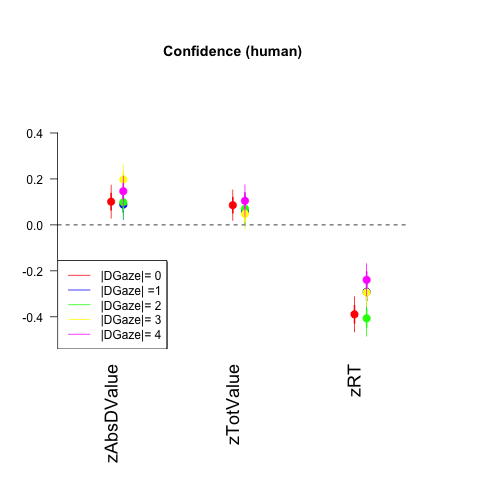

In [170]:
%%R


d1 <- d[which(d$zAbsDGaze_bin== 0), ]
title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~ zAbsDValue  + zTotValue +zRT  , data= d1)
coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-.5, .5),main=title_plot)

#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)

## Add for the rest
x <- c(1,2,3,4)
colors <- c('blue','green','yellow','magenta')

for (i in x){
# Separating the data for both conditions 
d1 <- d[which(d$zDGaze_bin== i), ]

title_plot = "Confidence (human)"
ModelLike_1 <- glm(zConf ~ zAbsDValue  + zTotValue +zRT , data= d1)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE, add=TRUE ,col.pts=colors[i], cex.var=1.5, cex.pts=2, mar = c(8,4,7,5),main=title_plot)

legend("bottomleft",  legend=c("|DGaze|= 0", "|DGaze| =1","|DGaze|= 2",'|DGaze|= 3','|DGaze|= 4'),col=c("red", "blue",'green','yellow', 'magenta'), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)
}

-----------------------

# Balance of evidence effect depending on gaze difference for simulations??

## Like simulations - gaze bias

In [171]:
sufix = 'individual_Like_NoBin_Gamma-11_NUTS_31' # Like sufix
#sufix = 'individual_Dislike_Inv_NoBin_Gamma-11_NUTS_31' # Dislike sufix

data_simulation = pd.read_csv(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv'))


In [172]:
data_simulation.head()

,Unnamed: 0,Part,LVal,RVal,LGaze,RGaze,AbsDVal,TotVal,AbsDEv,RTsim,Correct_sim,Choice_sim,Conf_human,zConf_human,zLVal,zRVal,zAbsDVal,zTotVal,zAbsDEv,zRTsim
0,0,0,1.10,0.95,0.568396,0.431604,0.15,2.05,0.325125,7290.0,0,1.0,80,0.582155,-0.898735,-1.237881,-0.988498,-1.497033,-1.334244,4.369550
1,1,0,2.00,1.70,0.762332,0.237668,0.30,3.70,1.241681,2797.0,1,0.0,78,0.432565,1.136137,0.457846,-0.570823,1.116834,1.086036,0.132824
2,2,0,1.10,2.30,0.446809,0.553191,1.20,3.40,1.135265,3257.0,1,1.0,82,0.731746,-0.898735,1.814428,1.935228,0.641585,0.805032,0.566586
3,3,0,1.25,1.40,0.532352,0.467648,0.15,2.65,0.624405,2362.0,0,0.0,42,-2.260059,-0.559590,-0.220445,-0.988498,-0.546536,-0.543959,-0.277364
4,4,0,2.00,2.30,0.529736,0.470264,0.30,4.30,0.822202,4187.0,1,1.0,70,-0.165796,1.136137,1.814428,-0.570823,2.067331,-0.021650,1.443541


In [173]:
data_GazeVal =  pd.DataFrame()
data_GazeVal["DGaze"] = data_simulation.RGaze - data_simulation.LGaze
data_GazeVal["AbsDGaze"] = abs(data_simulation.RGaze - data_simulation.LGaze)
data_GazeVal["zRValue"] = data_simulation.zRVal.values
data_GazeVal["zLValue"] = data_simulation.zLVal.values
data_GazeVal["zTotValue"] = data_simulation.zTotVal.values
#data_GazeVal["zDValue"] = data_all.zDVal.values
data_GazeVal["zAbsDValue"] = data_simulation.zAbsDVal.values
#data_GazeVal["DValue"] = data_simulation.DVal.values
data_GazeVal["zConf_human"] = data_simulation.zConf_human.values
data_GazeVal["zAbsDEv"] = data_simulation.zAbsDEv.values
data_GazeVal["zRTsim"] = data_simulation.zRTsim.values
data_GazeVal["Choice_sim"] = data_simulation.Choice_sim.values
data_GazeVal["zChoVal"] = data_GazeVal['zRValue']*data_GazeVal['Choice_sim']+ data_GazeVal['zLValue']*(1-data_GazeVal['Choice_sim'])
data_GazeVal["zUnchVal"] = data_GazeVal['zLValue']*data_GazeVal['Choice_sim']+ data_GazeVal['zRValue']*(1-data_GazeVal['Choice_sim'])


In [174]:
# data_GazeVal["zDVal_bin"] = pd.qcut(data_GazeVal["zDValue"].values, 10, labels=[0, 1, 2,3,4,5,6,7,8,9])
data_GazeVal["zDGaze_bin"] = pd.to_numeric(pd.qcut(data_GazeVal["DGaze"].values, 5, labels=[0, 1, 2,3,4]))
data_GazeVal["zAbsDGaze_bin"] =pd.to_numeric( pd.qcut(data_GazeVal["AbsDGaze"].values, 5, labels=[0, 1, 2,3,4]))


In [175]:
%%R -i data_GazeVal 
d <- data_GazeVal

 BIC Like:  20028.96
Call:  glm(formula = zAbsDEv ~ zAbsDValue + zTotValue + zRTsim, data = d1)

Coefficients:
(Intercept)   zAbsDValue    zTotValue       zRTsim  
  -0.161871     0.218897     0.003398    -0.189585  

Degrees of Freedom: 7439 Total (i.e. Null);  7436 Residual
Null Deviance:	    7100 
Residual Deviance: 6392 	AIC: 19990
 BIC Like:  19917.96
Call:  glm(formula = zAbsDEv ~ zAbsDValue + zTotValue + zRTsim, data = d1)

Coefficients:
(Intercept)   zAbsDValue    zTotValue       zRTsim  
   -0.04424      0.17237      0.06490     -0.22054  

Degrees of Freedom: 7439 Total (i.e. Null);  7436 Residual
Null Deviance:	    7042 
Residual Deviance: 6297 	AIC: 19880
 BIC Like:  20075.88
Call:  glm(formula = zAbsDEv ~ zAbsDValue + zTotValue + zRTsim, data = d1)

Coefficients:
(Intercept)   zAbsDValue    zTotValue       zRTsim  
  -0.151149     0.215186     0.008586    -0.189284  

Degrees of Freedom: 7439 Total (i.e. Null);  7436 Residual
Null Deviance:	    7134 
Residual Deviance: 643

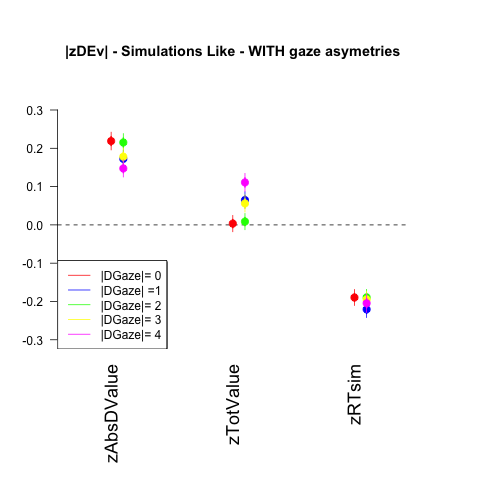

In [176]:
%%R

d1 <- d[which(d$zAbsDGaze_bin== 0), ]
title_plot = "|zDEv| - Simulations Like - WITH gaze asymetries"
ModelLike_1 <- glm(zAbsDEv ~ zAbsDValue  + zTotValue  + zRTsim, data= d1)
coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-.3, .3),main=title_plot)

#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)

## Add for the rest
x <- c(1,2,3,4)
colors <- c('blue','green','yellow','magenta')

for (i in x){
# Separating the data for both conditions 
d1 <- d[which(d$zDGaze_bin== i), ]

title_plot = "Confidence (human)"
ModelLike_1 <- glm(zAbsDEv ~ zAbsDValue  + zTotValue  + zRTsim, data= d1)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE, add=TRUE ,col.pts=colors[i], cex.var=1.5, cex.pts=2, mar = c(8,4,7,5),main=title_plot)

legend("bottomleft",  legend=c("|DGaze|= 0", "|DGaze| =1","|DGaze|= 2",'|DGaze|= 3','|DGaze|= 4'),col=c("red", "blue",'green','yellow', 'magenta'), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)
}

[1] "Like BIC:"
[1] 102710.8
              Estimate  Std. Error   t value      Pr(>|t|)
(Intercept) -0.1248333 0.005595946 -22.30781 1.626234e-109
zChoVal      0.2681081 0.005115405  52.41189  0.000000e+00
zUnchVal    -0.1198955 0.005497112 -21.81063 8.362921e-105


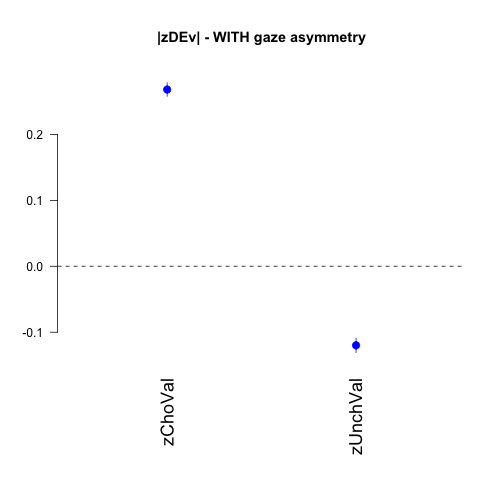

In [177]:
%%R
#title
title_plot = ("|zDEv| - WITH gaze asymmetry")

Model <- glm(zAbsDEv ~  zChoVal + zUnchVal , data=d)

BIC1 = BIC(Model)
print("Like BIC:")
print(BIC1)

coefplot(Model, intercept=FALSE, vertical = FALSE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
summary(Model)$coefficients


 BIC Like:  20100.53
Call:  glm(formula = zAbsDEv ~ zChoVal + zUnchVal, data = d1)

Coefficients:
(Intercept)      zChoVal     zUnchVal  
    -0.3506       0.2562      -0.2277  

Degrees of Freedom: 7439 Total (i.e. Null);  7437 Residual
Null Deviance:	    7100 
Residual Deviance: 6462 	AIC: 20070
 BIC Like:  20130.25
Call:  glm(formula = zAbsDEv ~ zChoVal + zUnchVal, data = d1)

Coefficients:
(Intercept)      zChoVal     zUnchVal  
    -0.1785       0.2646      -0.1324  

Degrees of Freedom: 7439 Total (i.e. Null);  7437 Residual
Null Deviance:	    7042 
Residual Deviance: 6488 	AIC: 20100
 BIC Like:  20174.23
Call:  glm(formula = zAbsDEv ~ zChoVal + zUnchVal, data = d1)

Coefficients:
(Intercept)      zChoVal     zUnchVal  
    -0.3347       0.2506      -0.2200  

Degrees of Freedom: 7439 Total (i.e. Null);  7437 Residual
Null Deviance:	    7134 
Residual Deviance: 6526 	AIC: 20150
 BIC Like:  19899.66
Call:  glm(formula = zAbsDEv ~ zChoVal + zUnchVal, data = d1)

Coefficients:
(Inte

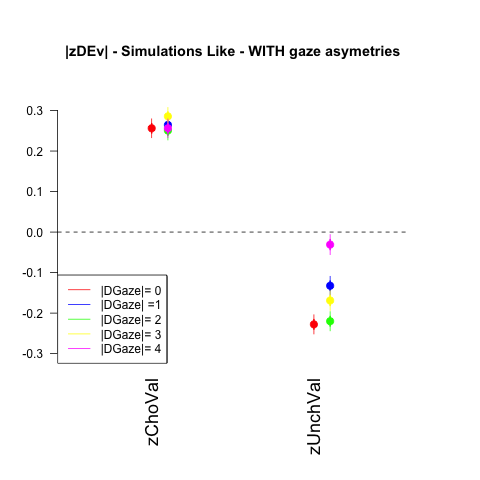

In [178]:
%%R

d1 <- d[which(d$zAbsDGaze_bin== 0), ]
title_plot = "|zDEv| - Simulations Like - WITH gaze asymetries"
ModelLike_1 <- glm(zAbsDEv ~  zChoVal + zUnchVal, data= d1)
coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-.3, .3),main=title_plot)

#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)

## Add for the rest
x <- c(1,2,3,4)
colors <- c('blue','green','yellow','magenta')

for (i in x){
# Separating the data for both conditions 
d1 <- d[which(d$zDGaze_bin== i), ]

title_plot = "Confidence (human)"
ModelLike_1 <- glm(zAbsDEv ~  zChoVal + zUnchVal, data= d1)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE, add=TRUE ,col.pts=colors[i], cex.var=1.5, cex.pts=2, mar = c(8,4,7,5),main=title_plot)

legend("bottomleft",  legend=c("|DGaze|= 0", "|DGaze| =1","|DGaze|= 2",'|DGaze|= 3','|DGaze|= 4'),col=c("red", "blue",'green','yellow', 'magenta'), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)
}

## Like simulations - NO gaze bias

In [179]:
sufix = 'individual_Like_NoBin_Gamma-11_NUTS_31'
data_simulation = pd.read_csv(str('results/simulations_evidence/DEvidence_simulations_NoGaze_'+sufix+'.csv'))

In [180]:
data_GazeVal =  pd.DataFrame()
data_GazeVal["DGaze"] = data_simulation.RGaze - data_simulation.LGaze
data_GazeVal["AbsDGaze"] = abs(data_simulation.RGaze - data_simulation.LGaze)
data_GazeVal["zRValue"] = data_simulation.zRVal.values
data_GazeVal["zLValue"] = data_simulation.zLVal.values
data_GazeVal["zTotValue"] = data_simulation.zTotVal.values
#data_GazeVal["zDValue"] = data_all.zDVal.values
data_GazeVal["zAbsDValue"] = data_simulation.zAbsDVal.values
#data_GazeVal["DValue"] = data_simulation.DVal.values
data_GazeVal["zConf_human"] = data_simulation.zConf_human.values
data_GazeVal["zAbsDEv"] = data_simulation.zAbsDEv.values
data_GazeVal["zRTsim"] = data_simulation.zRTsim.values
data_GazeVal["Choice_sim"] = data_simulation.Choice_sim.values
data_GazeVal["zChoVal"] = data_GazeVal['zRValue']*data_GazeVal['Choice_sim']+ data_GazeVal['zLValue']*(1-data_GazeVal['Choice_sim'])
data_GazeVal["zUnchVal"] = data_GazeVal['zLValue']*data_GazeVal['Choice_sim']+ data_GazeVal['zRValue']*(1-data_GazeVal['Choice_sim'])


 no gaze asymmetry in this dataset

In [181]:
data_GazeVal.AbsDGaze.unique()

array([0.])

In [182]:
data_GazeVal.head()

,DGaze,AbsDGaze,zRValue,zLValue,zTotValue,zAbsDValue,zConf_human,zAbsDEv,zRTsim,Choice_sim,zChoVal,zUnchVal
0,0.0,0.0,-1.237881,-0.898735,-1.497033,-0.988498,0.582155,2.134170,0.787661,1.0,-1.237881,-0.898735
1,0.0,0.0,0.457846,1.136137,1.116834,-0.570823,0.432565,-0.284400,0.703666,0.0,1.136137,0.457846
2,0.0,0.0,1.814428,-0.898735,0.641585,1.935228,0.731746,1.658287,0.021524,1.0,1.814428,-0.898735
3,0.0,0.0,-0.220445,-0.559590,-0.546536,-0.988498,-2.260059,-0.456444,1.216121,0.0,-0.559590,-0.220445
4,0.0,0.0,1.814428,1.136137,2.067331,-0.570823,-0.165796,-0.332247,0.293023,1.0,1.814428,1.136137


In [183]:
%%R -i data_GazeVal 
d <- data_GazeVal

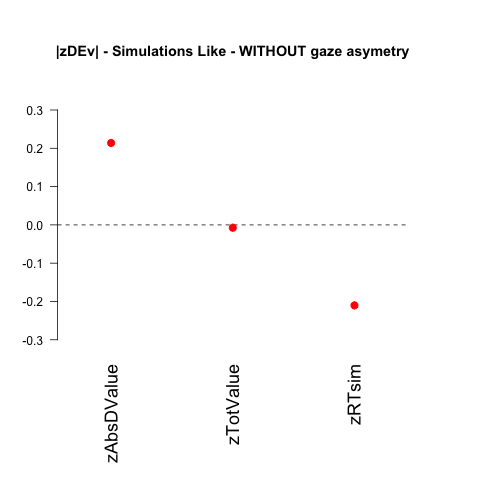

In [184]:
%%R

title_plot = "|zDEv| - Simulations Like - WITHOUT gaze asymetry"
ModelLike_1 <- glm(zAbsDEv ~ zAbsDValue  + zTotValue  + zRTsim, data= d)
coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-.3, .3),main=title_plot)

#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

[1] "Like BIC:"
[1] 102611.4
              Estimate  Std. Error   t value      Pr(>|t|)
(Intercept) -0.1482500 0.005653149 -26.22433 3.272046e-150
zChoVal      0.2245076 0.005038937  44.55456  0.000000e+00
zUnchVal    -0.2186940 0.005654673 -38.67492 7.677780e-321


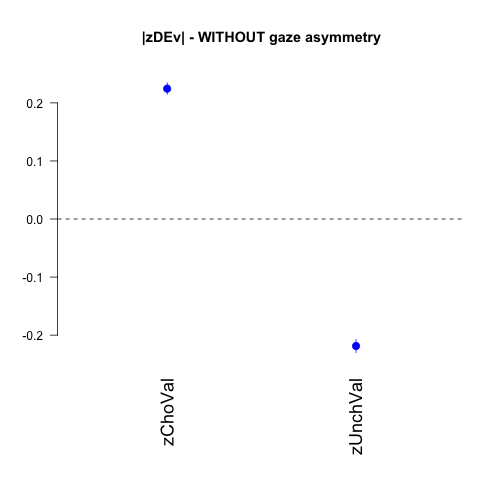

In [185]:
%%R
#title
title_plot = ("|zDEv| - WITHOUT gaze asymmetry")

Model <- glm(zAbsDEv ~  zChoVal + zUnchVal , data=d)

BIC1 = BIC(Model)
print("Like BIC:")
print(BIC1)

coefplot(Model, intercept=FALSE, vertical = FALSE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
summary(Model)$coefficients


## Dislike simulations - gaze bias

In [248]:
#sufix = 'individual_Like_NoBin_Gamma-11_NUTS_31' # Like sufix
sufix = 'individual_Dislike_Inv_NoBin_Gamma-11_NUTS_31' # Dislike sufix

data_simulation = pd.read_csv(str('results/simulations_evidence/DEvidence_simulations_'+sufix+'.csv'))

In [249]:
data_simulation.head()

,Unnamed: 0,Part,LVal,RVal,LGaze,RGaze,AbsDVal,TotVal,AbsDEv,RTsim,Correct_sim,Choice_sim,Conf_human,zConf_human,zLVal,zRVal,zAbsDVal,zTotVal,zAbsDEv,zRTsim
0,0,0,2.05,1.00,0.745415,0.254585,1.05,3.05,0.882675,5775.0,1,0.0,72,-0.016206,1.237881,-1.136137,1.517553,0.071287,0.323846,1.962973
1,1,0,0.70,1.30,0.410720,0.589280,0.60,2.00,1.116604,3469.0,1,1.0,68,-0.315386,-1.814428,-0.457846,0.264528,-1.592082,0.966795,0.109490
2,2,0,1.30,1.75,0.330549,0.669451,0.45,3.05,0.932064,3864.0,1,1.0,68,-0.315386,-0.457846,0.559590,-0.153148,0.071287,0.459590,0.426977
3,3,0,1.45,0.70,0.592345,0.407655,0.75,2.15,1.306198,1891.0,1,0.0,68,-0.315386,-0.118701,-1.814428,0.682203,-1.354458,1.487889,-1.158853
4,4,0,1.00,1.00,0.641717,0.358283,0.00,2.00,0.568219,5356.0,0,1.0,88,1.180516,-1.136137,-1.136137,-1.406173,-1.592082,-0.540429,1.626196


## Replace inv values to original in dislike frame

In [250]:
data_GazeVal =  pd.DataFrame()
data_GazeVal["DGaze"] = data_simulation.RGaze - data_simulation.LGaze
data_GazeVal["AbsDGaze"] = abs(data_simulation.RGaze - data_simulation.LGaze)

data_GazeVal["Part"] = data_simulation.Part

data_GazeVal["LValue"] = 3- data_simulation.LVal
data_GazeVal["RValue"] = 3 - data_simulation.RVal
data_GazeVal["TotValue"] = data_GazeVal.RValue + data_GazeVal.LValue
data_GazeVal['zLValue'] = z_score1(data_GazeVal, 'Part','LValue')
data_GazeVal['zRValue'] = z_score1(data_GazeVal, 'Part','RValue')
data_GazeVal['zTotValue'] = z_score1(data_GazeVal, 'Part','TotValue')

#data_GazeVal["zRValue"] = data_simulation.zRVal.values
#data_GazeVal["zLValue"] = data_simulation.zLVal.values
#data_GazeVal["zTotValue"] = data_simulation.zTotVal.values
#data_GazeVal["zDValue"] = data_all.zDVal.values
data_GazeVal["zAbsDValue"] = data_simulation.zAbsDVal.values
#data_GazeVal["DValue"] = data_simulation.DVal.values
data_GazeVal["zConf_human"] = data_simulation.zConf_human.values
data_GazeVal["zAbsDEv"] = data_simulation.zAbsDEv.values
data_GazeVal["zRTsim"] = data_simulation.zRTsim.values
data_GazeVal["Choice_sim"] = data_simulation.Choice_sim.values


data_GazeVal["zChoVal"] = data_GazeVal['zRValue']*data_GazeVal['Choice_sim']+ data_GazeVal['zLValue']*(1-data_GazeVal['Choice_sim'])
data_GazeVal["zUnchVal"] = data_GazeVal['zLValue']*data_GazeVal['Choice_sim']+ data_GazeVal['zRValue']*(1-data_GazeVal['Choice_sim'])


In [251]:
# data_GazeVal["zDVal_bin"] = pd.qcut(data_GazeVal["zDValue"].values, 10, labels=[0, 1, 2,3,4,5,6,7,8,9])
data_GazeVal["zDGaze_bin"] = pd.to_numeric(pd.qcut(data_GazeVal["DGaze"].values, 5, labels=[0, 1, 2,3,4]))
data_GazeVal["zAbsDGaze_bin"] =pd.to_numeric( pd.qcut(data_GazeVal["AbsDGaze"].values, 5, labels=[0, 1, 2,3,4]))


In [252]:
%%R -i data_GazeVal 
d <- data_GazeVal

 BIC Like:  20138.84
Call:  glm(formula = zAbsDEv ~ zAbsDValue + zTotValue + zRTsim, data = d1)

Coefficients:
(Intercept)   zAbsDValue    zTotValue       zRTsim  
  -0.222141     0.164327     0.002802    -0.172740  

Degrees of Freedom: 7439 Total (i.e. Null);  7436 Residual
Null Deviance:	    7014 
Residual Deviance: 6487 	AIC: 20100
 BIC Like:  20293.61
Call:  glm(formula = zAbsDEv ~ zAbsDValue + zTotValue + zRTsim, data = d1)

Coefficients:
(Intercept)   zAbsDValue    zTotValue       zRTsim  
   -0.06810      0.14658     -0.03477     -0.16977  

Degrees of Freedom: 7439 Total (i.e. Null);  7436 Residual
Null Deviance:	    7048 
Residual Deviance: 6624 	AIC: 20260
 BIC Like:  20122.03
Call:  glm(formula = zAbsDEv ~ zAbsDValue + zTotValue + zRTsim, data = d1)

Coefficients:
(Intercept)   zAbsDValue    zTotValue       zRTsim  
  -0.221707     0.163145     0.008287    -0.168689  

Degrees of Freedom: 7439 Total (i.e. Null);  7436 Residual
Null Deviance:	    6987 
Residual Deviance: 647

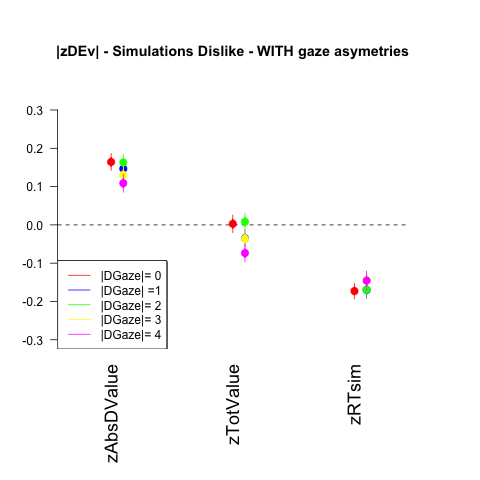

In [253]:
%%R

d1 <- d[which(d$zAbsDGaze_bin== 0), ]
title_plot = "|zDEv| - Simulations Dislike - WITH gaze asymetries"
ModelLike_1 <- glm(zAbsDEv ~ zAbsDValue  + zTotValue  + zRTsim, data= d1)
coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-.3, .3),main=title_plot)

#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)

## Add for the rest
x <- c(1,2,3,4)
colors <- c('blue','green','yellow','magenta')

for (i in x){
# Separating the data for both conditions 
d1 <- d[which(d$zDGaze_bin== i), ]

title_plot = "Confidence (human)"
ModelLike_1 <- glm(zAbsDEv ~ zAbsDValue  + zTotValue  + zRTsim, data= d1)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE, add=TRUE ,col.pts=colors[i], cex.var=1.5, cex.pts=2, mar = c(8,4,7,5),main=title_plot)

legend("bottomleft",  legend=c("|DGaze|= 0", "|DGaze| =1","|DGaze|= 2",'|DGaze|= 3','|DGaze|= 4'),col=c("red", "blue",'green','yellow', 'magenta'), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)
}

[1] "Like BIC:"
[1] 104186.4
               Estimate  Std. Error   t value      Pr(>|t|)
(Intercept) -0.09031974 0.005626272 -16.05321  8.493714e-58
zChoVal     -0.18259968 0.005575647 -32.74951 6.166207e-232
zUnchVal     0.11534572 0.005166018  22.32778 1.046539e-109


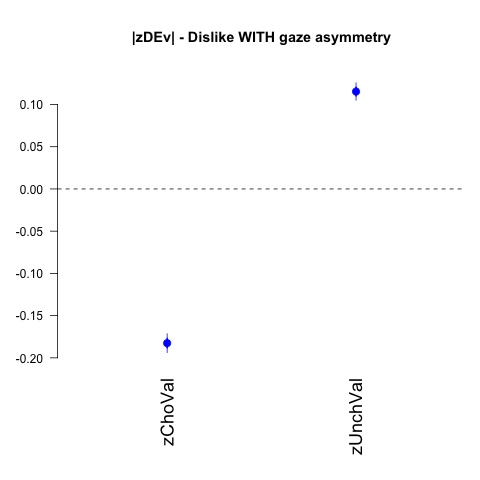

In [254]:
%%R
#title
title_plot = ("|zDEv| - Dislike WITH gaze asymmetry")

Model <- glm(zAbsDEv ~  zChoVal + zUnchVal , data=d)

BIC1 = BIC(Model)
print("Like BIC:")
print(BIC1)

coefplot(Model, intercept=FALSE, vertical = FALSE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main=title_plot)
#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
summary(Model)$coefficients


 BIC Like:  20128.74
Call:  glm(formula = zAbsDEv ~ zChoVal + zUnchVal, data = d1)

Coefficients:
(Intercept)      zChoVal     zUnchVal  
    -0.3897      -0.2016       0.2149  

Degrees of Freedom: 7439 Total (i.e. Null);  7437 Residual
Null Deviance:	    7014 
Residual Deviance: 6486 	AIC: 20100
 BIC Like:  20415.58
Call:  glm(formula = zAbsDEv ~ zChoVal + zUnchVal, data = d1)

Coefficients:
(Intercept)      zChoVal     zUnchVal  
    -0.1821      -0.1799       0.1423  

Degrees of Freedom: 7439 Total (i.e. Null);  7437 Residual
Null Deviance:	    7048 
Residual Deviance: 6741 	AIC: 20390
 BIC Like:  20124.69
Call:  glm(formula = zAbsDEv ~ zChoVal + zUnchVal, data = d1)

Coefficients:
(Intercept)      zChoVal     zUnchVal  
    -0.3838      -0.1940       0.2124  

Degrees of Freedom: 7439 Total (i.e. Null);  7437 Residual
Null Deviance:	    6987 
Residual Deviance: 6483 	AIC: 20100
 BIC Like:  20693.04
Call:  glm(formula = zAbsDEv ~ zChoVal + zUnchVal, data = d1)

Coefficients:
(Inte

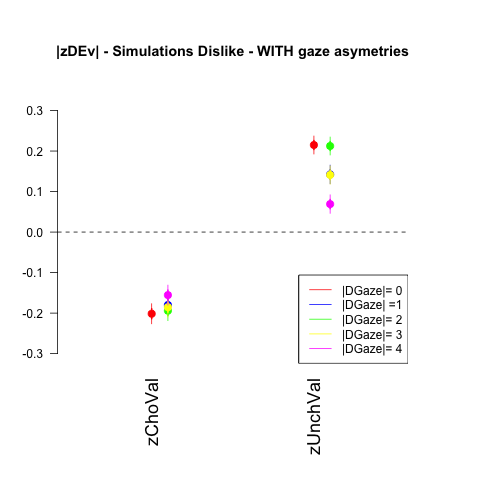

In [255]:
%%R

d1 <- d[which(d$zAbsDGaze_bin== 0), ]
title_plot = "|zDEv| - Simulations Dislike - WITH gaze asymetries"
ModelLike_1 <- glm(zAbsDEv ~  zChoVal + zUnchVal, data= d1)
coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,7,5), ylim=c(-.3, .3),main=title_plot)

#legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)

## Add for the rest
x <- c(1,2,3,4)
colors <- c('blue','green','yellow','magenta')

for (i in x){
# Separating the data for both conditions 
d1 <- d[which(d$zDGaze_bin== i), ]

title_plot = "Confidence (human)"
ModelLike_1 <- glm(zAbsDEv ~  zChoVal + zUnchVal, data= d1)

coefplot(ModelLike_1,intercept=FALSE,vertical = FALSE, add=TRUE ,col.pts=colors[i], cex.var=1.5, cex.pts=2, mar = c(8,4,7,5),main=title_plot)

legend("bottomright",  legend=c("|DGaze|= 0", "|DGaze| =1","|DGaze|= 2",'|DGaze|= 3','|DGaze|= 4'),col=c("red", "blue",'green','yellow', 'magenta'), lty=1:1, cex=1)
BIC1Like_1 = BIC(ModelLike_1)

cat(" BIC Like: " , BIC1Like_1)

print(ModelLike_1)
}